In [312]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
from scipy.stats import pearsonr
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [264]:
matplotlib.rcParams.update({'font.family':'sans-serif',
                            'font.size':15, 
                            'xtick.labelsize':25, 
                            'ytick.labelsize':25, })
                            #'figure.figsize':(20, 10), 
                            #'axes.labelsize':40})


In [3]:
wkdir = '/Users/lidiayung/project/resource/ponderful/Re_ February 26th deadline'
os.chdir(wkdir)

## Read Metadata

In [4]:
xl_sheets=pd.read_excel("D2.4_Meta_data_20240116.xlsx",None)

In [5]:
meta_sheets=list(xl_sheets.keys())
print(meta_sheets)

['PhysicoChemistry', 'PondCharacteristics', 'HumanActivity', 'Hydroperiod', 'LandUse (5 and 100m)', 'Macrophytes', 'Macro-invertebrates', 'Zooplankton', 'Zoo_Biomass', 'LandUse (Animals)', 'Fish&Amphibians_eDNA', "GHG's", 'Decomposition', 'Metabolism']


In [6]:
xl_sheets['HumanActivity']

,Unnamed: 0,Variable,Description,Unit,Notes
0,shared between countries,PondCode,WP2 code of the pond,Descriptive,NaN
1,NaN,Hydr_infrastr,Presence of hydraulic structures,Binary,0/1
2,NaN,Unp_road,Presence of unpaved road at less than 100m,Binary,0/1
3,NaN,P_road,Presence of paved road at less than 100m,Binary,0/1
4,NaN,CS_WTP_F_IP,"Presence of campsites, water treatment plants,...",Binary,0/1
5,NaN,GCF,Presence of golf course facilities,Binary,0/1
6,NaN,Other_buildings,Presence of other buildings,Ordinal,0-2 --> absence / 1 to 10 / more than 10
7,NaN,Pond_grazed,Fraction of pond disturbed by cattle,%,NaN
8,NaN,Pond_perim_grazed,Fraction of pond perimeter disturbed by cattle,%,NaN
9,NaN,Grazing_int,Grazing intensity,Ordinal,0-5 --> none - very high


## Read documents

### Dataset 1 human_activity

In [232]:
human_activity= pd.read_csv('D2.4_HumanActivity_20240205.csv')

In [233]:
human_activity.columns

Index(['PondCode', 'AssessmentYear', 'Hydr_infrastr', 'Unp_road', 'P_road',
       'CS.WTP.F.IP', 'GCF', 'Other_buildings', 'Pond_grazed',
       'Pond_perim_grazed', 'Grazing_int', 'Freq_people_vis', 'Vis_rubbish',
       'IP.H.LO', 'PA', 'Managed', 'Dom_fauna', 'Fauna', 'A/L/P', 'Notes',
       'Year'],
      dtype='object')

In [234]:
human_activity

,PondCode,AssessmentYear,Hydr_infrastr,Unp_road,P_road,CS.WTP.F.IP,GCF,Other_buildings,Pond_grazed,Pond_perim_grazed,...,Freq_people_vis,Vis_rubbish,IP.H.LO,PA,Managed,Dom_fauna,Fauna,A/L/P,Notes,Year
0,AW1_EX1,2021.0,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,NaN,NaN,NaN,NaN
1,AW1_EX2,2021.0,1,1,0,0,0,0,0,0,...,2,0,0,1,0,0,NaN,NaN,NaN,NaN
2,AW1_IN1,2021.0,0,1,0,0,0,0,0,50,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
3,AW1_IN2,2021.0,0,1,0,0,0,0,0,80,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
4,AW1_NA1,2021.0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,VCL2,2022.0,0,1,0,0,0,1,10,50,...,1,0,0,0,0,1,cattle / horse,around,NaN,NaN
348,VCL3,2022.0,0,0,0,0,0,0,10,20,...,0,0,0,0,0,1,cattle,around,NaN,NaN
349,VCH1,2022.0,0,0,0,0,0,0,50,100,...,1,0,0,0,0,1,"cattle, coypu",around,NaN,NaN
350,VCH2,2022.0,0,0,0,0,0,0,50,100,...,1,0,0,0,0,1,"cattle, coypu",around,NaN,NaN


In [10]:
set(human_activity['Dom_fauna'])

{0, 1}

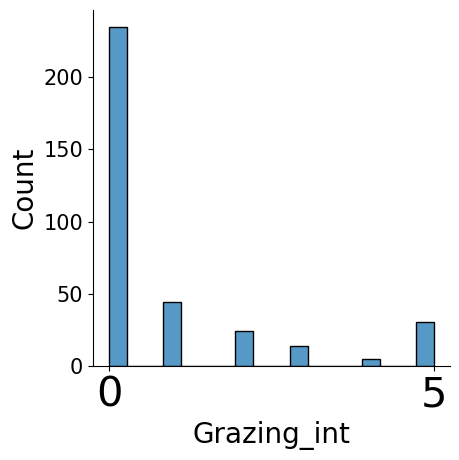

In [11]:
sns.displot(human_activity['Grazing_int'])

### Dataset 2 hydroperiod

In [12]:
hydroperiod = pd.read_csv('D2.4_Hydroperiod_20240116.csv')

In [13]:
hydroperiod.columns

Index(['PondCode', 'Hydro_expected', 'Hydro_observed', 'Pond_dries', 'Bio_cat',
       'Bio_date', 'Dryflux_date_summer', 'Dryflux_date_autumn',
       'Dryflux_method', 'Observations'],
      dtype='object')

### Dataset 3 LandUse_5m

In [14]:
LandUse_5m = pd.read_csv("D2.4_LandUse_5m_20240116.csv")


In [15]:
LandUse_5m.shape

(339, 17)

In [16]:
LandUse_5m

,PondCode,AssessmentDate,Perimeter,Woodland,Moorland,Rank_veg,Unimp_grassland,Semimp_grassland,Imp_grassland,Arable,Urban,Rock,Marsh,Streams,Other,Detail_OtherHabitatType,NOTES
0,AW1_EX1,2021-10-18,5,2,20,0,20,0,0,0,0,0,58,0,0,NaN,NaN
1,AW1_EX2,2021-10-08,5,35,15,0,50,0,0,0,0,0,0,0,0,NaN,NaN
2,AW1_IN1,2021-10-18,5,1,0,0,38,0,0,0,0,0,56,5,0,NaN,NaN
3,AW1_IN2,2021-10-08,5,40,0,0,0,30,0,0,0,0,30,0,0,NaN,NaN
4,AW1_NA1,2021-10-08,5,2,0,0,98,0,0,0,0,0,0,0,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
334,KA6,2022-08-10,5,10,0,25,20,0,0,0,0,30,10,5,0,NaN,0.0
335,SO2,2022-06-17,5,0,0,20,40,0,0,0,0,20,20,0,0,NaN,0.0
336,SO3,2022-06-01,5,20,0,15,30,10,0,0,0,10,15,0,0,NaN,0.0
337,SO4,2022-06-01,5,10,0,15,0,5,0,0,0,10,50,10,0,NaN,0.0


### Dataset 4 LandUse_100m

In [17]:
LandUse_100m=pd.read_csv('D2.4_LandUse_100m_20240116.csv')

In [18]:
LandUse_100m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES'],
      dtype='object')

In [19]:
LandUse_100m.shape

(340, 17)

### Dataset 5 PhysicoChemistry

In [20]:
PhysicoChemistry=pd.read_csv("D2.4_PhysicoChemistry_20240116.csv")

In [21]:
PhysicoChemistry.columns

Index(['PondCode', 'MeasurementDate', 'pH', 'O2_con', 'O2_sat', 'Turb',
       'Sludge', 'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC', 'TOC', 'CHLa', 'PC',
       'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg', 'Na', 'K', 'TSS',
       'NOTES', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3', 'CHLa_Spectro', 'NO23',
       'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU', 'P.PO4', 'N.NO2', 'N.NO3',
       'N.NH4', 'Notes..different.date.O2.spls.taken', 'pondscape', 'OM',
       'chl_a_cold.extraction', 'SRP'],
      dtype='object')

In [22]:
PhysicoChemistry.shape

(1195, 45)

In [23]:
PhysicoChemistry['pondscape'].unique()

array([nan, 'SC', 'ACH', 'LG', 'VC', 'LP'], dtype=object)

### Dataset 6 PondCharacteristics

In [24]:
PondCharacteristics=pd.read_csv('D2.4_PondCharacteristics_20240124.csv')

In [25]:
PondCharacteristics.columns

Index(['PondCode', 'AssessmentDate', 'Nat_res', 'Length', 'Width', 'Area',
       'Depth', 'Lit_slope', 'Soil_weirs', 'Burial', 'Imp_liner', 'Pond_man',
       'Pond_man_other', 'Geo_silt', 'Geo_Sand', 'Geo_Hard_rock', 'Geo_Peat',
       'Geo_limestone', 'Geo_other', 'Nat_turb', 'Water_odour', 'Pond_dries',
       'Dom_sed', 'Crud_plant', 'Rel_waterlev', 'Height_drop', 'Root_veg',
       'NonRoot_veg', 'Dom_plants_algae', 'Duckweed', 'Alloch_spec',
       'Emerse_per', 'Emerse_pond', 'Emerge_comm', 'Aut_trees',
       'Compl_belt_aut', 'Alloch_trees', 'Compl_belt_alt', 'Plantation',
       'Open_water', 'PVI', 'Shape', 'NOTES', 'Rel_waterlev.1', 'Rel_area',
       'FA', 'NOTE'],
      dtype='object')

### Dataset 6 PondIdentifier

In [26]:
PondIdentifier = pd.read_csv("D2.4_PondID_20240124.csv", encoding='latin-1')

In [27]:
PondIdentifier.columns

Index(['Pond_ID', 'PondCode', 'Local_Name', 'X', 'Y', 'Pondscape', 'Country',
       'DemoSite', 'Strat_Survey', 'Resampling', 'Case_Urban',
       'Case_FishPonds', 'Case_Restoration', 'NOTES', 'Case_Turkey'],
      dtype='object')

In [28]:
PondIdentifier.groupby('Country')['PondCode'].count()

Country
Belgium        78
Denmark        52
Germany        36
Spain          49
Switzerland    55
Turkey         60
UK             30
Uruguay        31
Name: PondCode, dtype: int64

In [29]:
PondIdentifier[PondIdentifier['Country']=='Spain']['Pondscape'].unique()

array(['Selva', 'Osona', 'Garrtoxa', 'Gavarres', 'Albera'], dtype=object)

### Join tables

In [30]:
joined_LandUse_5m =LandUse_5m.merge(PondIdentifier,on="PondCode",how="left")

In [31]:
joined_LandUse_5m['Woodland'] = joined_LandUse_5m['Woodland'].astype(float)

In [32]:
joined_LandUse_5m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES_x', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey'],
      dtype='object')

In [33]:
joined_LandUse_100m=LandUse_100m.merge(PondIdentifier,on="PondCode",how="left")

In [34]:
joined_physiochem_pre=PhysicoChemistry.merge(PondIdentifier,on="PondCode",how="left")


In [35]:
joined_physiochem_pre

,PondCode,MeasurementDate,pH,O2_con,O2_sat,Turb,Sludge,Snel,Cond,T,...,Pondscape,Country,DemoSite,Strat_Survey,Resampling,Case_Urban,Case_FishPonds,Case_Restoration,NOTES_y,Case_Turkey
0,AW1_EX1,2021-05-10,5.84,7.53,80.90,0.7,6.67,NaN,104.8,17.90,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
1,AW1_EX2,2021-05-20,6.26,7.98,80.10,2.79,1.67,26.00,18.67,17.60,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
2,AW1_IN1,2021-05-31,5.92,3.86,40.42,8.07,0,9.67,57.7,17.40,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
3,AW1_IN2,2021-05-20,6.28,0.84,7.70,19.68,3.67,12.00,298,11.60,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
4,AW1_NA1,2021-05-31,6.45,9.19,105.60,1.42,1,27.33,45.4,22.50,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1190,SO5,2022-06-08,7.44,8.44,127.04,222.4,NaN,NaN,106.46,28.31,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1191,SO5,2022-08-15,6.71,0.59,7.77,722.43,NaN,NaN,266.01,21.14,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1192,SO5,2022-08-22,6.80,1.35,17.66,726.9,NaN,NaN,466.84,21.74,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1193,SO5,2022-09-26,7.95,13.37,147.27,NaN,NaN,NaN,309.81,13.30,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0


In [36]:
joined_physiochem_pre.shape

(1195, 59)

In [37]:
for country in list(set(joined_physiochem_pre['Country'])):
    print(country)
    df_country=joined_physiochem_pre[joined_physiochem_pre['Country']==country]
    #print(len(df_country))
    print(len(df_country['Pondscape'].unique()))
    print(df_country['Pondscape'].unique())

nan
0
[]
Spain
5
['Selva' 'Osona' 'Garrtoxa' 'Albera' 'Gavarres']
UK
5
['Norfolk Bodham-Baconsthorpe' 'Norfolk Horningtoft-Brisley'
 'Norfolk Heydon' 'Lancashire' 'Cheshire']
Turkey
6
['Alpagut' 'Imrendi' 'Akbas' 'Ayas Yolu' 'Sorgun' 'Karacaoren']
Belgium
5
['Antwerp' 'East_Flanders' 'Flemish_Brabant' 'Hasselt' 'Bocholt']
Switzerland
7
['Jussy' 'Seymaz' 'Meyrin' 'Rhone' 'Versoix' 'Champagne' 'Urban']
Denmark
7
['RyHule' 'Avernako' 'Aero' 'Laven' 'Holstebro' 'Lystrup' 'Birkholm']
Germany
4
['MÃ¼ncheberg' 'SchÃ¶neiche' 'Lietzen' 'Quillow']
Uruguay
5
['Sierra de los Caracoles' 'Altos del Chorro' 'Laguna Garzon'
 'Valle del Cordillera' 'La Pedrera']


for country in list(set(joined_physiochem['Country'])):
    print(country)
    df_country=joined_physiochem[joined_physiochem['Country']==country]
    
    #print(len(df_country))
    print(len(df_country['Pondscape'].unique()))
    print(df_country['Pondscape'].unique())

In [38]:
joined_physiochem_pre['Case_Restoration'].unique()

array([ 0., nan])

In [39]:
joined_physiochem_pre[(joined_physiochem_pre['Country']=='Uruguay')&(joined_physiochem_pre['Pondscape']=='Sierra de los Caracoles')]

,PondCode,MeasurementDate,pH,O2_con,O2_sat,Turb,Sludge,Snel,Cond,T,...,Pondscape,Country,DemoSite,Strat_Survey,Resampling,Case_Urban,Case_FishPonds,Case_Restoration,NOTES_y,Case_Turkey
952,SCL1,2021-11-12,7.38,5.25,57.5,NaN,NaN,NaN,67.00,18.80,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
953,SCL2,2021-11-12,8.81,3.00,30.1,NaN,NaN,NaN,132.00,23.30,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
954,SCL3,2021-11-12,7.87,6.86,83.9,NaN,NaN,NaN,103.00,25.54,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
955,SCH1,2021-11-12,5.97,3.97,17.2,NaN,NaN,NaN,55.00,18.23,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
956,SCH2,2021-11-12,7.71,9.42,108.5,NaN,NaN,NaN,113.00,22.80,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
957,SCH3,2021-12-14,6.90,2.50,31.9,NaN,NaN,NaN,420.00,19.90,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
989,SCL1,2022-02-16,6.42,10.25,119.3,NaN,NaN,NaN,82.00,23.03,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
990,SCL2,2022-02-16,6.20,9.16,105.5,NaN,NaN,NaN,89.00,22.80,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
991,SCL3,2022-02-16,6.57,9.16,102.7,NaN,NaN,NaN,83.00,21.04,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN
992,SCH1,2022-02-16,6.09,4.41,56.2,NaN,NaN,NaN,112.00,25.38,...,Sierra de los Caracoles,Uruguay,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN


### Filtering 
???DemoSite: in priniciple we are not using this data

Strat_Survey: We are using this data: 6 ponds x 5 pondscapes x 8 countries = 240 ponds (2-3 samplings/year)

Resampling: We are using this data: 12 ponds/country were sampled during consecutive years

Case_Urban: we are not using this data

Case_Fish: we are not using this data

Case:Restoration: we are not using this data

In [40]:
joined_physiochem_pre.columns

Index(['PondCode', 'MeasurementDate', 'pH', 'O2_con', 'O2_sat', 'Turb',
       'Sludge', 'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC', 'TOC', 'CHLa', 'PC',
       'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg', 'Na', 'K', 'TSS',
       'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3', 'CHLa_Spectro',
       'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU', 'P.PO4', 'N.NO2',
       'N.NO3', 'N.NH4', 'Notes..different.date.O2.spls.taken', 'pondscape',
       'OM', 'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey'],
      dtype='object')

In [41]:
joined_physiochem_pre.shape

(1195, 59)

In [213]:
joined_physiochem_pre['TP'].sort_values(ascending=False)

166     75.000
167     45.000
471      6.448
465      4.980
157      4.017
         ...  
985        NaN
1007       NaN
1026       NaN
1029       NaN
1054       NaN
Name: TP, Length: 1195, dtype: float64

In [214]:
joined_physiochem_pre.drop([166,167],inplace=True)

In [215]:
joined_physiochem_pre['TOC'].sort_values(ascending=False)

1048     <4
1181     <4
1075     <4
1074     <4
1066     <4
       ... 
1042    NaN
1043    NaN
1044    NaN
1059    NaN
1182    NaN
Name: TOC, Length: 1193, dtype: object

In [216]:
joined_physiochem_pre.drop([145,352],inplace=True)

In [42]:
###criterions 
#joined_physiochem=joined_physiochem_pre[joined_physiochem_pre['DemoSite']==0]

joined_physiochem = joined_physiochem_pre[(joined_physiochem_pre['Strat_Survey'] == 1) | (joined_physiochem_pre['Resampling'] == 1)]

joined_physiochem=joined_physiochem[joined_physiochem['Case_Urban']==0]
joined_physiochem=joined_physiochem[joined_physiochem['Case_FishPonds']==0]
joined_physiochem=joined_physiochem[joined_physiochem['Case_Restoration']==0]


In [43]:
joined_physiochem.shape

(1064, 59)

In [85]:
joined_physiochem['TP'].sort_values(ascending=False)

166     75.000
167     45.000
471      6.448
465      4.980
157      4.017
         ...  
985        NaN
1007       NaN
1026       NaN
1029       NaN
1054       NaN
Name: TP, Length: 1064, dtype: float64

In [94]:
joined_physiochem.drop([166,167],inplace=True)

In [114]:
joined_physiochem['TOC'].sort_values(ascending=False)

145     296.3
352     249.1
360     135.1
378     116.9
829     109.7
        ...  
1042      NaN
1043      NaN
1044      NaN
1059      NaN
1182      NaN
Name: TOC, Length: 1062, dtype: float64

In [115]:
joined_physiochem.drop([145,352],inplace=True)

In [95]:
joined_physiochem.shape

(1062, 60)

In [45]:
joined_physiochem['TN/TP']=joined_physiochem['TN']/joined_physiochem['TP']

In [46]:
joined_physiochem.columns

Index(['PondCode', 'MeasurementDate', 'pH', 'O2_con', 'O2_sat', 'Turb',
       'Sludge', 'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC', 'TOC', 'CHLa', 'PC',
       'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg', 'Na', 'K', 'TSS',
       'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3', 'CHLa_Spectro',
       'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU', 'P.PO4', 'N.NO2',
       'N.NO3', 'N.NH4', 'Notes..different.date.O2.spls.taken', 'pondscape',
       'OM', 'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey', 'TN/TP'],
      dtype='object')

In [48]:
variables = ['TN', 'TP', 'TOC', 'DOC', 'O2_con', 'O2_sat', 'Cond','TN/TP']

In [122]:
joined_physiochem['TN/TP'].sort_values(ascending=False)

190     392.500000
317     264.285714
14      190.277778
1066    168.611111
246     157.600000
           ...    
1065           NaN
1067           NaN
1087           NaN
1089           NaN
1182           NaN
Name: TN/TP, Length: 1060, dtype: float64

In [79]:
def convert_datasets(variables,dataset):
    dataset['TN/TP']=dataset['TN']/dataset['TP']
    for i in variables:
        if dataset[i].dtype != 'float64':
            print(i)
        if '<4' in dataset[i].unique():
            dataset[i].replace('<4', 3.5, inplace=True)  # Replace '<4' with 3.5
            dataset[i] = joined_physiochem[i].astype(float)
        if dataset[i].dtype != 'float64':
            #print(dataset[i].unique())
            dataset[i] = dataset[i].str.replace(' ', '').str.replace(',', '')
            dataset[i] = dataset[i].astype(float)
            

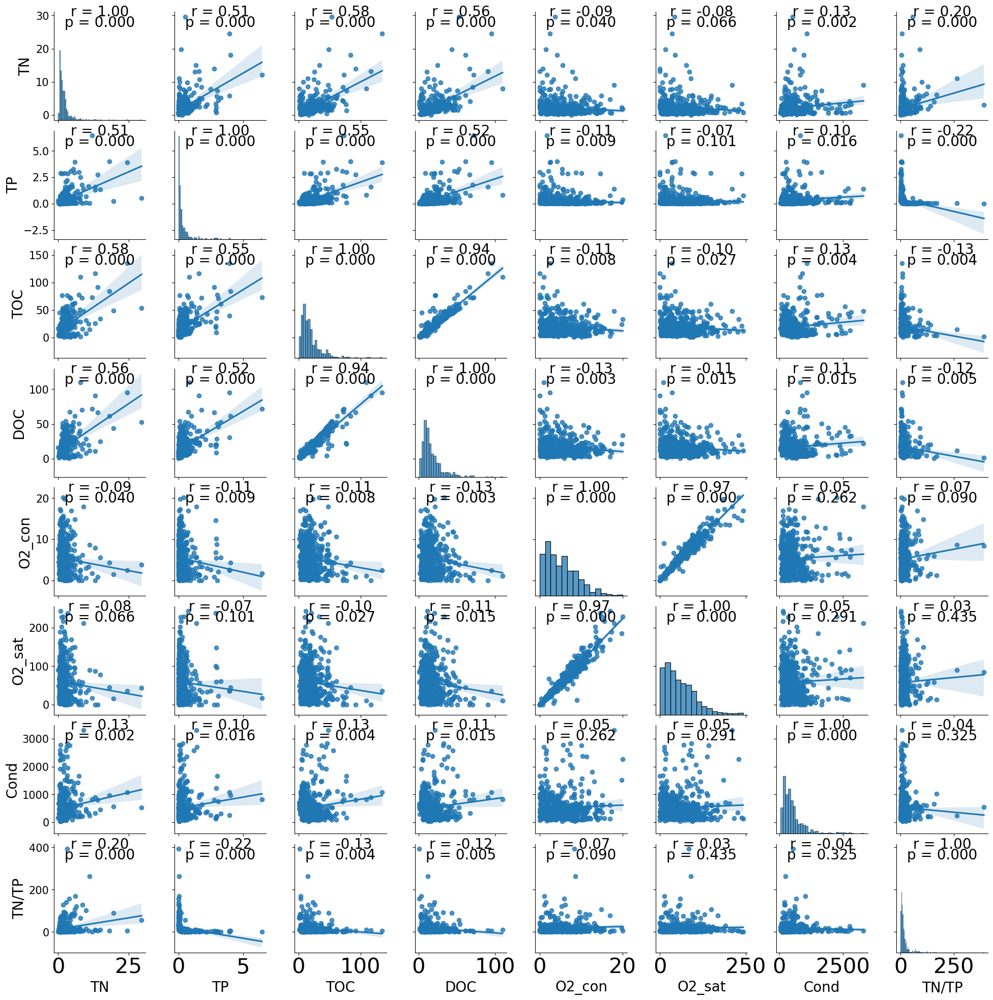

In [152]:
def corrfunc(x, y, **kws):
    (r, p) = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(0.5, 0.96), xycoords=ax.transAxes, ha='center')
    ax.annotate("p = {:.3f}".format(p),
                xy=(0.5, 0.86), xycoords=ax.transAxes, ha='center')

# Create the pairplot
graph = sns.pairplot(joined_physiochem[variables].dropna(), kind='reg')

# Map the correlation function to the pairplot
graph.map(corrfunc)

# Show the plot
plt.show()

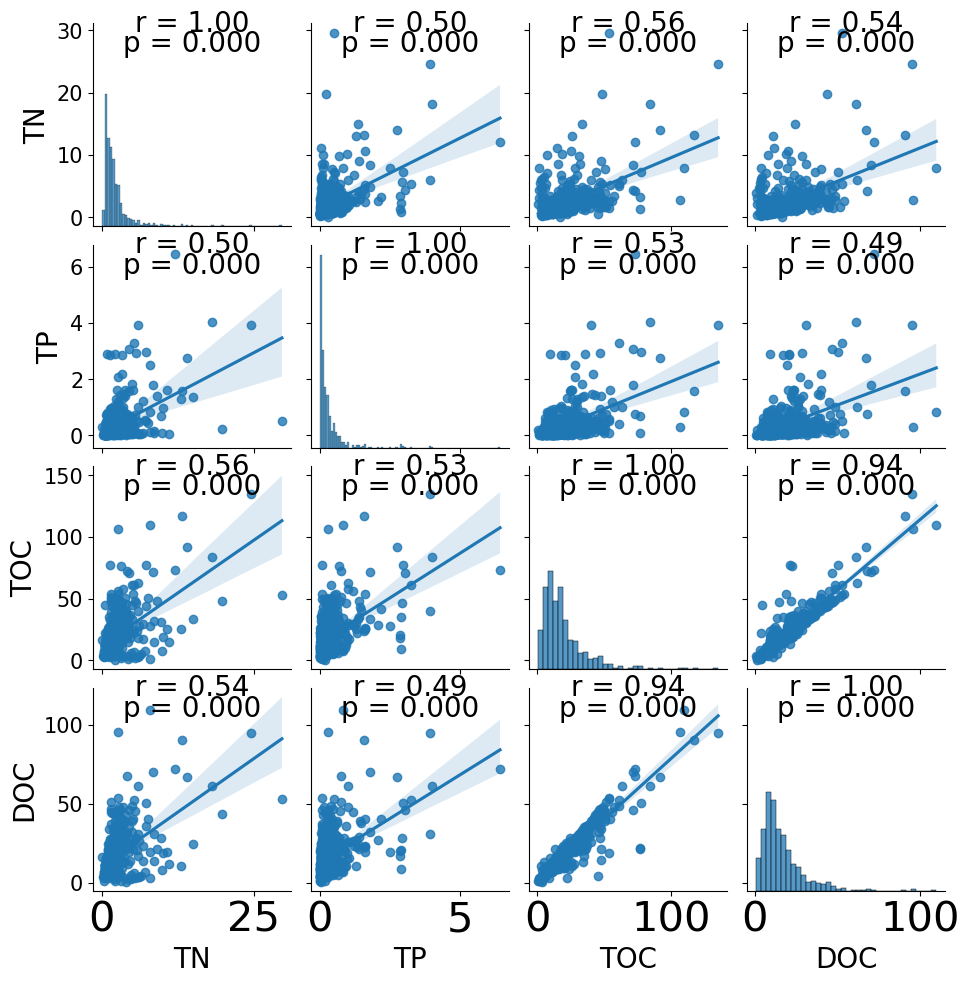

In [154]:
def corrfunc(x, y, **kws):
    (r, p) = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(0.5, 0.96), xycoords=ax.transAxes, ha='center')
    ax.annotate("p = {:.3f}".format(p),
                xy=(0.5, 0.86), xycoords=ax.transAxes, ha='center')

# Create the pairplot
graph = sns.pairplot(joined_physiochem[['TN','TP','TOC','DOC']].dropna(), kind='reg'.)

# Map the correlation function to the pairplot
graph.map(corrfunc)

# Show the plot
plt.show()

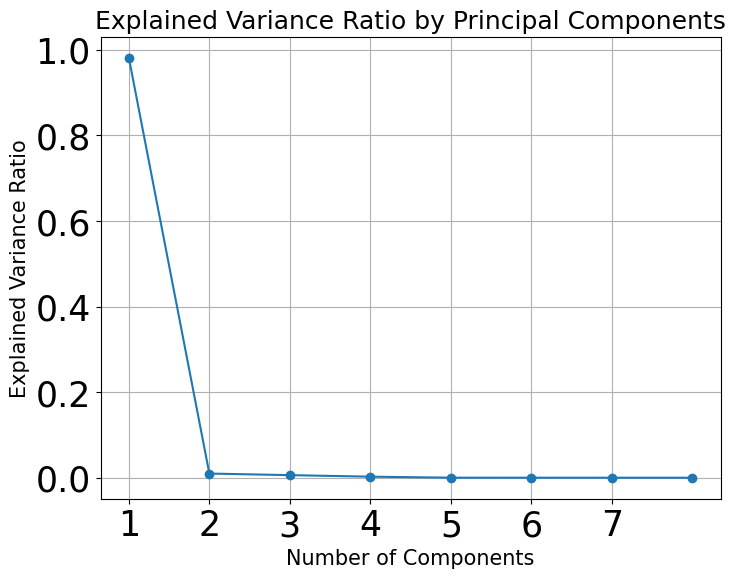

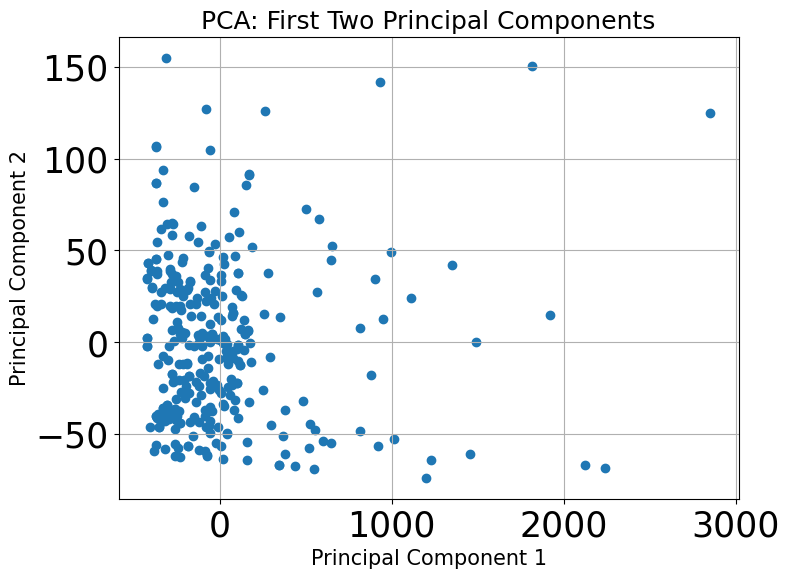

In [433]:


# Extract the data
df_clean= joined_physico_human_activity[joined_physico_human_activity[variables].notnull()]
X =df_clean[variables].dropna()

# Perform PCA
pca = PCA()
X_pca = pca.fit_transform(X)

# Visualize explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Components')
plt.xticks(range(1,8))
plt.grid(True)
plt.show()

# Visualize PCA results (e.g., first two principal components)
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: First Two Principal Components')
plt.grid(True)
plt.show()


In [467]:
variables = ['TN', 'TP', 'TOC', 'DOC', 'O2_con', 'O2_sat', 'Cond', 'TN/TP']

# Ensure that 'joined_physico_human_activity' contains your dataset
# Filter out rows with missing values and select only the columns defined in 'variables'
df_clean = joined_physico_human_activity.dropna(subset=variables)[variables]

# Perform PCA
pca = PCA()
X_pca = pca.fit_transform(df_clean)

In [480]:
joined_physico_human_activity.loc[df_clean.index, 'Grazing_int'].unique()

array([0, 5, 1, 2, 3])

In [482]:
# Creating DataFrame for PCA results
pca_df = pd.DataFrame(data=X_pca[:, :2], columns=['PC1', 'PC2'])

In [483]:
pca_df

,PC1,PC2
0,-83.852586,36.536596
1,-92.349118,-18.537473
2,-59.337531,104.584712
3,-1.286217,-9.413020
4,-327.057420,-35.893758
...,...,...
311,-72.673373,-61.243851
312,-359.396282,-11.713638
313,-173.545045,-43.347954
314,-232.696134,4.218207


In [491]:
joined_physico_human_activity.loc[df_clean.index, 'Grazing_int'].dtype

dtype('int64')

In [486]:
pca_df['Grazing_int'] = joined_physico_human_activity.loc[df_clean.index, 'Grazing_int']

dtype('float64')

In [490]:
len(pca_df['Grazing_int'])

316

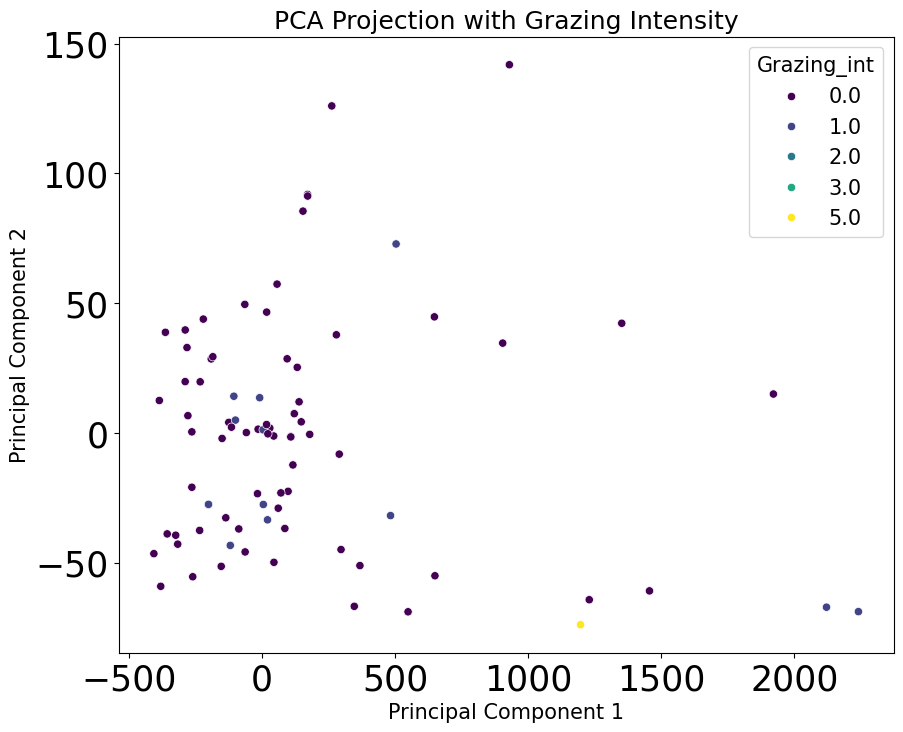

In [493]:


# Adding 'Grazing_int' column to the PCA DataFrame
pca_df['Grazing_int'] = joined_physico_human_activity.loc[df_clean.index, 'Grazing_int']

# Plotting PCA results with Seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue=joined_physico_human_activity.loc[df_clean.index, 'Grazing_int'], palette='viridis', legend='full')
plt.title('PCA Projection with Grazing Intensity')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [459]:
X_pca.shape

(316, 8)

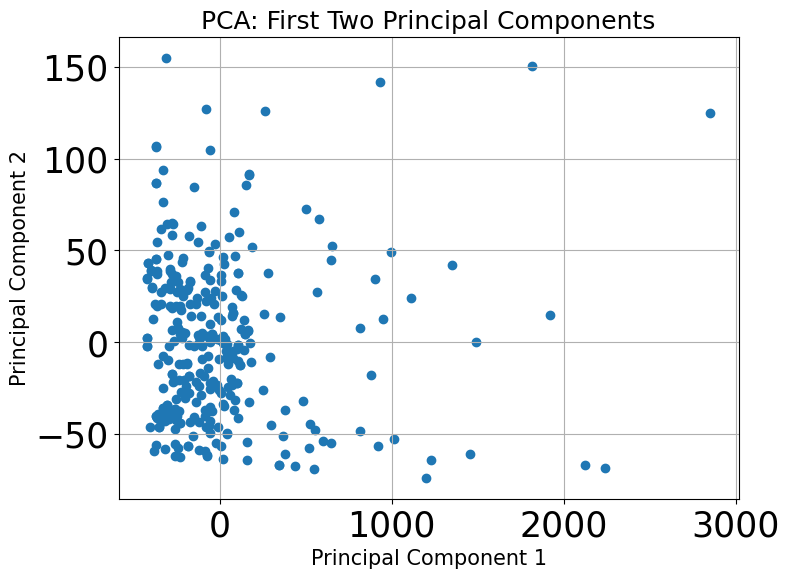

In [452]:

# Visualize PCA results (e.g., first two principal components)
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1],)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: First Two Principal Components')
plt.grid(True)
plt.show()

In [461]:
X.shape

(1502, 8)

In [426]:
joined_physico_human_activity['TN'].dtype

dtype('float64')

<Axes: xlabel='TN', ylabel='TP'>

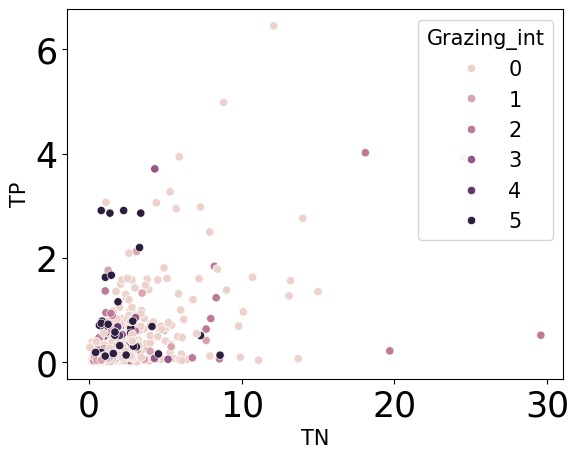

In [427]:
sns.scatterplot(data=joined_physico_human_activity,x='TN',y='TP',hue='Grazing_int')

In [421]:
sns.scatterplot(X_pca[:, 0], X_pca[:, 1],hue='Grazing_int')

TypeError: scatterplot() takes from 0 to 1 positional arguments but 2 positional arguments (and 1 keyword-only argument) were given

In [418]:

fig = plt.scatter(components, x=0, y=1, color=joined_physico_human_activity['Grazing_int'])
fig.show()

TypeError: scatter() got multiple values for argument 'x'

In [415]:
X.shape

(1502, 8)

In [409]:
joined_physiochem[joined_physiochem[variables].notnull()]

,PondCode,MeasurementDate,pH,O2_con,O2_sat,Turb,Sludge,Snel,Cond,T,...,Strat_Survey,Resampling,Case_Urban,Case_FishPonds,Case_Restoration,NOTES_y,Case_Turkey,TN/TP,Month,Year
0,NaN,NaT,NaN,7.53,80.90,NaN,NaN,NaN,104.80,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.413793,NaN,NaN
1,NaN,NaT,NaN,7.98,80.10,NaN,NaN,NaN,18.67,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.636364,NaN,NaN
2,NaN,NaT,NaN,3.86,40.42,NaN,NaN,NaN,57.70,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.359462,NaN,NaN
3,NaN,NaT,NaN,0.84,7.70,NaN,NaN,NaN,298.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.263158,NaN,NaN
4,NaN,NaT,NaN,9.19,105.60,NaN,NaN,NaN,45.40,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.947368,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1190,NaN,NaT,NaN,8.44,127.04,NaN,NaN,NaN,106.46,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.214286,NaN,NaN
1191,NaN,NaT,NaN,0.59,7.77,NaN,NaN,NaN,266.01,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.913793,NaN,NaN
1192,NaN,NaT,NaN,1.35,17.66,NaN,NaN,NaN,466.84,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.136364,NaN,NaN
1193,NaN,NaT,NaN,13.37,147.27,NaN,NaN,NaN,309.81,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.361111,NaN,NaN


In [157]:
joined_physiochem[['TN','MeasurementDate']]

,TN,MeasurementDate
0,1.30,2021-05-10
1,0.90,2021-05-20
2,3.00,2021-05-31
3,2.60,2021-05-20
4,1.10,2021-05-31
...,...,...
1190,0.87,2022-06-08
1191,1.11,2022-08-15
1192,2.73,2022-08-22
1193,1.57,2022-09-26


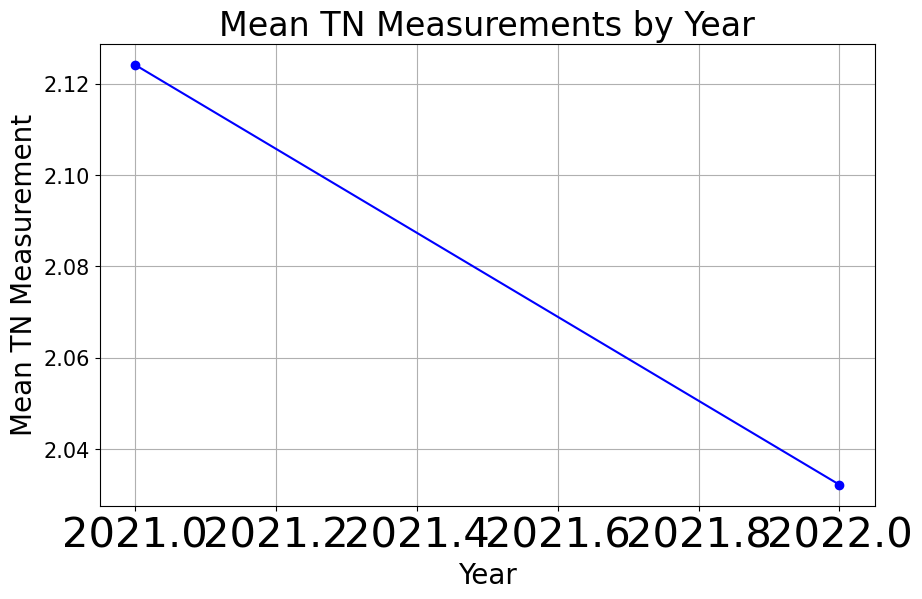

In [165]:
# Convert 'MeasurementDate' to datetime
joined_physiochem['MeasurementDate'] = pd.to_datetime(joined_physiochem['MeasurementDate'])

# Extract year from 'MeasurementDate'
joined_physiochem['Year'] = joined_physiochem['MeasurementDate'].dt.year

# Group by year and calculate mean TN value
monthly_mean_TN = joined_physiochem.groupby('Year')['TN'].mean()

# Plot
plt.figure(figsize=(10, 6))
monthly_mean_TN.plot(marker='o', color='blue', linestyle='-')
plt.title('Mean TN Measurements by Year')
plt.xlabel('Year')
plt.ylabel('Mean TN Measurement')
plt.grid(True)
plt.show()

In [ ]:
joined_physiochem['TN',]

In [ ]:
sns.pairplot(joined_physiochem[variables], diag_kind='kde', kind='scatter')
plt.show()
correlation_matrix = joined_physiochem[variables].corr()
print("Correlation Matrix:")
print(correlation_matrix)

In [55]:
correlation_matrix = joined_physiochem[variables].corr()
print("Correlation Matrix:")
print(f"{correlation_matrix}")

Correlation Matrix:
              TN        TP       TOC       DOC    O2_con    O2_sat      Cond  \
TN      1.000000  0.083016  0.515579  0.536267 -0.115377 -0.110800  0.176117   
TP      0.083016  1.000000  0.092021  0.093002  0.057191  0.043991  0.005740   
TOC     0.515579  0.092021  1.000000  0.956198 -0.046579 -0.057763  0.102810   
DOC     0.536267  0.093002  0.956198  1.000000 -0.104530 -0.089307  0.169809   
O2_con -0.115377  0.057191 -0.046579 -0.104530  1.000000  0.802138 -0.055728   
O2_sat -0.110800  0.043991 -0.057763 -0.089307  0.802138  1.000000 -0.024860   
Cond    0.176117  0.005740  0.102810  0.169809 -0.055728 -0.024860  1.000000   
TN/TP   0.237644 -0.069831 -0.116897 -0.094582  0.025416  0.003867 -0.006706   

           TN/TP  
TN      0.237644  
TP     -0.069831  
TOC    -0.116897  
DOC    -0.094582  
O2_con  0.025416  
O2_sat  0.003867  
Cond   -0.006706  
TN/TP   1.000000  


float64
TN
Full range for TN: (0.05,29.60)
Range for TN in Belgium: (0.70,29.60)


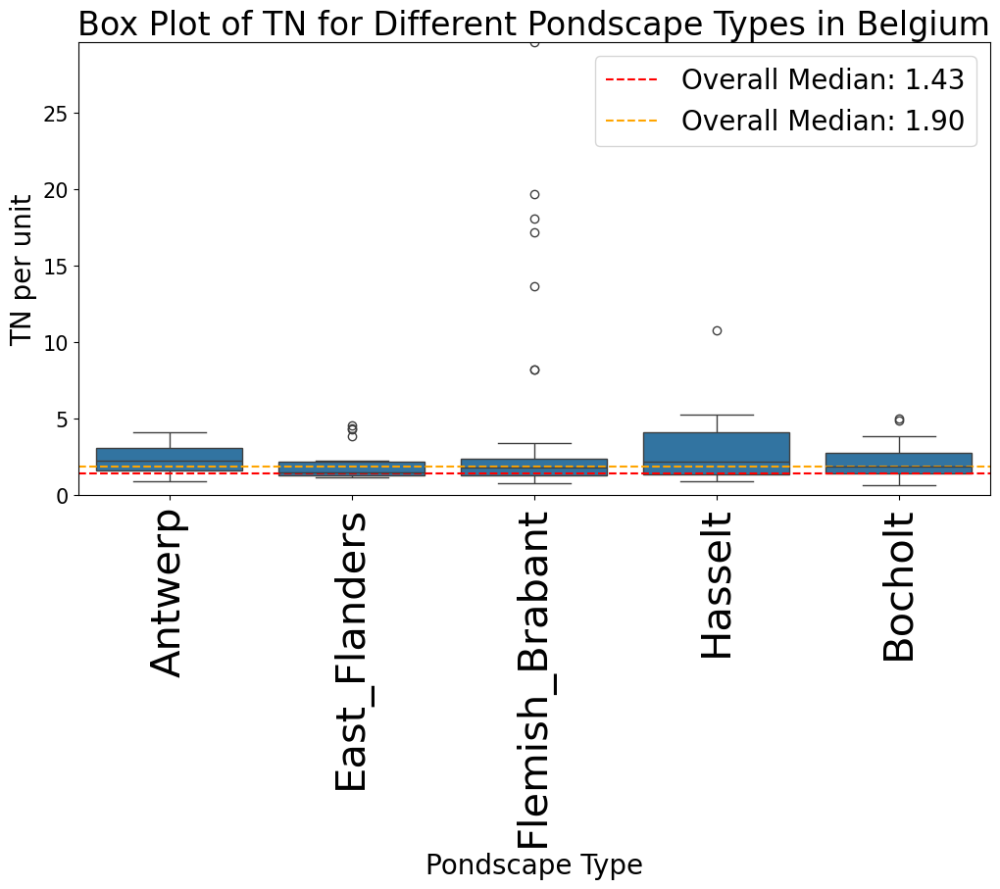

Range for TN in Switzerland: (0.44,11.10)


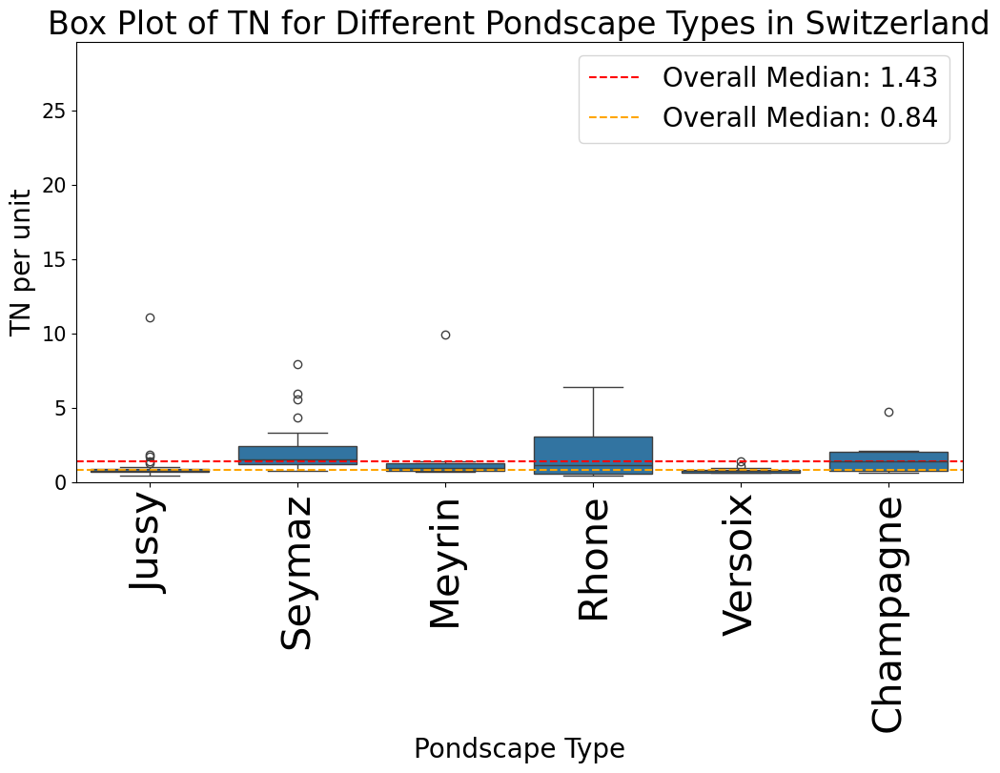

Range for TN in Germany: (0.70,24.50)


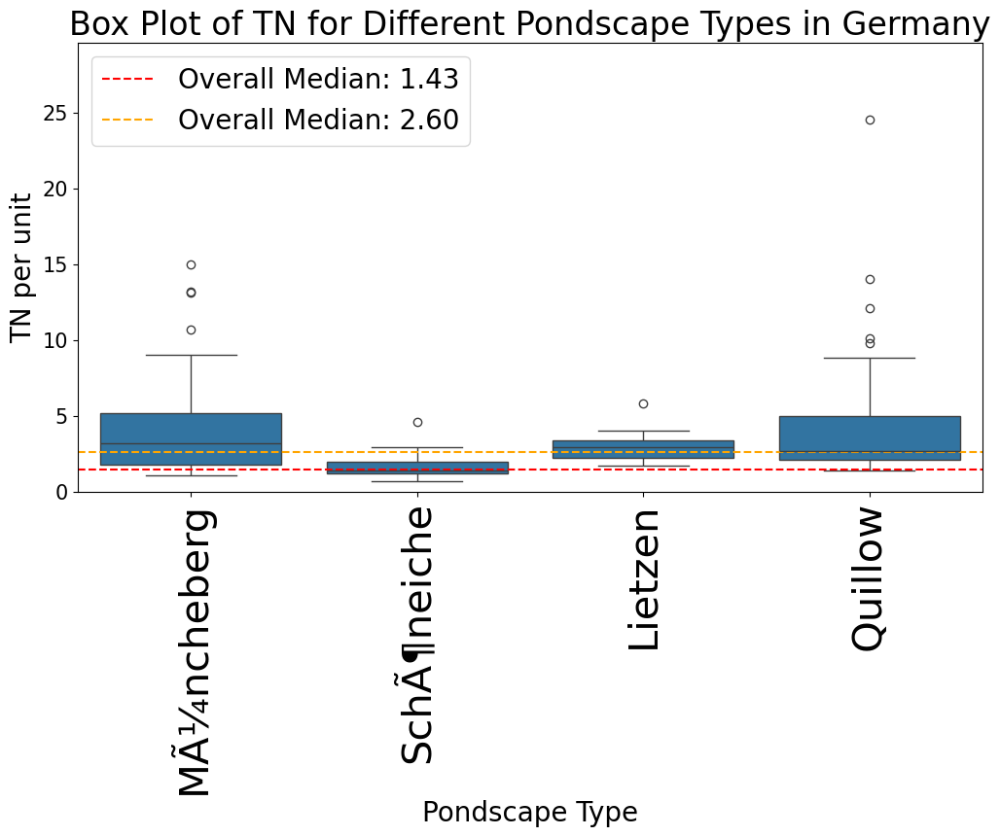

Range for TN in Denmark: (0.17,8.32)


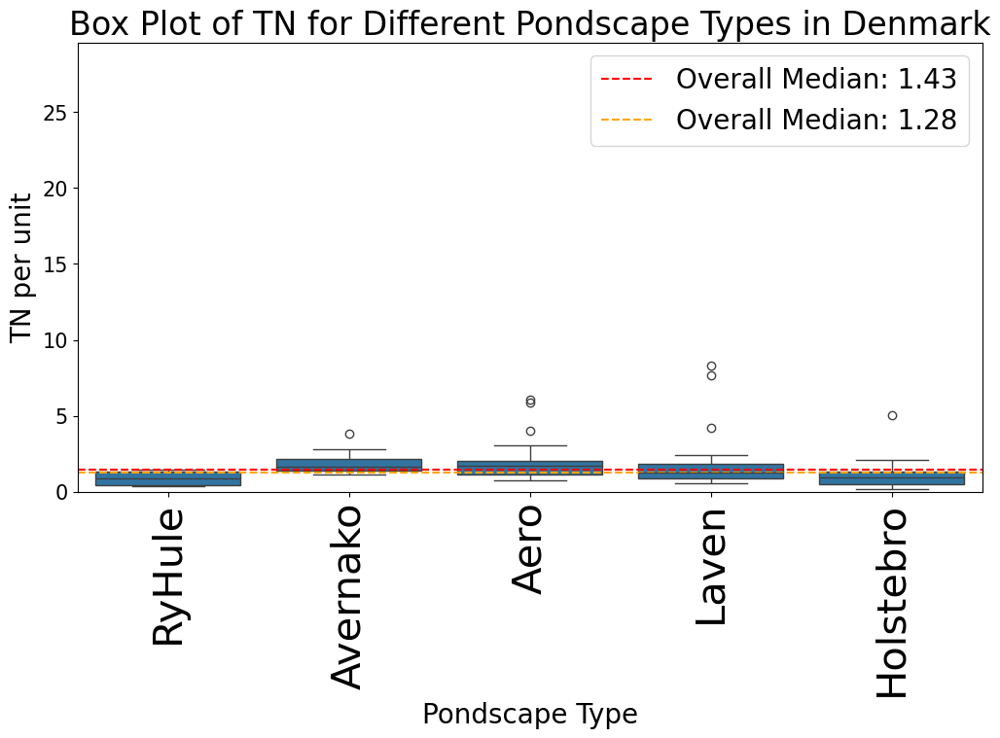

Range for TN in Spain: (0.33,8.58)


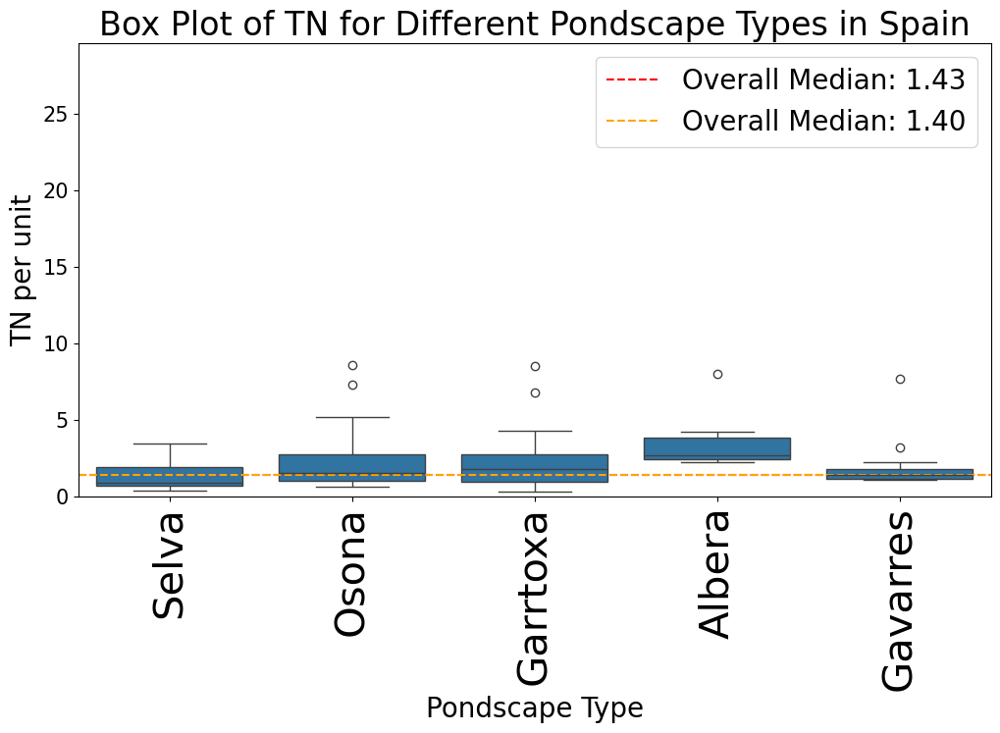

Range for TN in UK: (0.63,5.37)


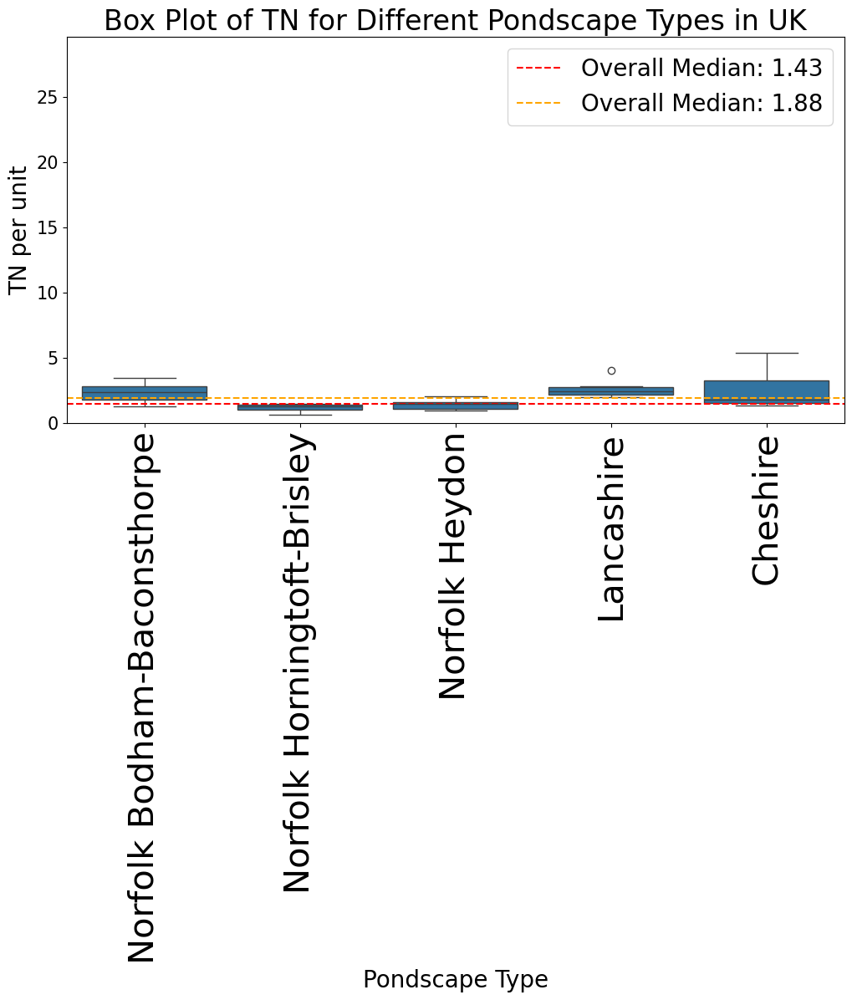

Range for TN in Uruguay: (0.31,2.86)


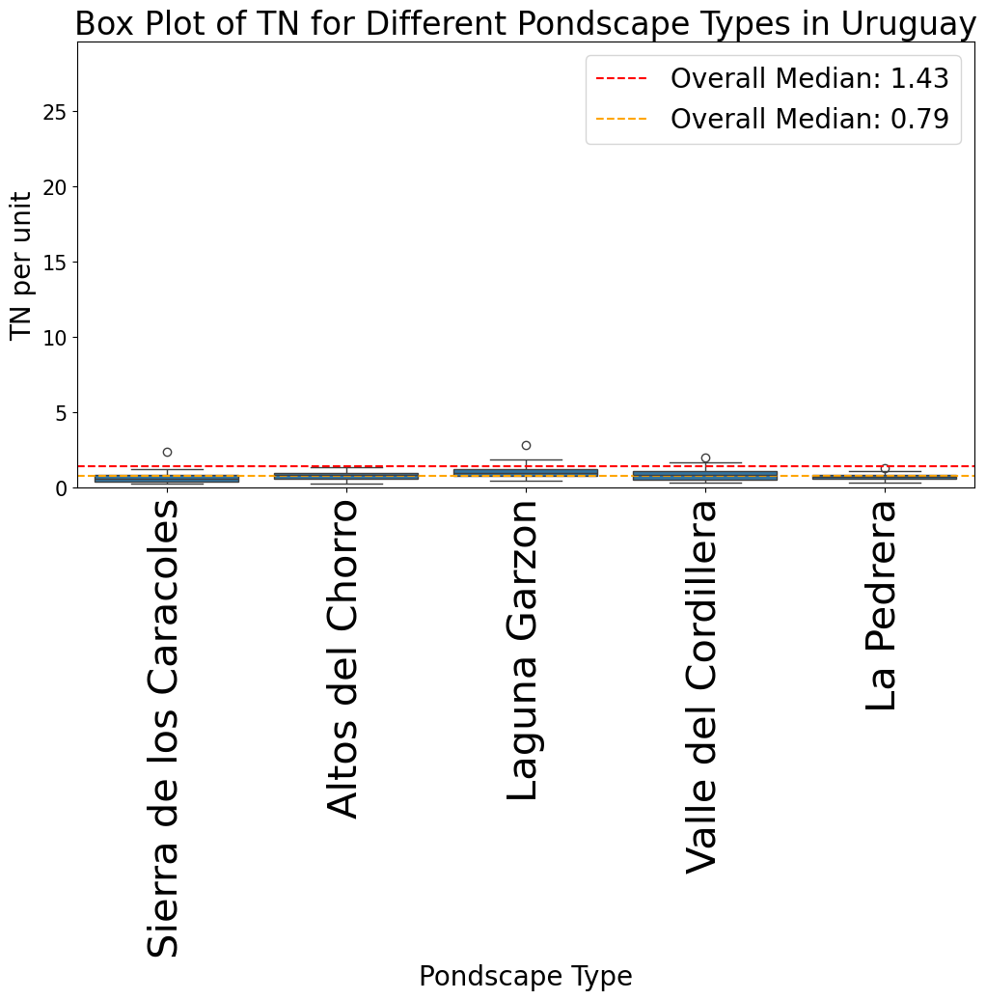

Range for TN in Turkey: (0.05,7.04)


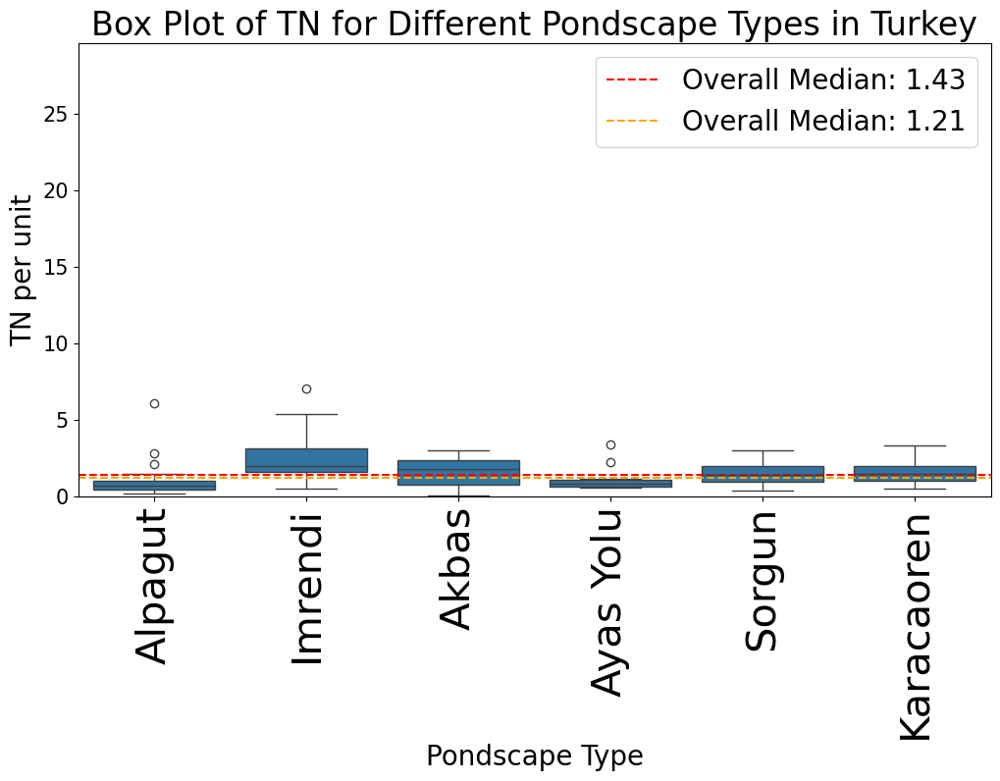

float64
TP
Full range for TP: (0.01,75.00)
Range for TP in Belgium: (0.01,75.00)


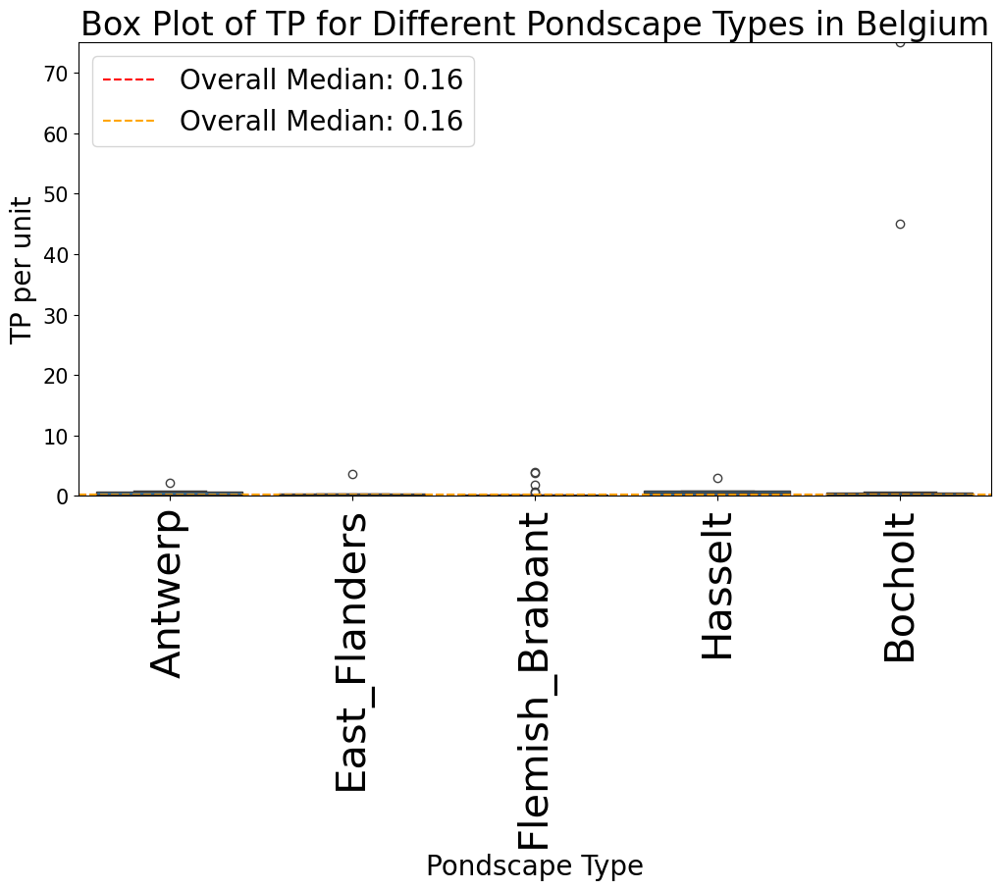

Range for TP in Switzerland: (0.01,0.69)


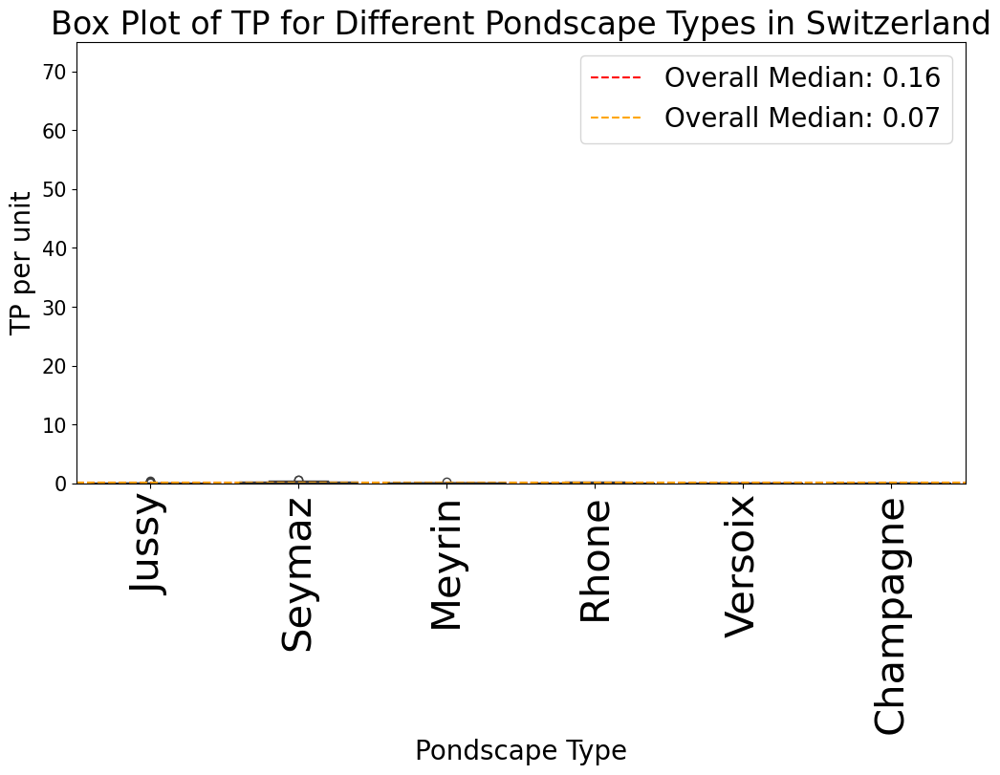

Range for TP in Germany: (0.03,6.45)


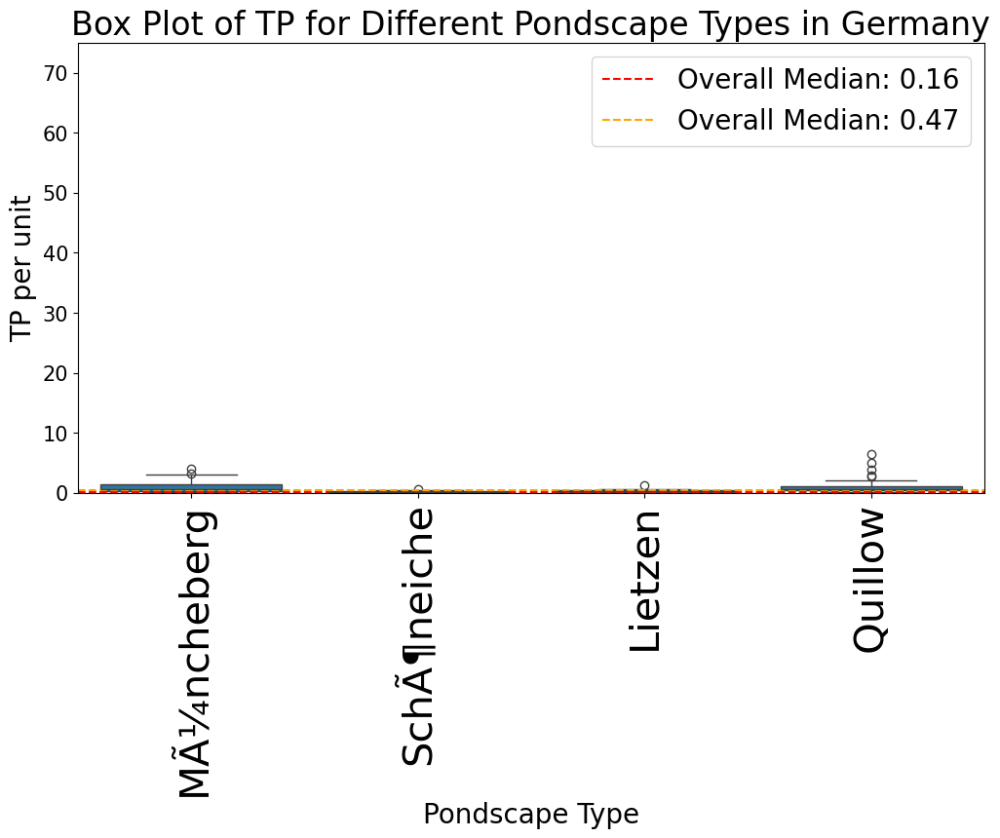

Range for TP in Denmark: (0.03,1.76)


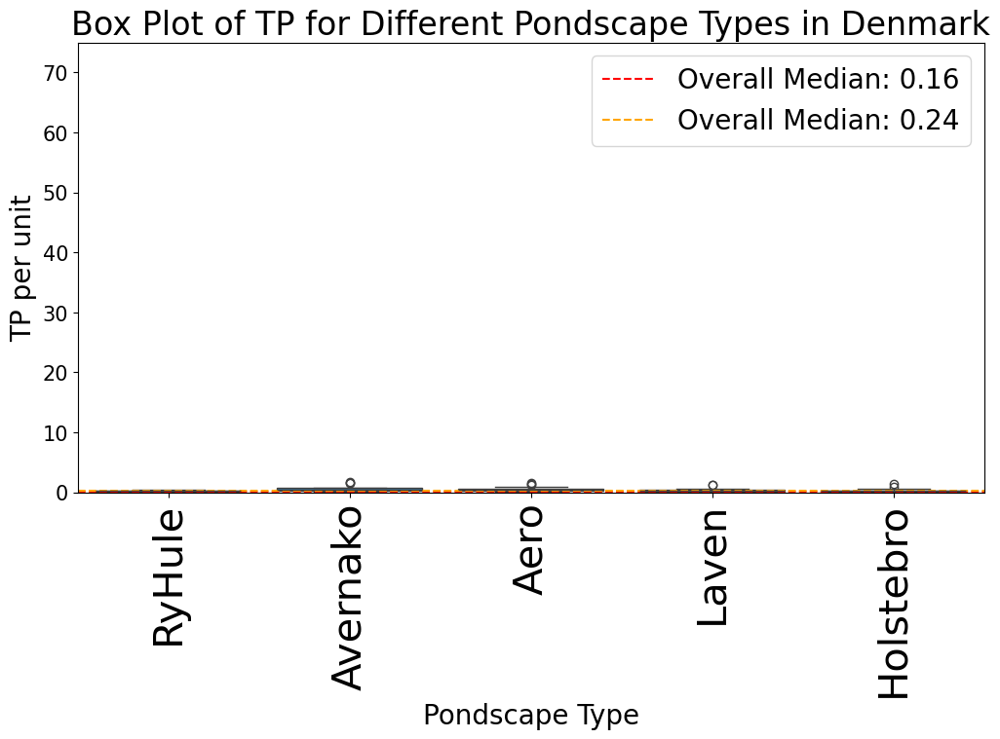

Range for TP in Spain: (0.01,0.99)


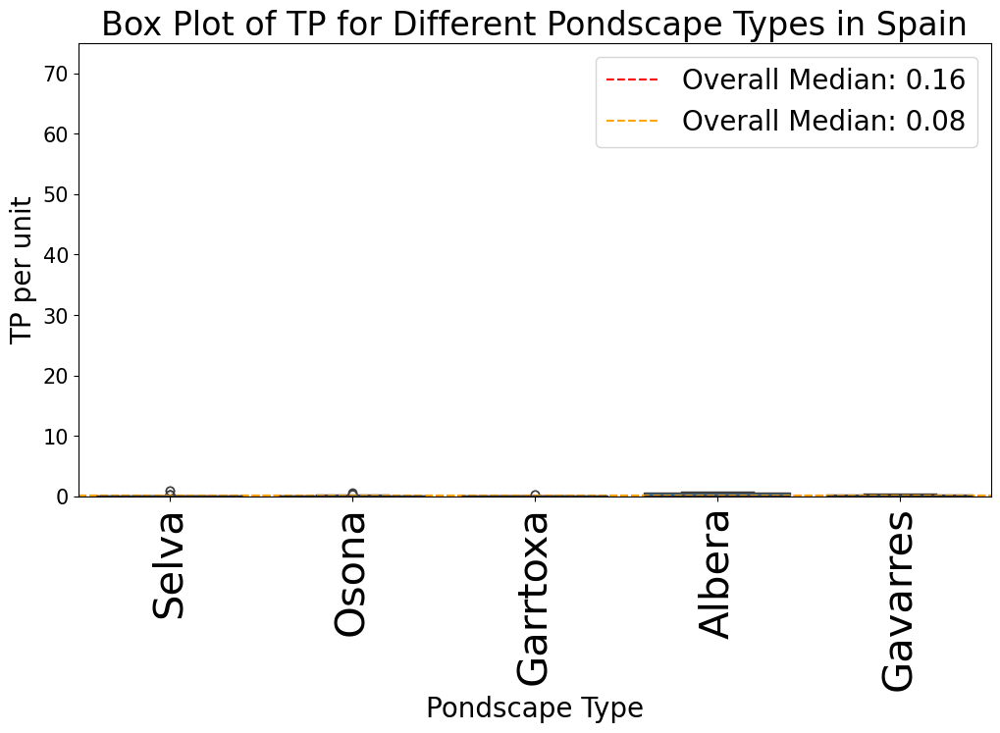

Range for TP in UK: (0.01,1.33)


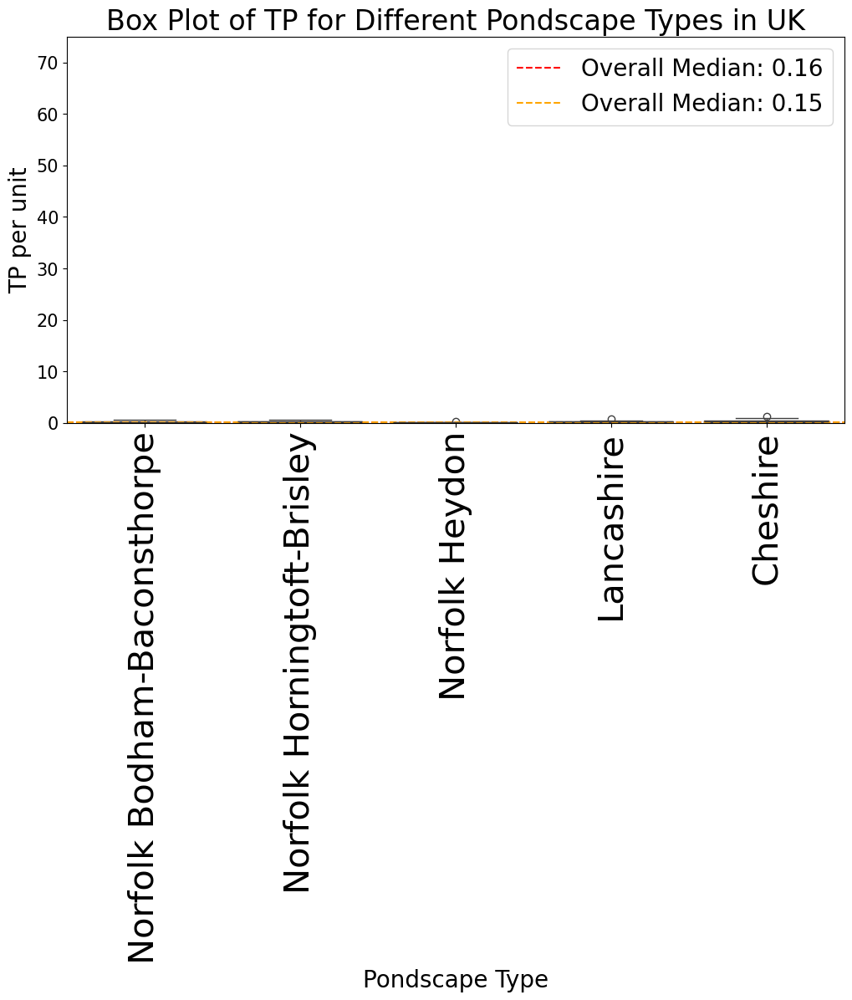

Range for TP in Uruguay: (0.03,1.67)


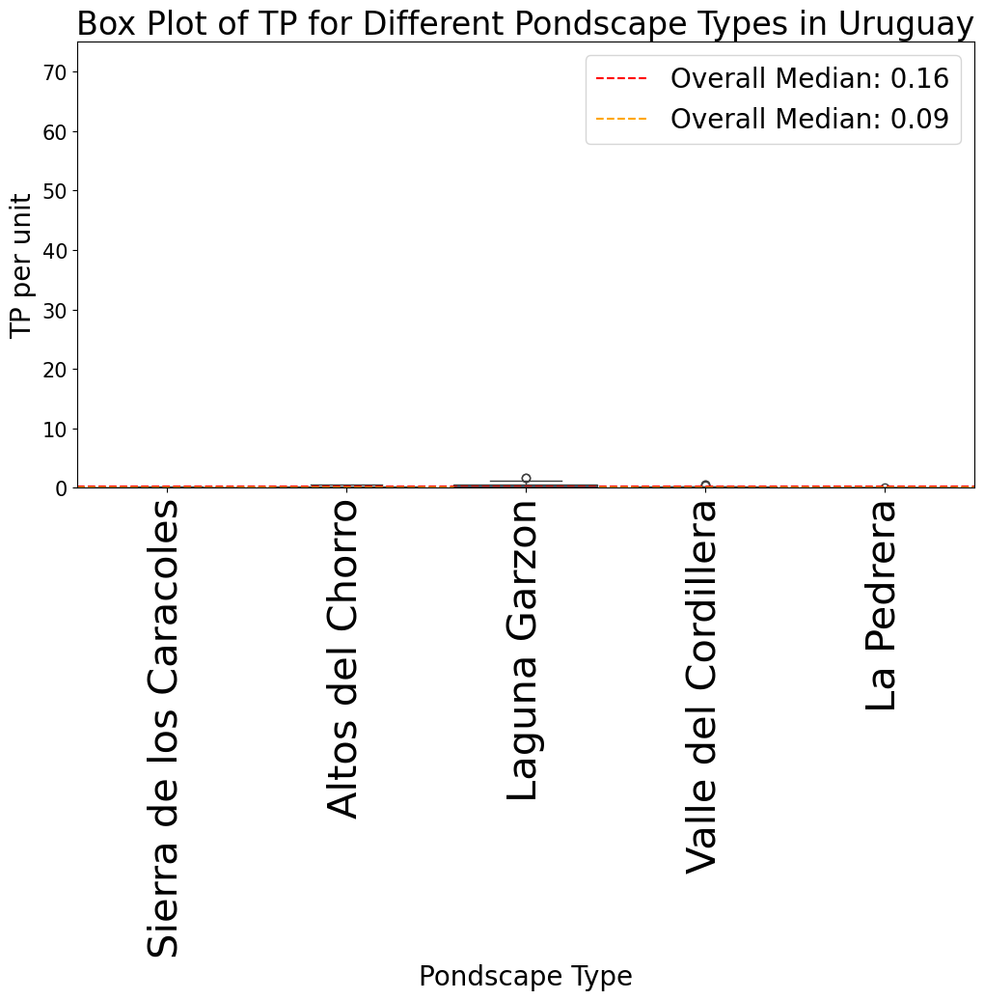

Range for TP in Turkey: (0.02,2.91)


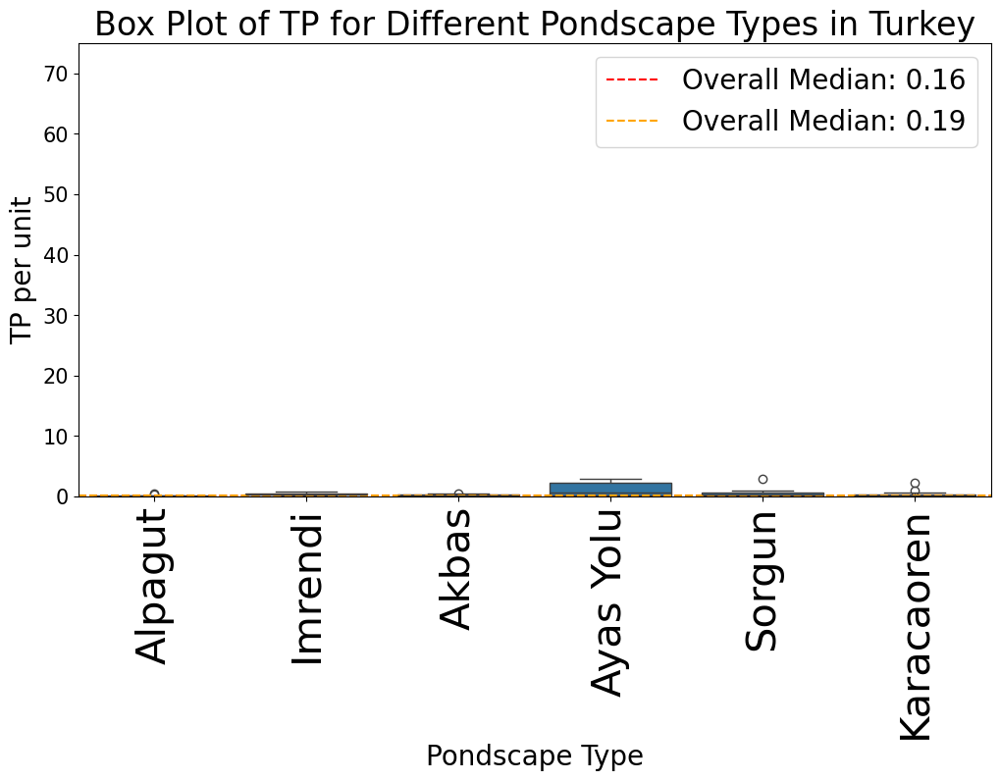

float64
TOC
Full range for TOC: (0.70,296.30)
Range for TOC in Belgium: (7.40,296.30)


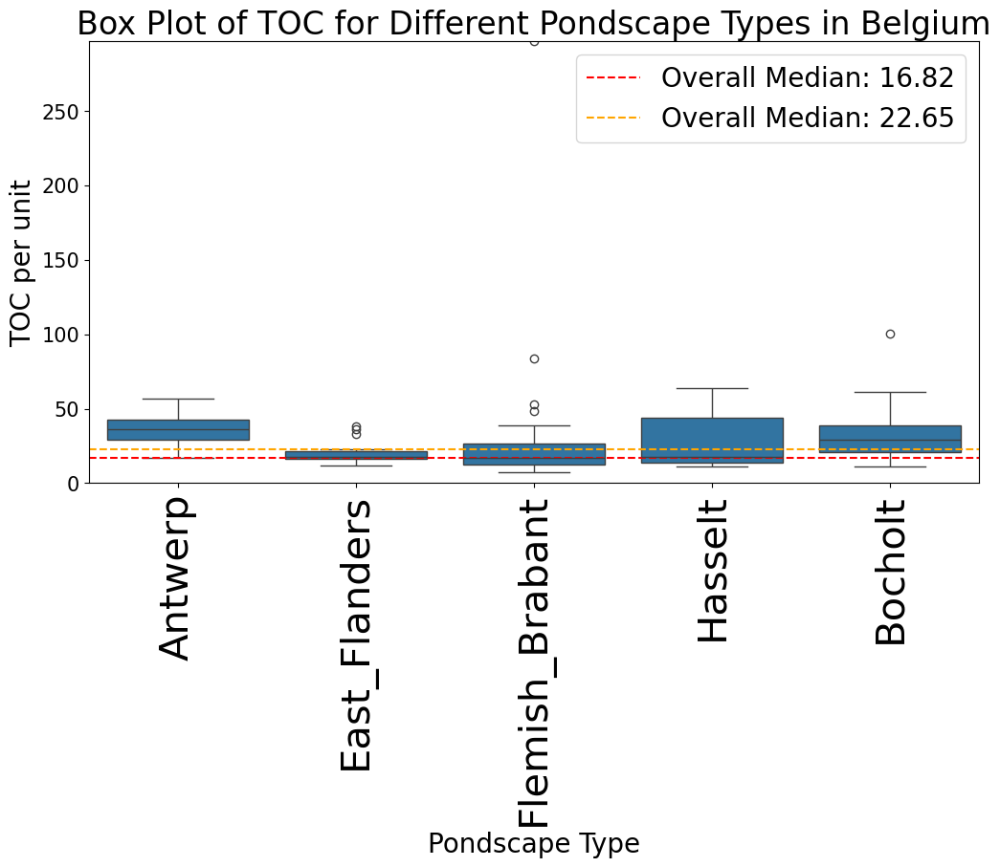

Range for TOC in Switzerland: (0.70,77.00)


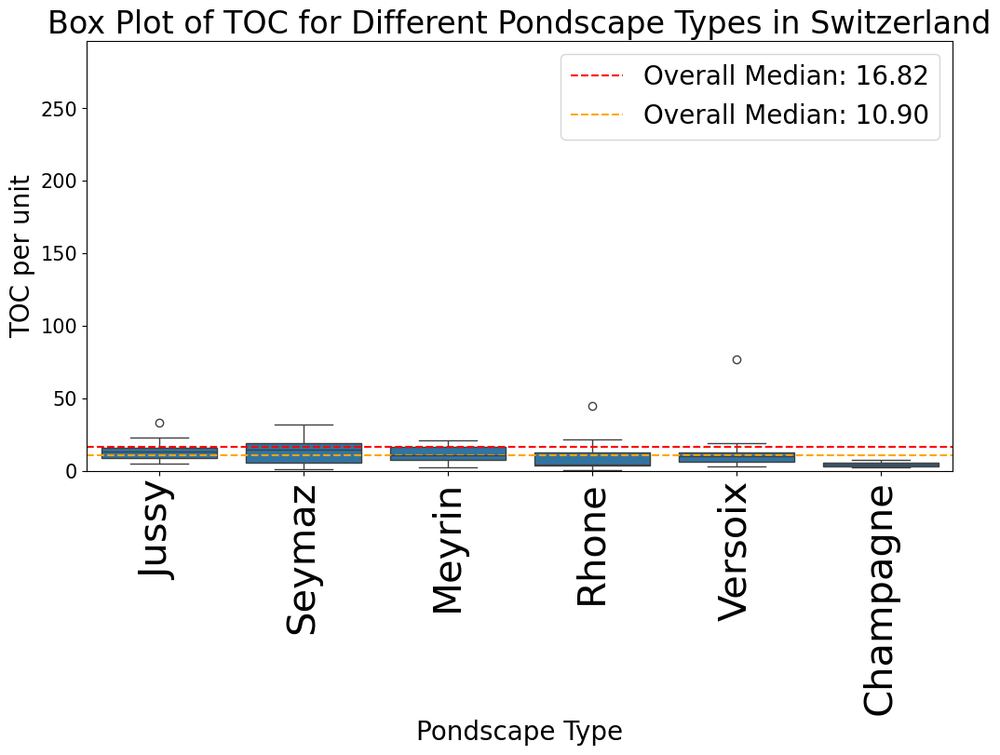

Range for TOC in Germany: (7.30,249.10)


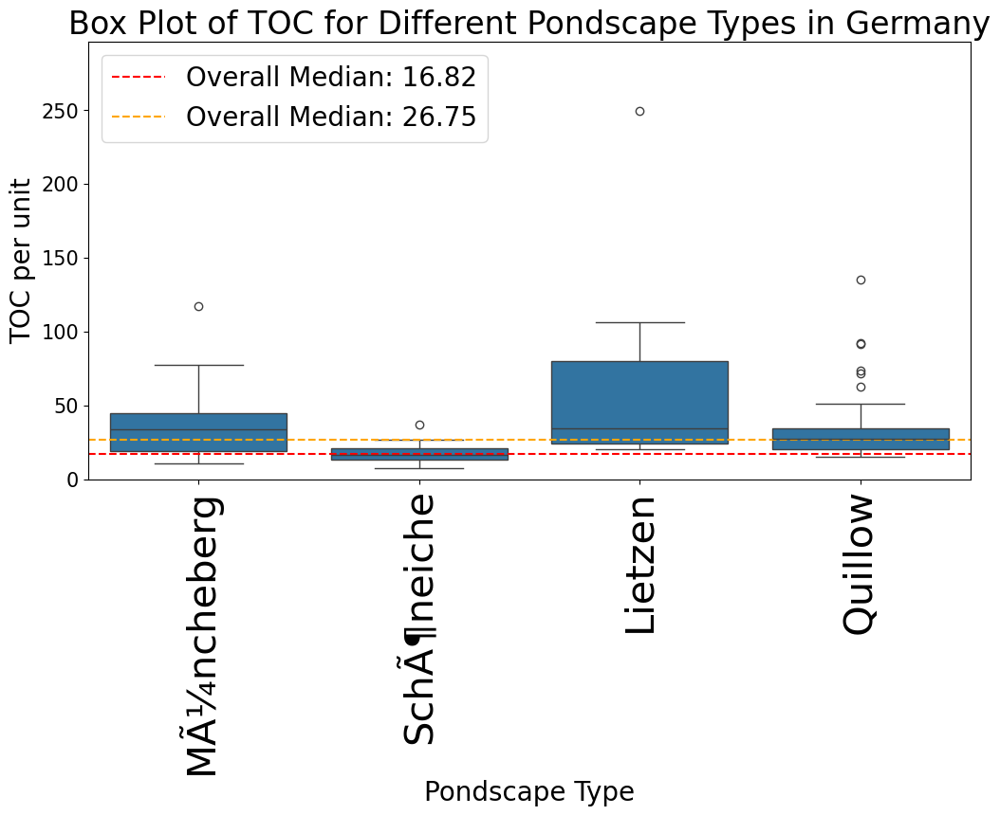

Range for TOC in Spain: (3.09,109.70)


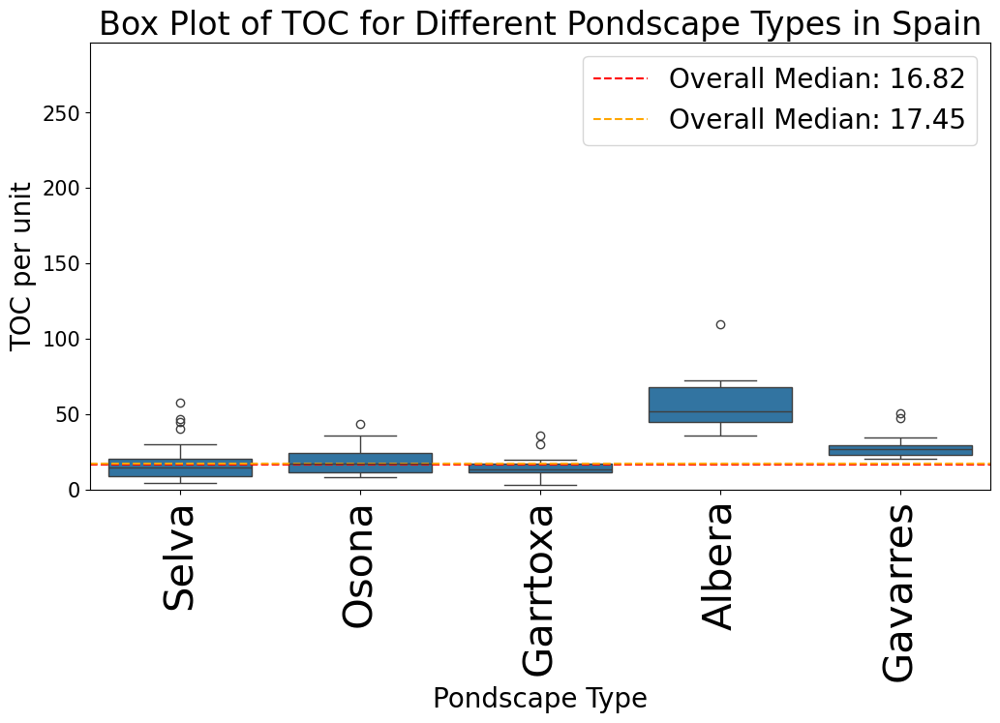

Range for TOC in UK: (5.32,35.19)


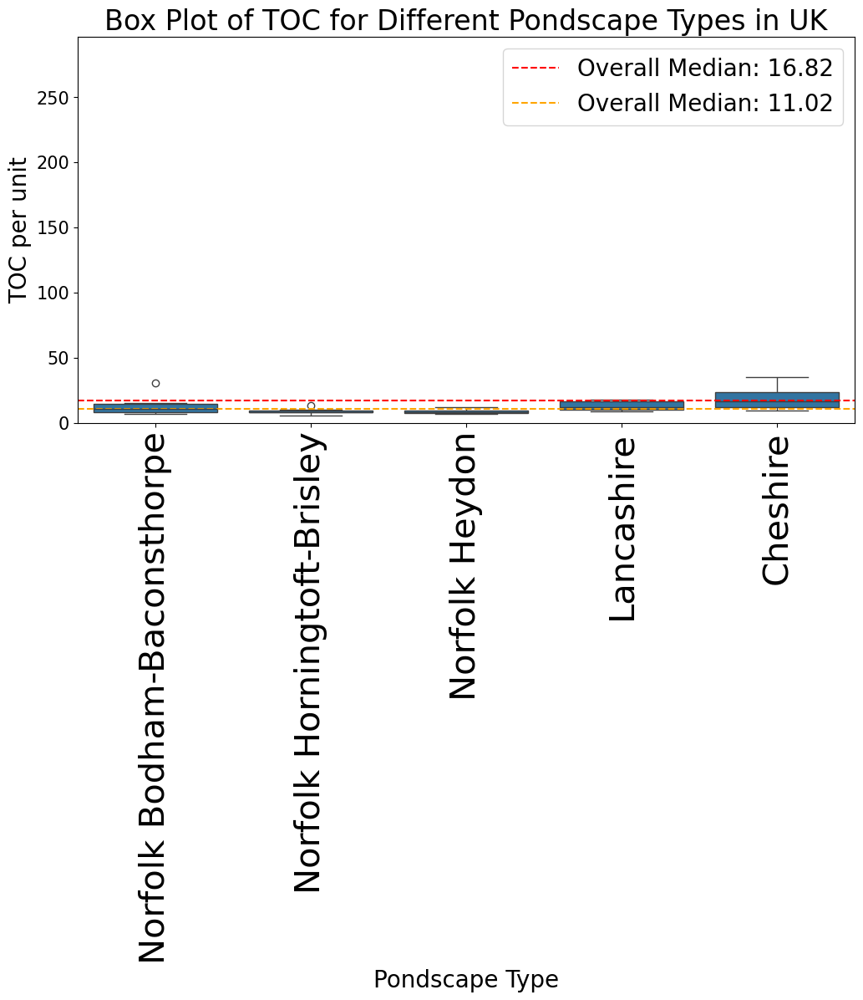

Range for TOC in Turkey: (3.50,48.90)


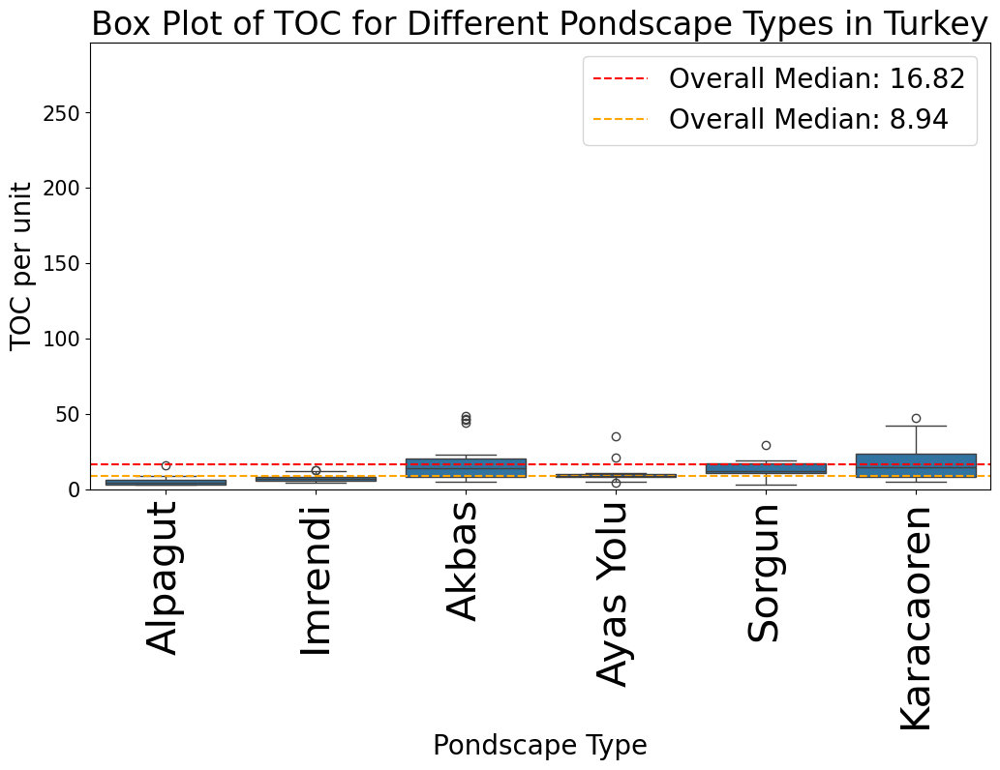

float64
DOC
Full range for DOC: (0.91,189.60)
Range for DOC in Belgium: (7.20,189.60)


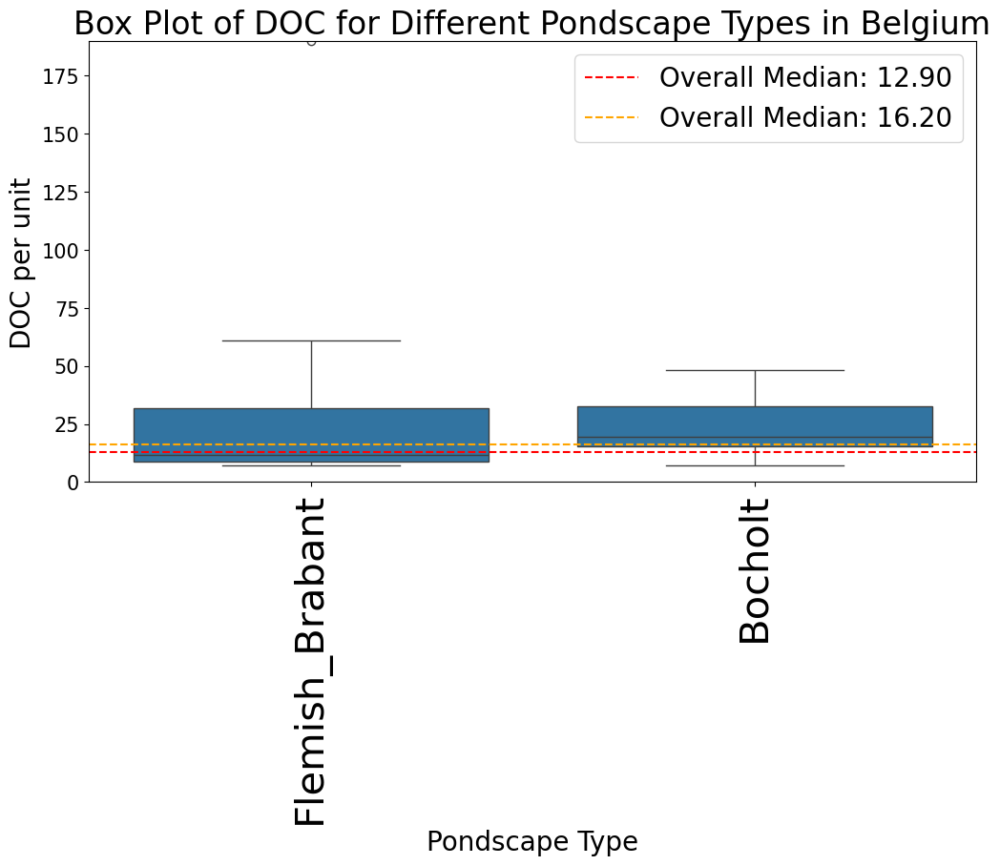

Range for DOC in Switzerland: (0.91,24.54)


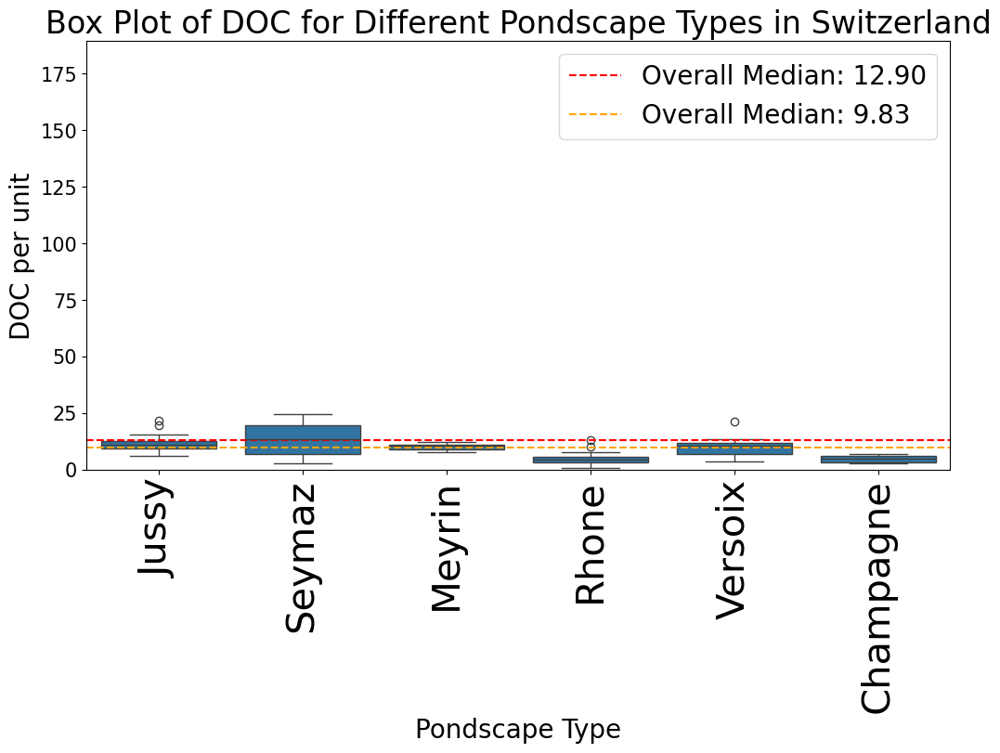

Range for DOC in Germany: (5.50,178.30)


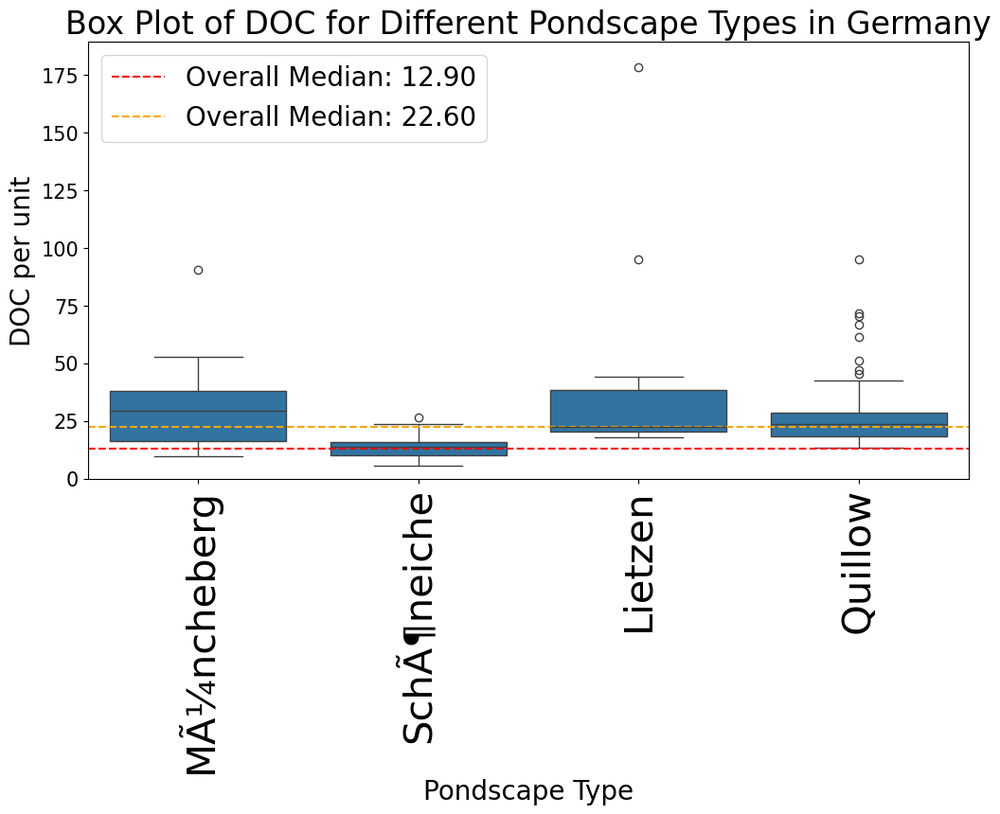

Range for DOC in Denmark: (3.14,34.68)


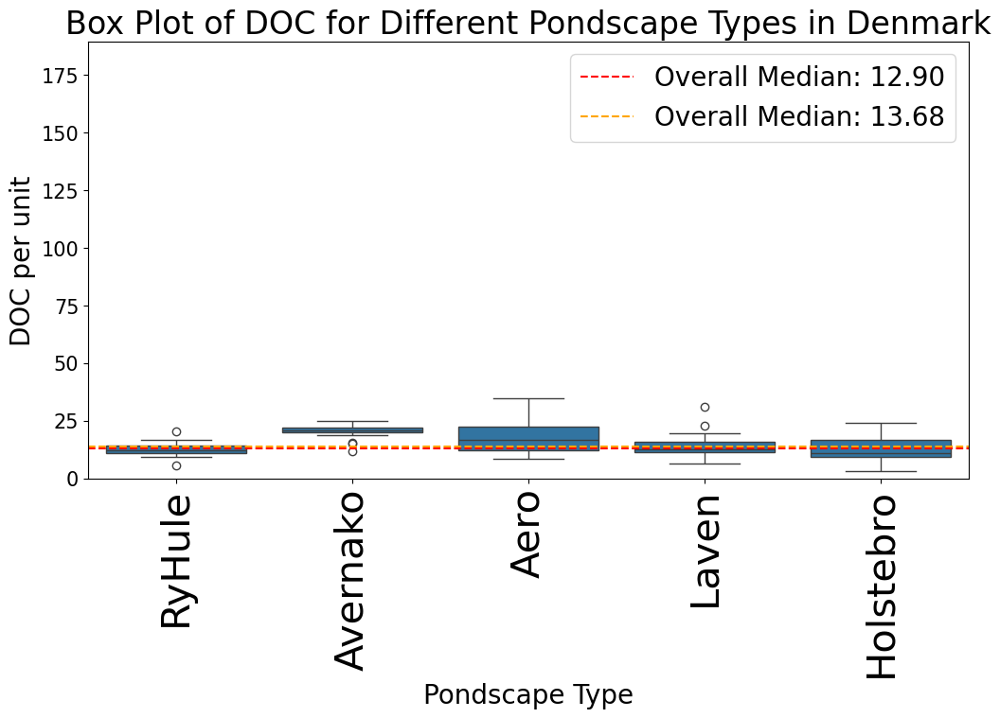

Range for DOC in Spain: (1.34,109.54)


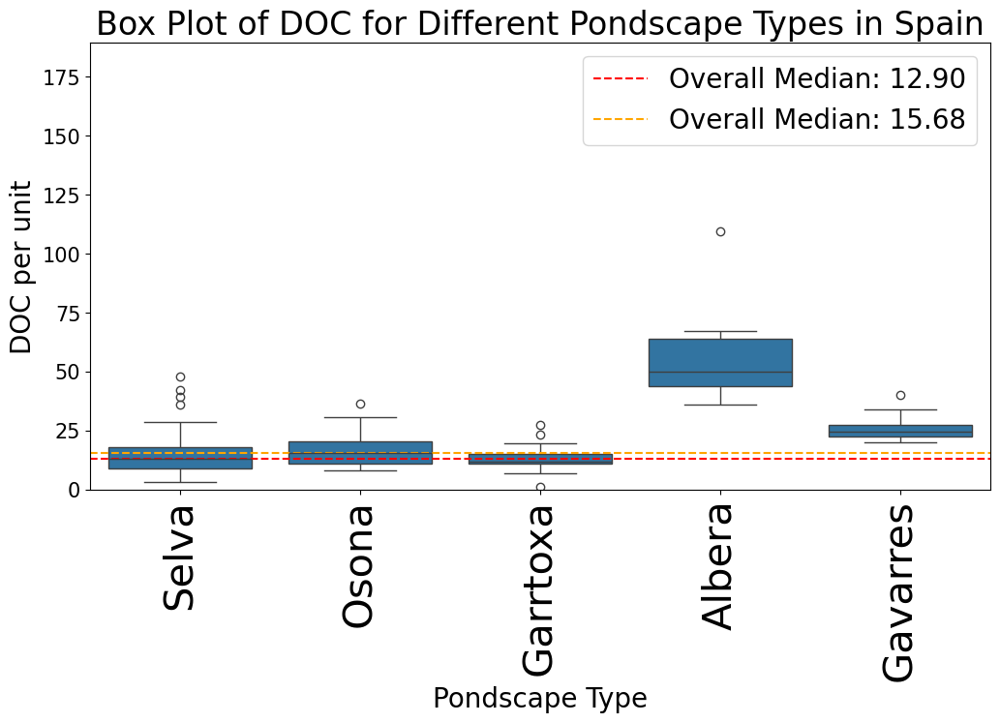

Range for DOC in UK: (6.81,35.17)


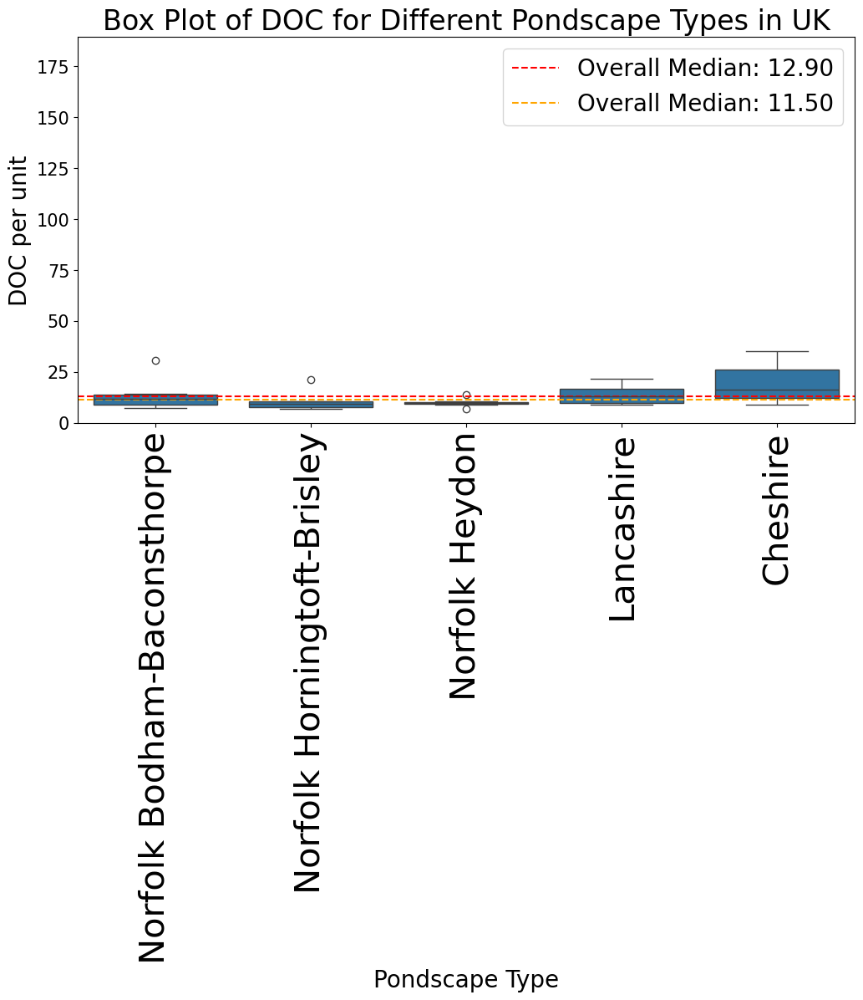

Range for DOC in Uruguay: (3.21,26.62)


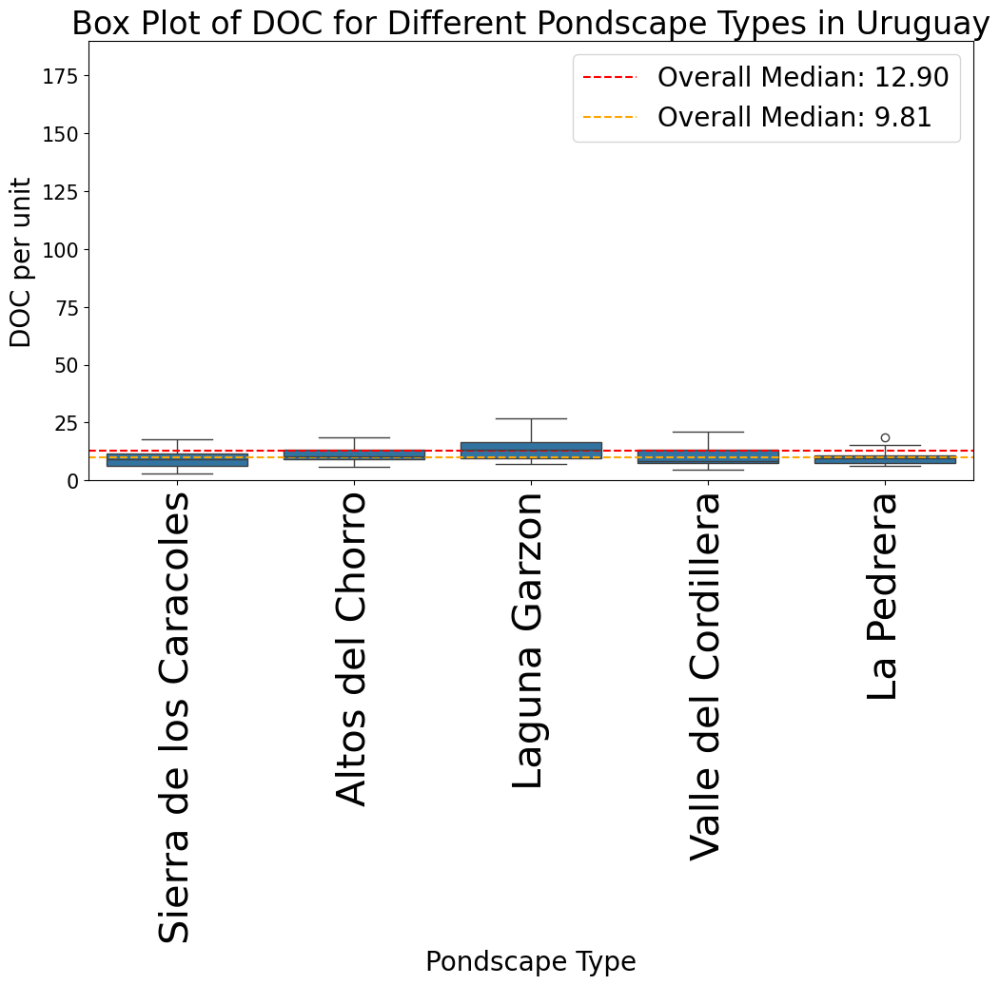

Range for DOC in Turkey: (3.50,48.10)


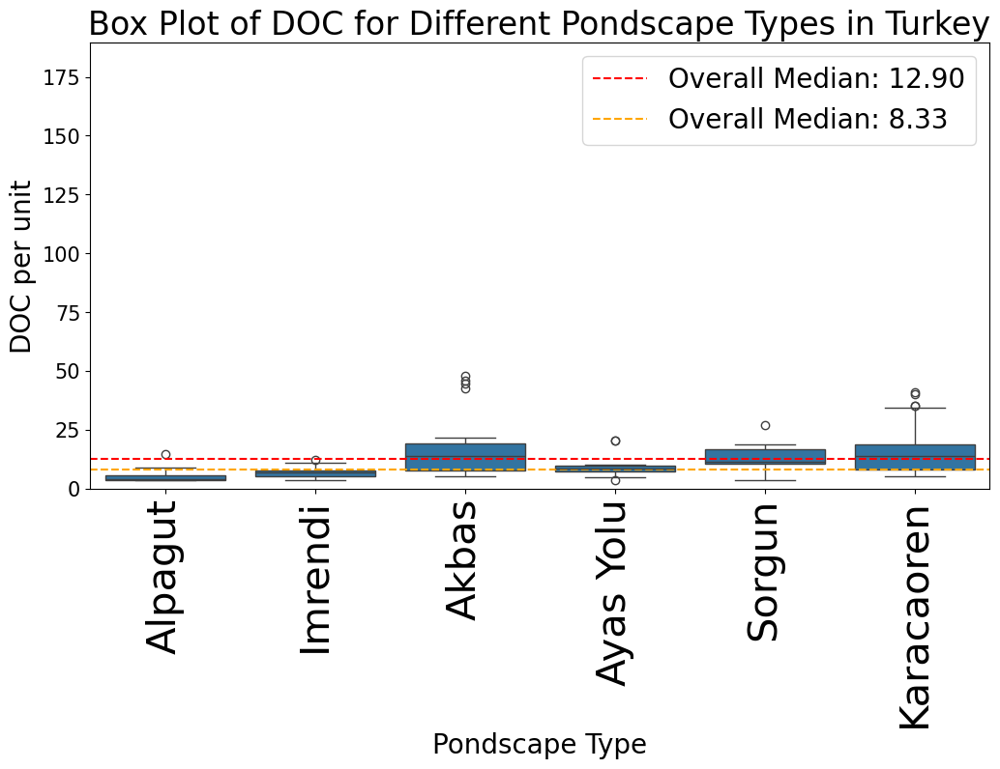

float64
O2_con
Full range for O2_con: (0.00,60.50)
Range for O2_con in Belgium: (0.02,60.50)


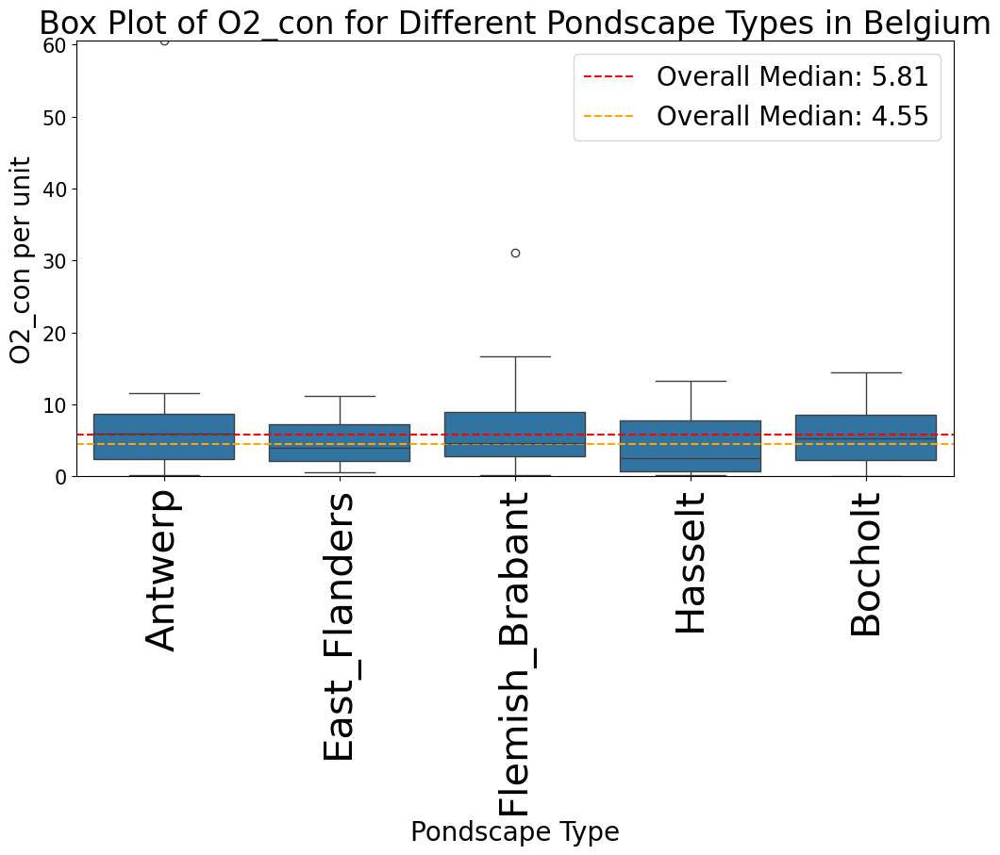

Range for O2_con in Switzerland: (0.12,17.34)


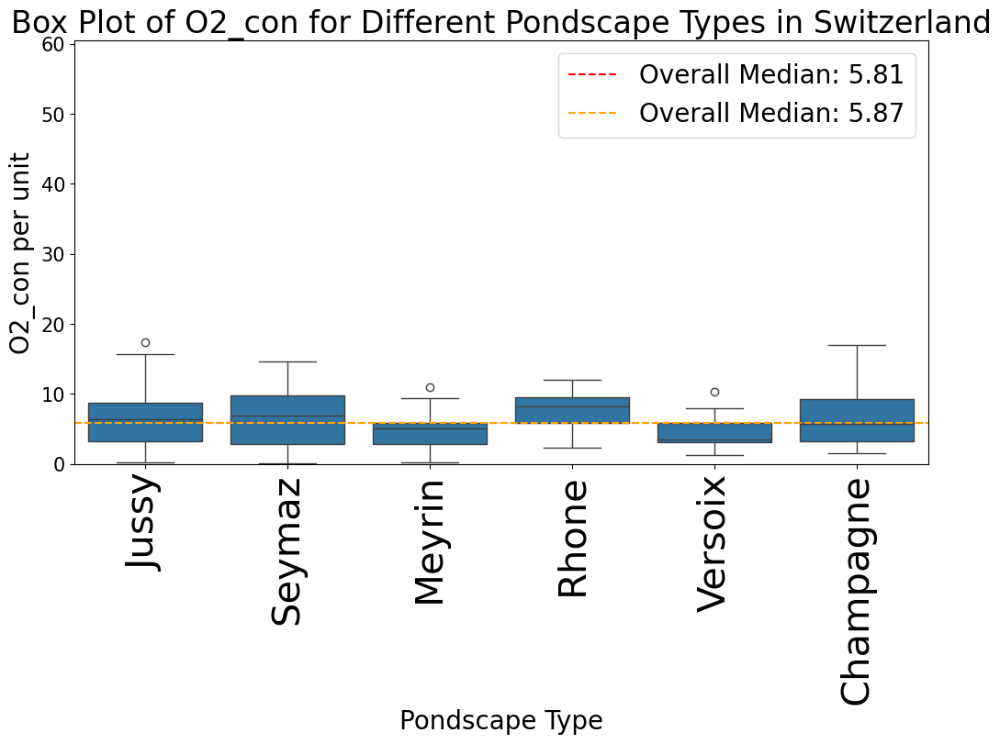

Range for O2_con in Germany: (0.00,20.10)


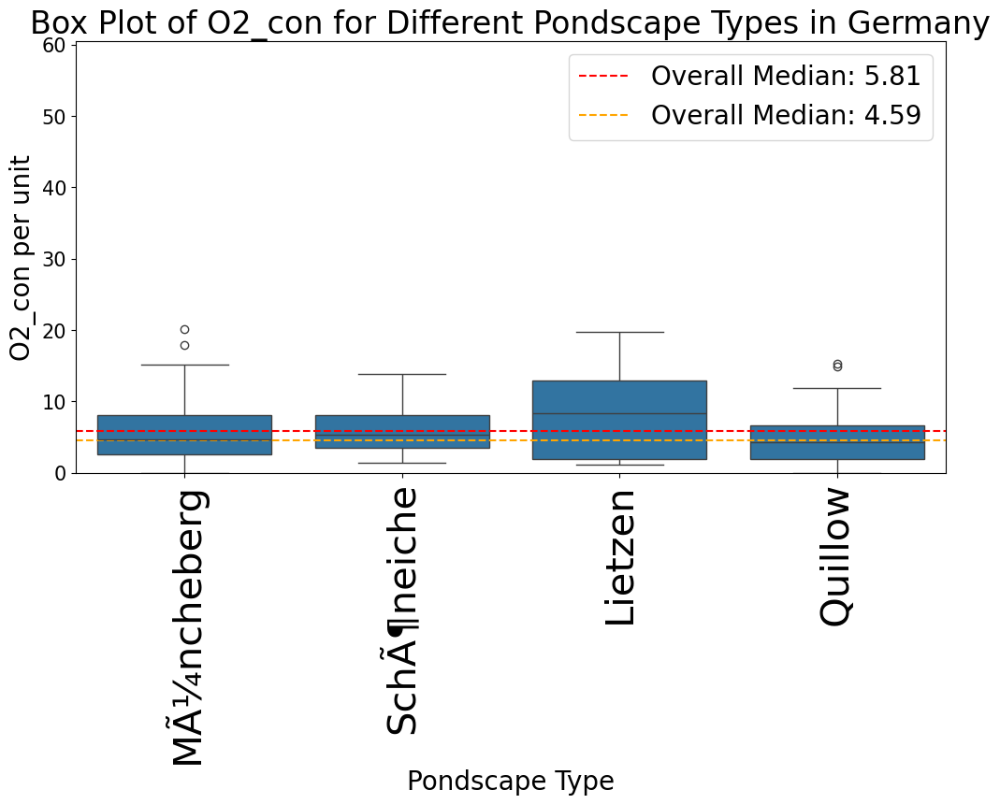

Range for O2_con in Denmark: (0.31,17.03)


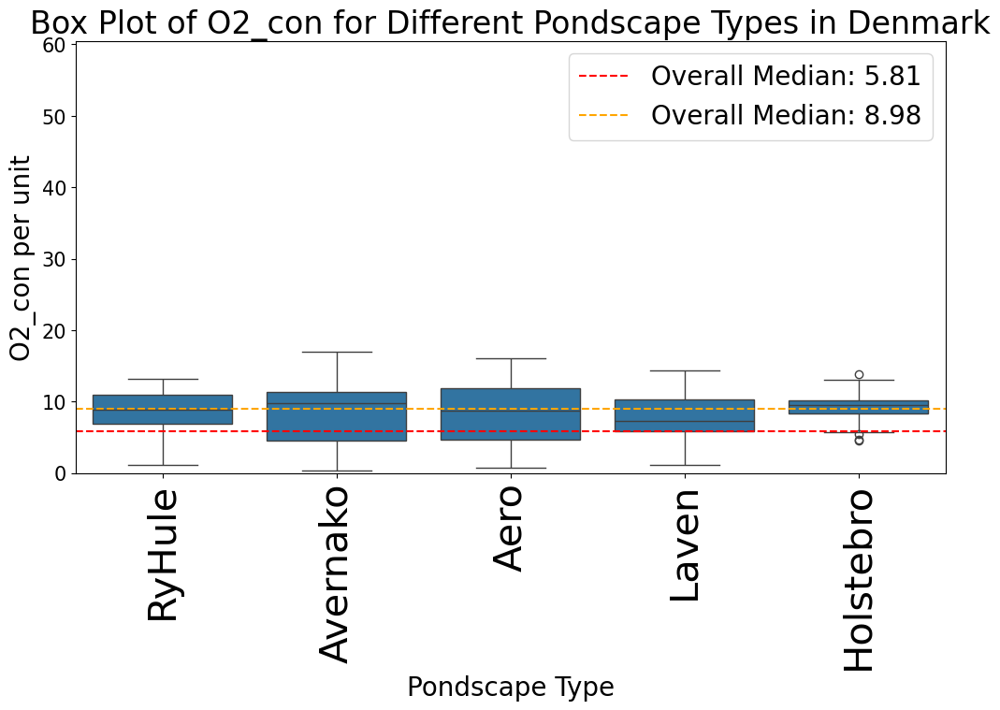

Range for O2_con in Spain: (0.00,13.58)


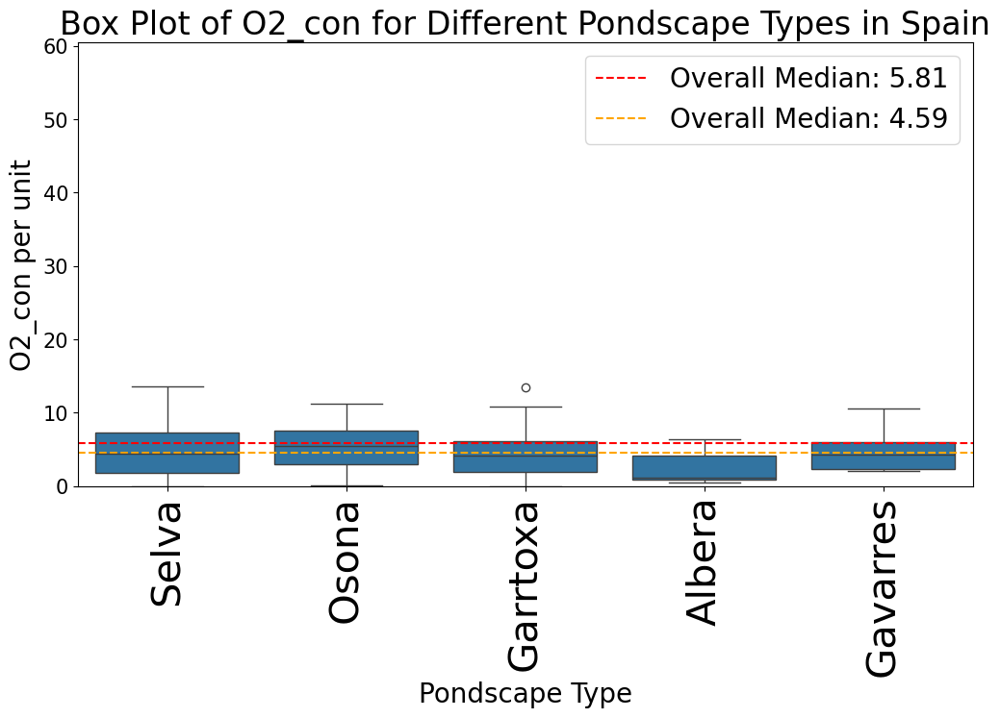

Range for O2_con in UK: (0.24,11.95)


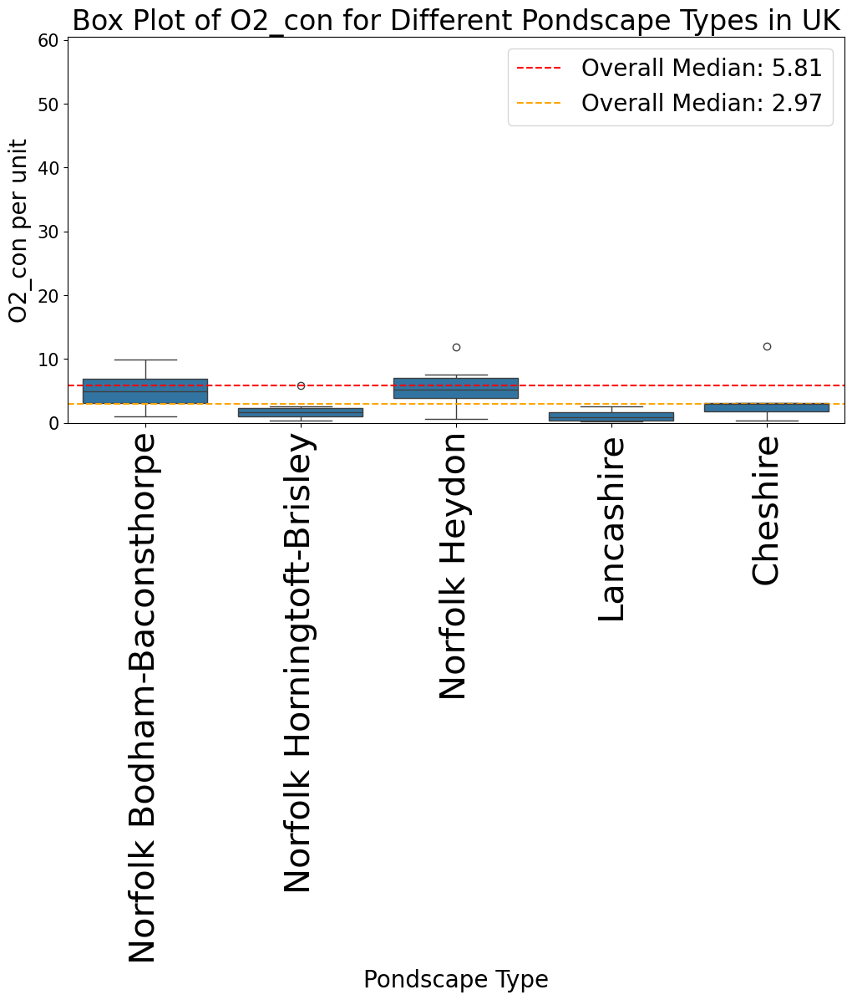

Range for O2_con in Uruguay: (0.40,13.10)


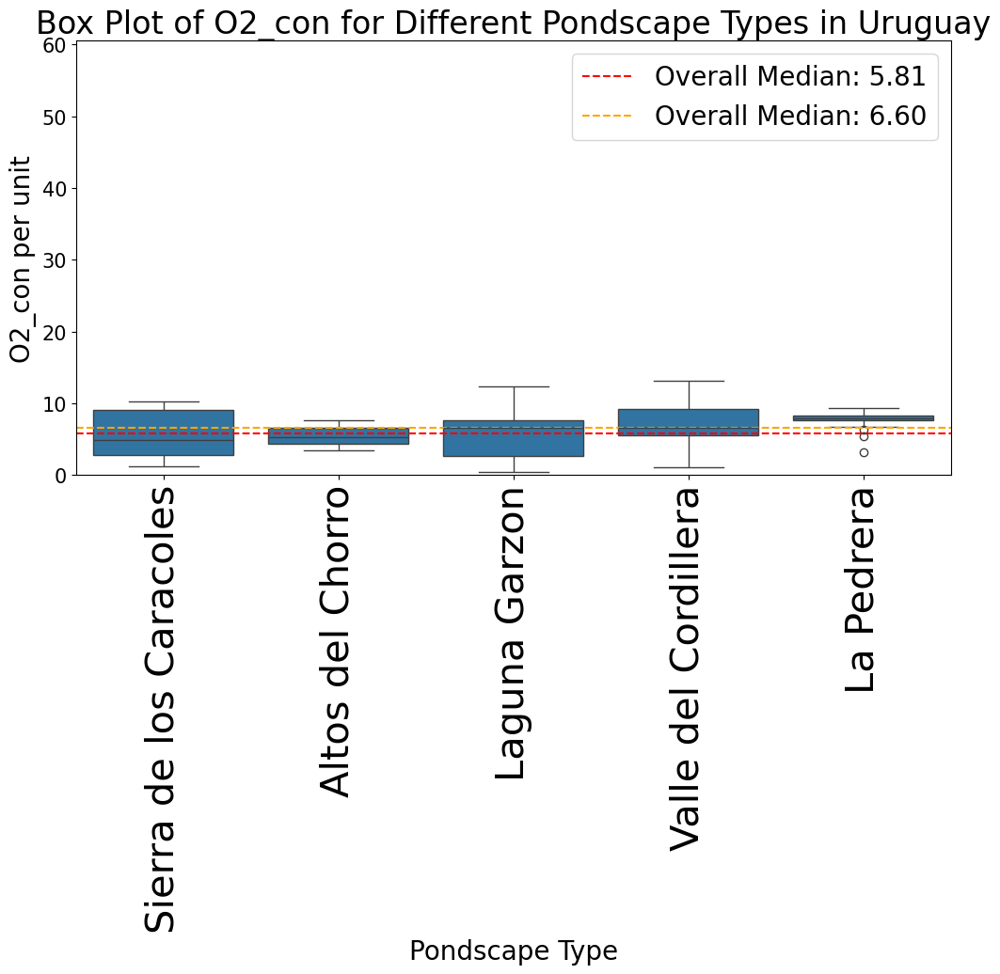

Range for O2_con in Turkey: (0.17,16.93)


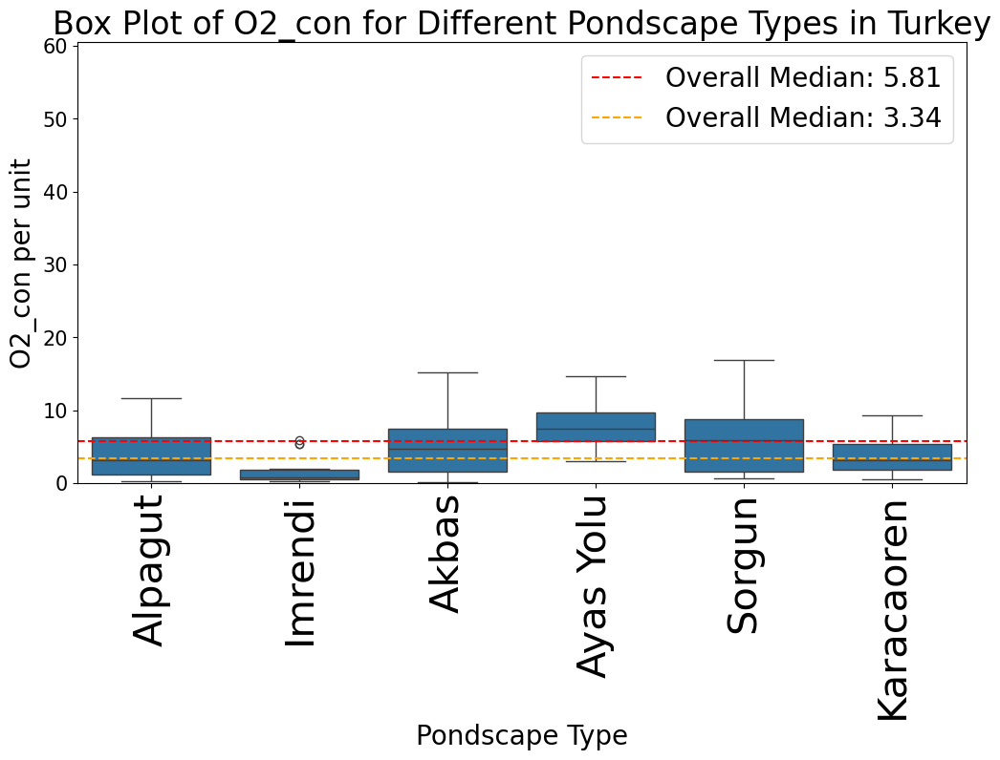

float64
O2_sat
Full range for O2_sat: (0.00,537.00)
Range for O2_sat in Belgium: (0.27,537.00)


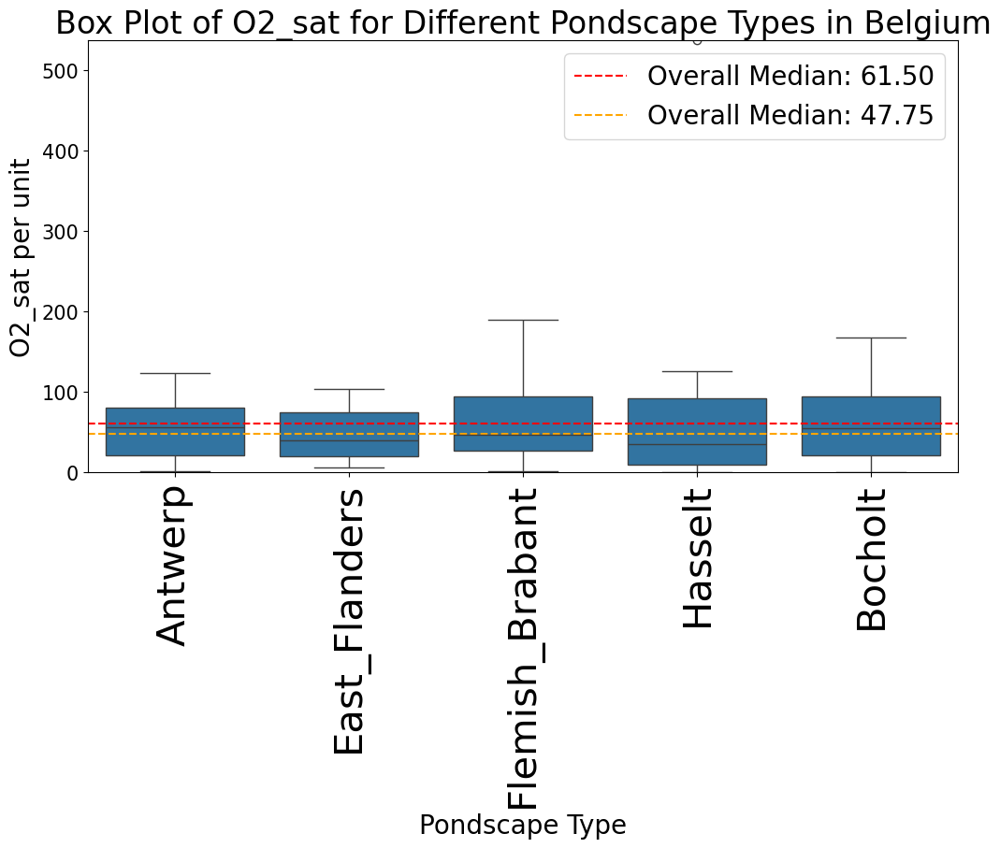

Range for O2_sat in Switzerland: (1.20,216.80)


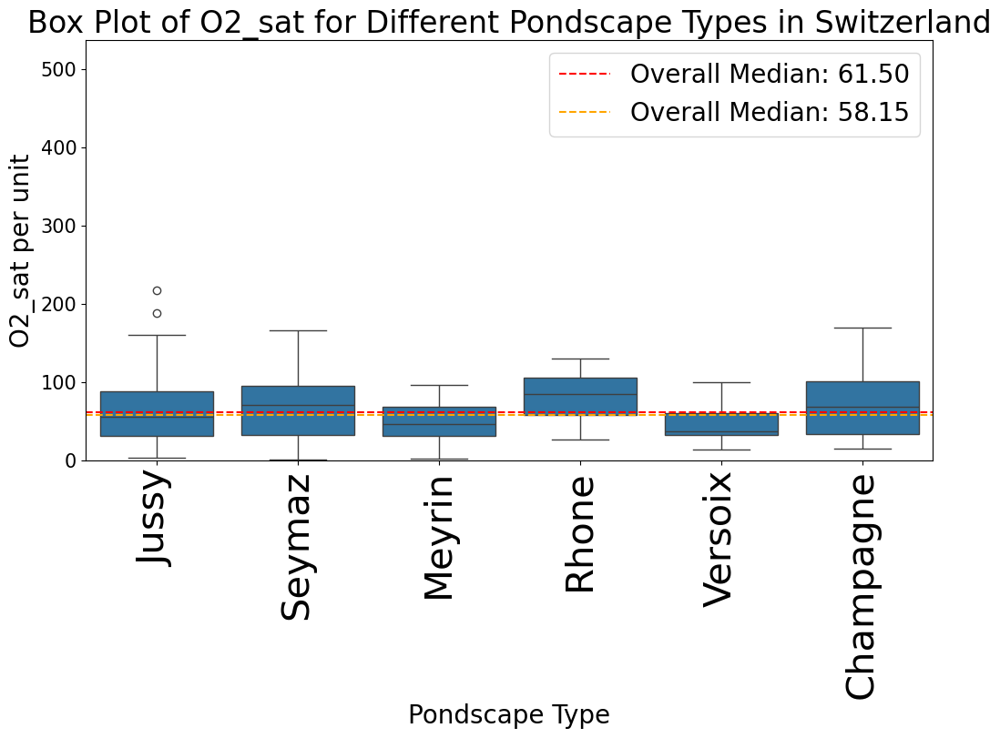

Range for O2_sat in Germany: (0.00,229.00)


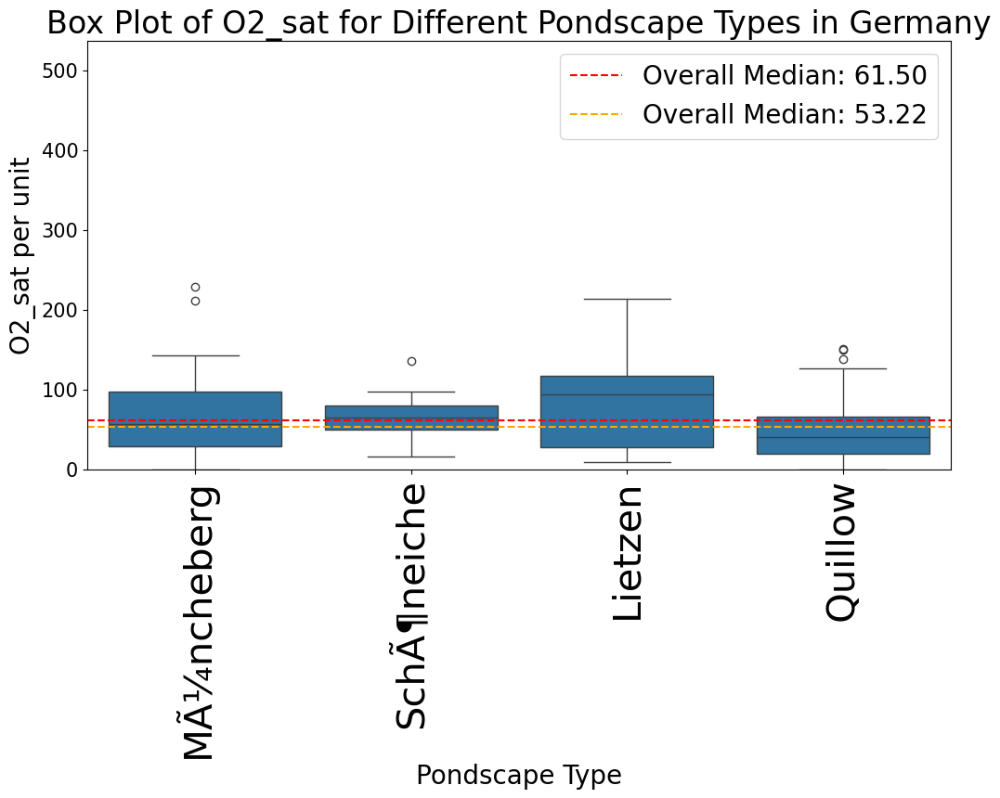

Range for O2_sat in Denmark: (2.89,187.13)


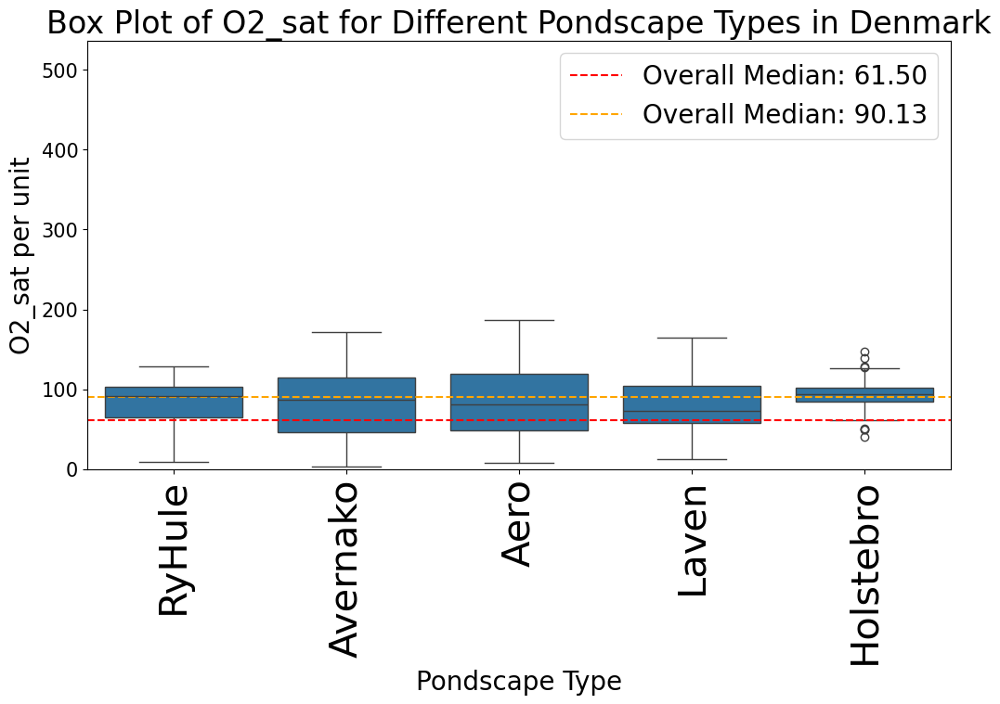

Range for O2_sat in Spain: (0.00,190.90)


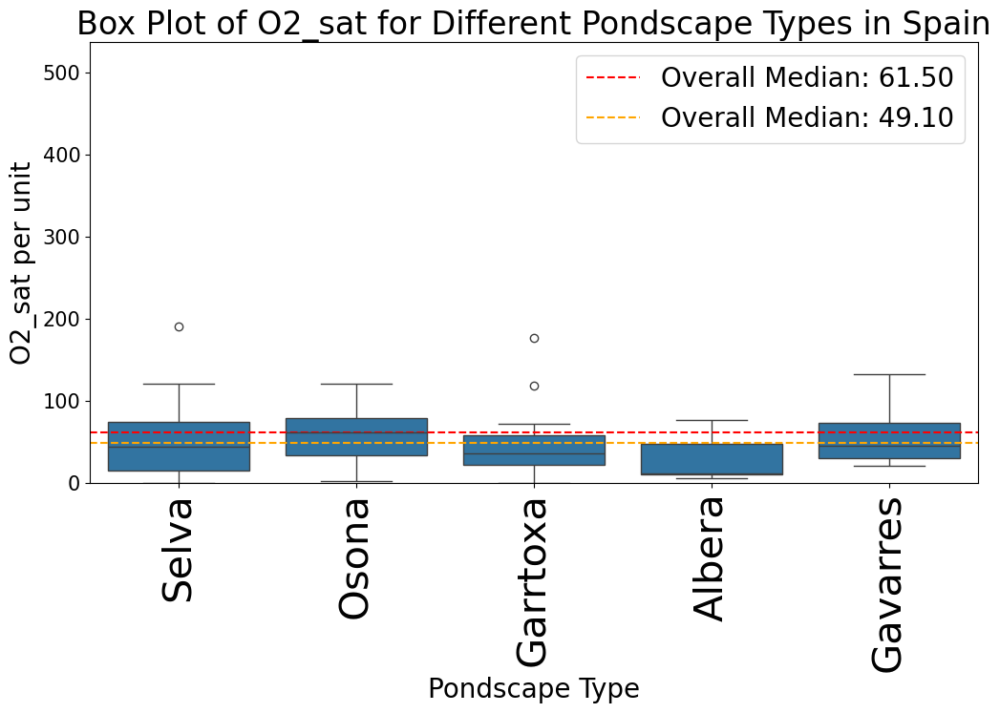

Range for O2_sat in UK: (2.40,129.90)


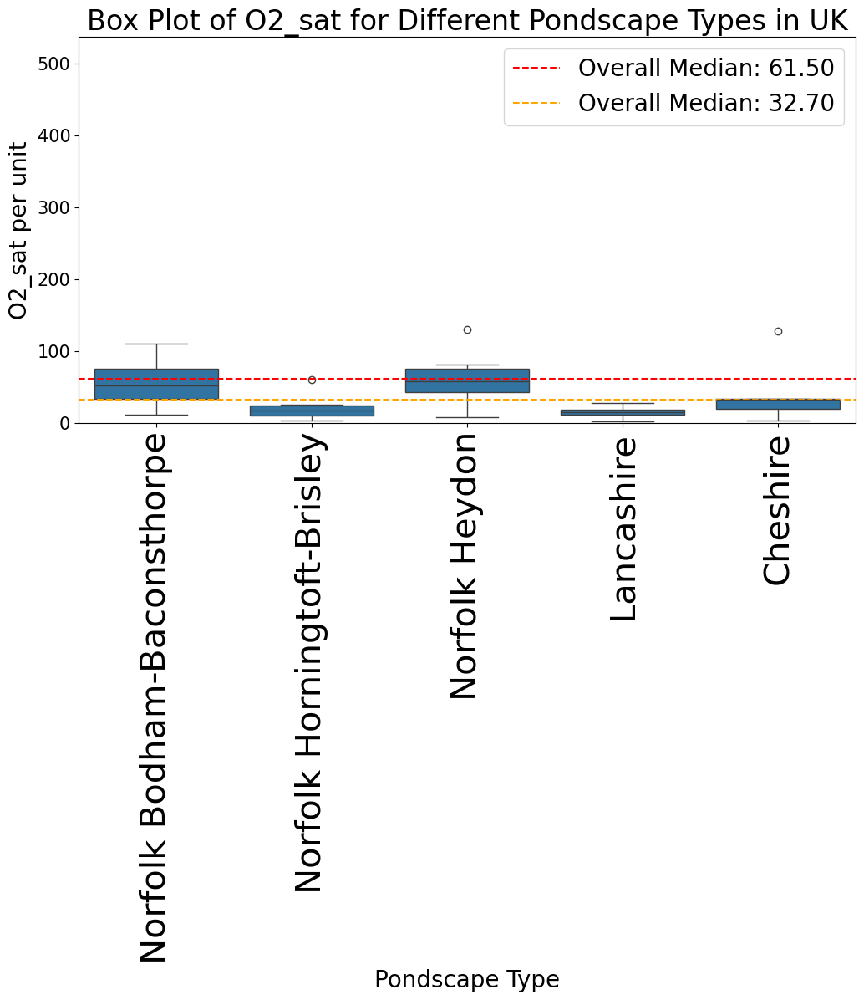

Range for O2_sat in Uruguay: (4.30,161.00)


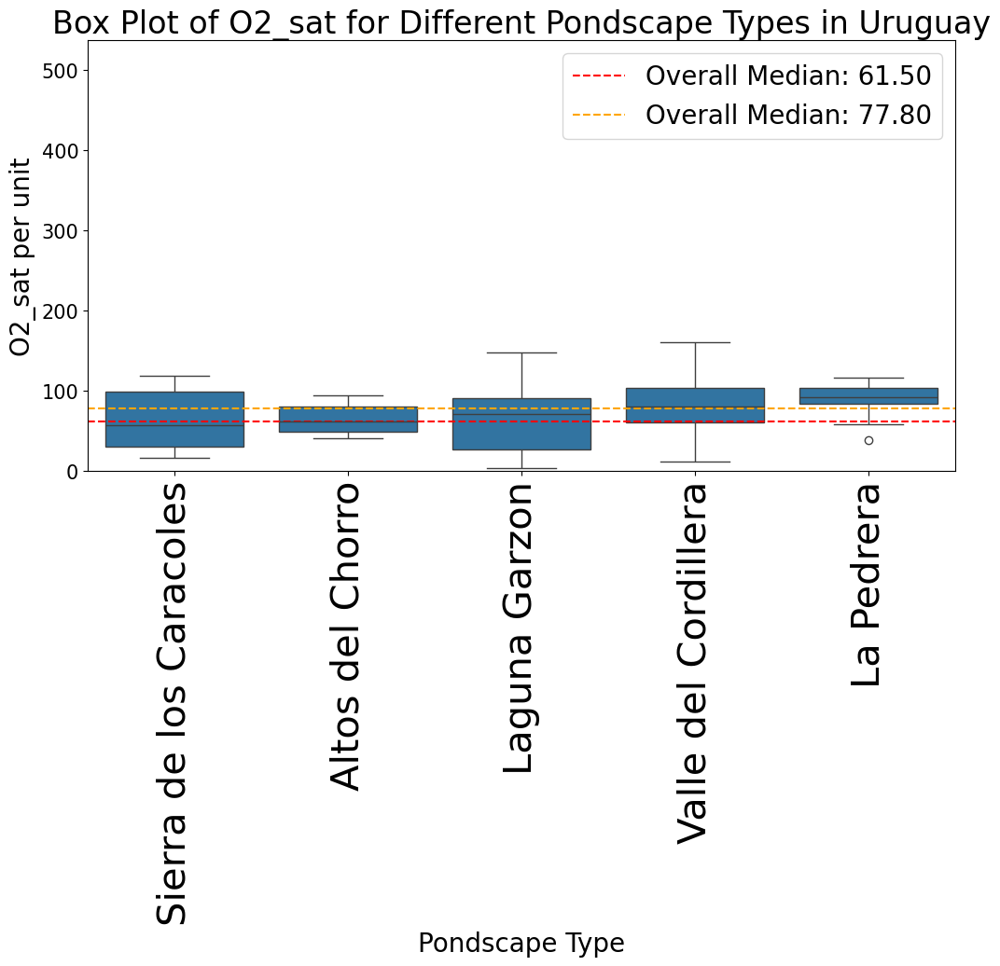

Range for O2_sat in Turkey: (2.03,242.86)


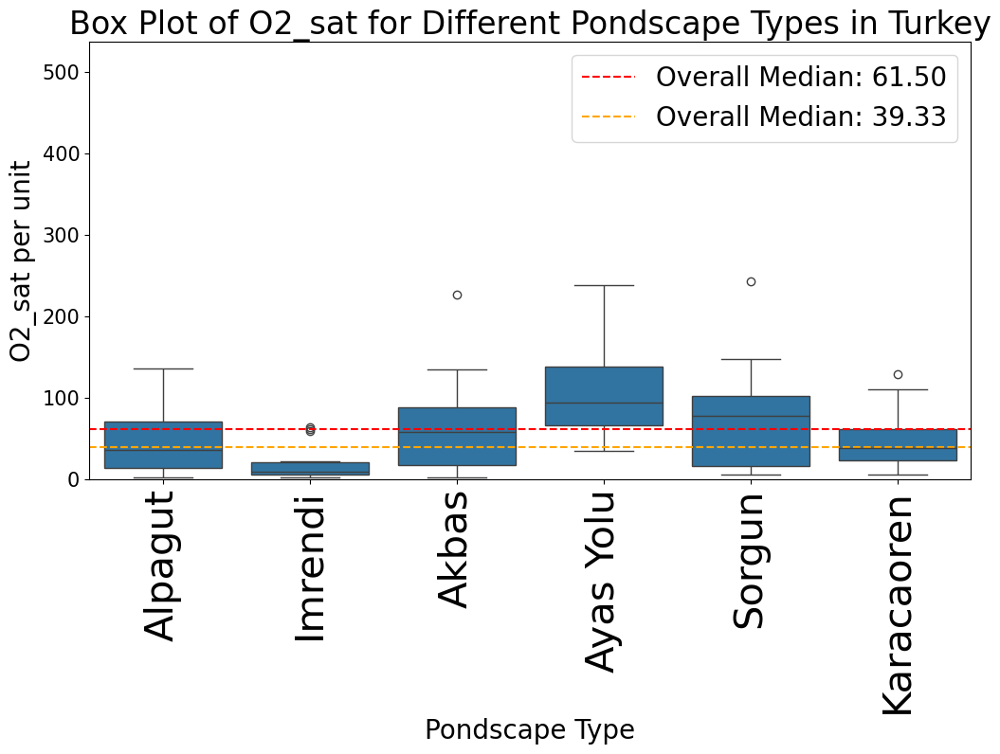

float64
Cond
Full range for Cond: (17.44,3310.00)
Range for Cond in Belgium: (17.44,1068.00)


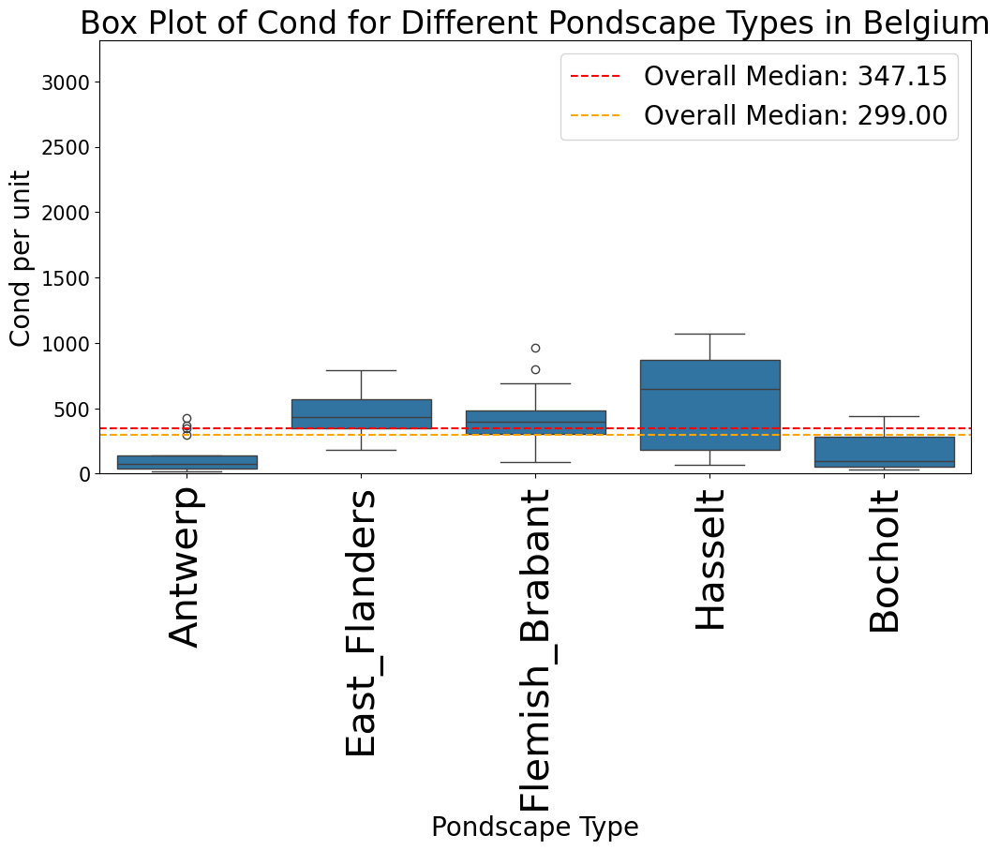

Range for Cond in Switzerland: (80.70,732.00)


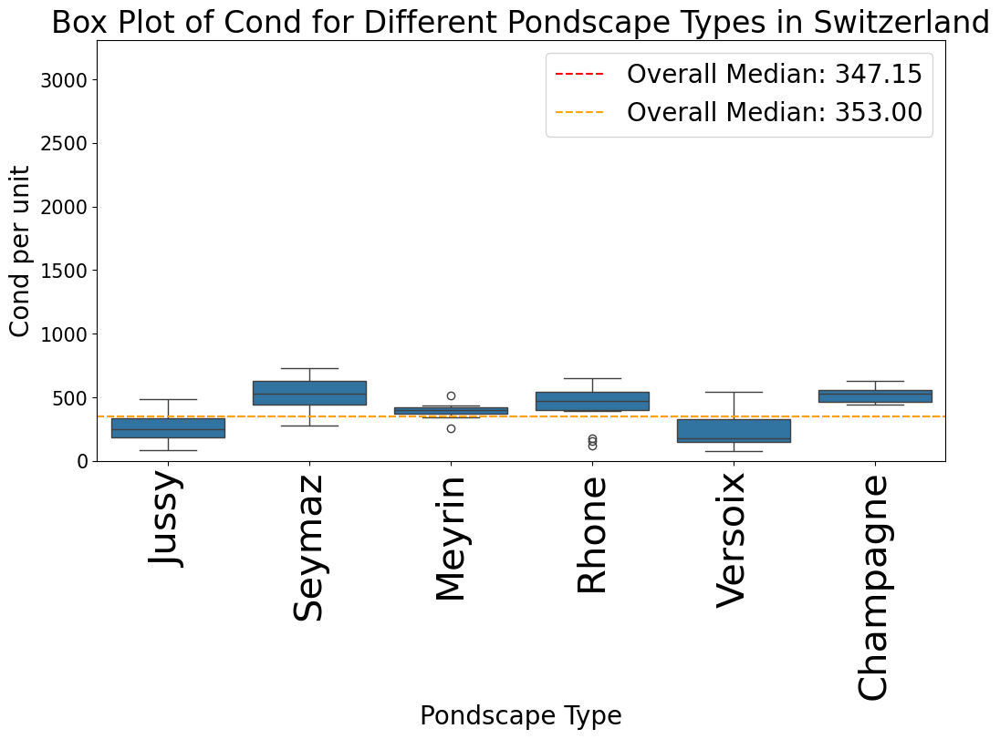

Range for Cond in Germany: (130.40,3310.00)


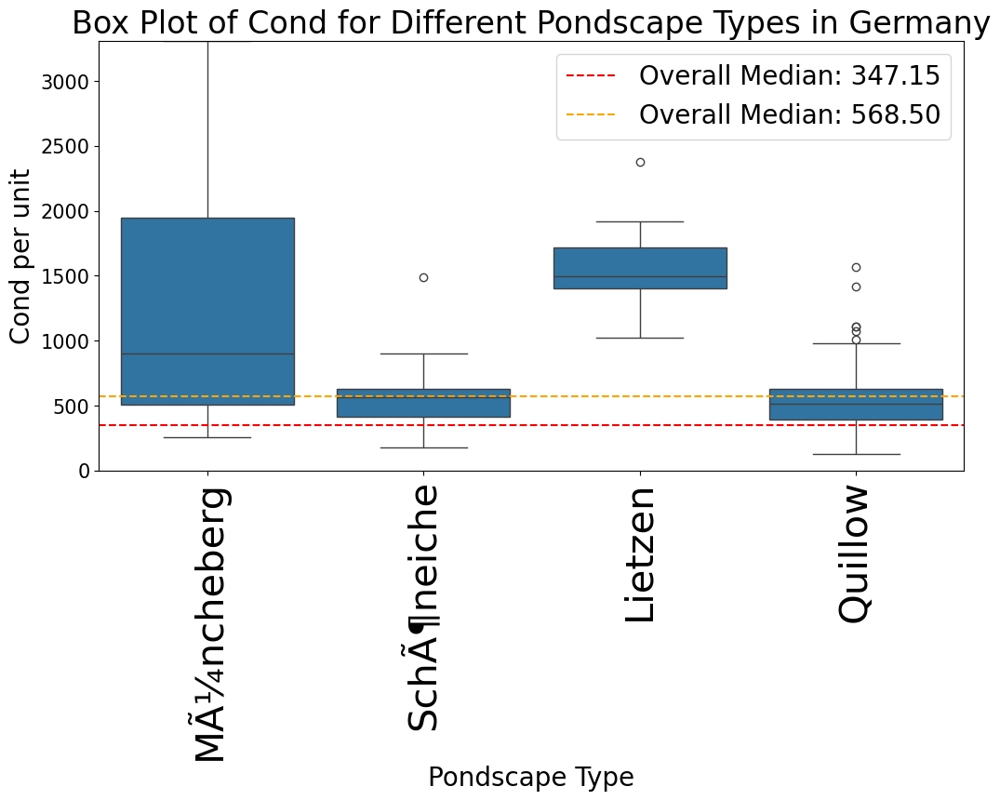

Range for Cond in Denmark: (27.25,1230.66)


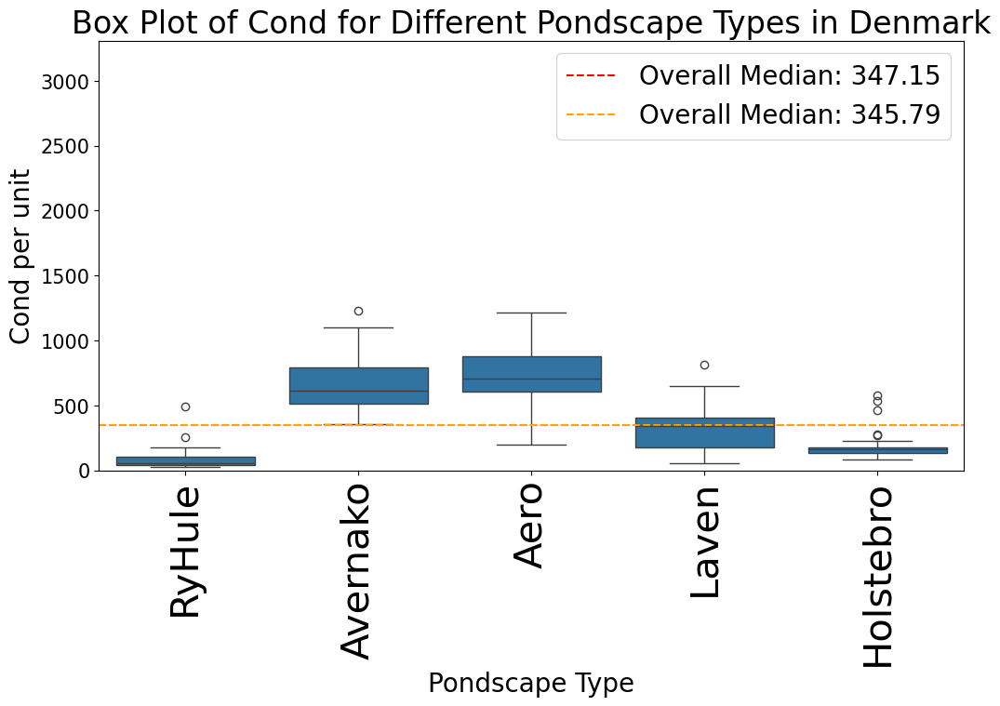

Range for Cond in Spain: (53.00,1380.00)


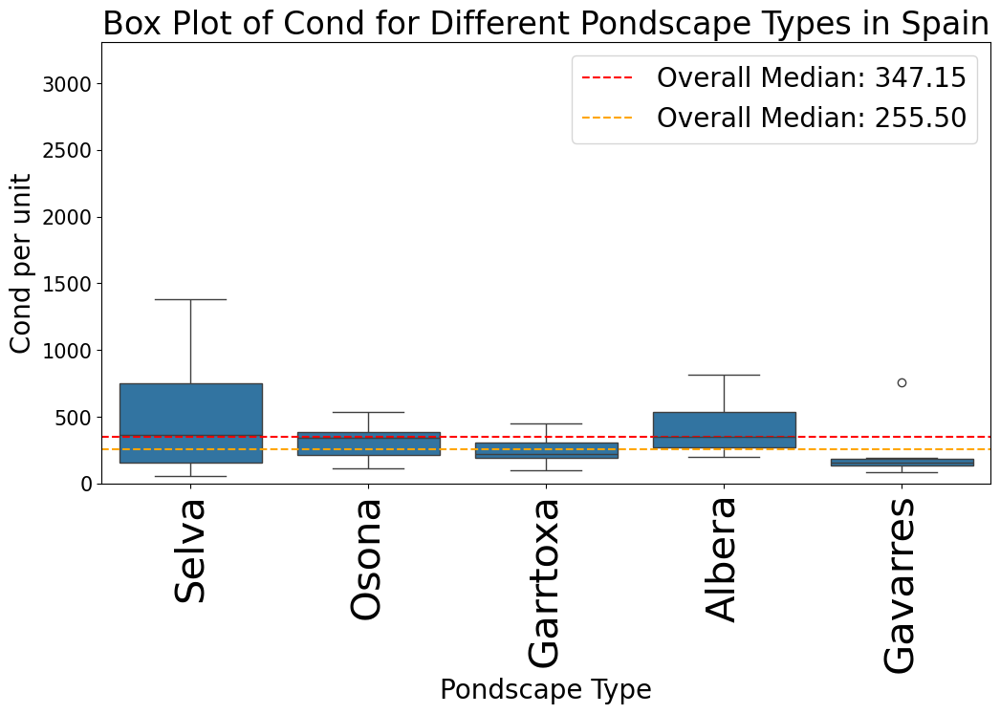

Range for Cond in UK: (110.00,970.00)


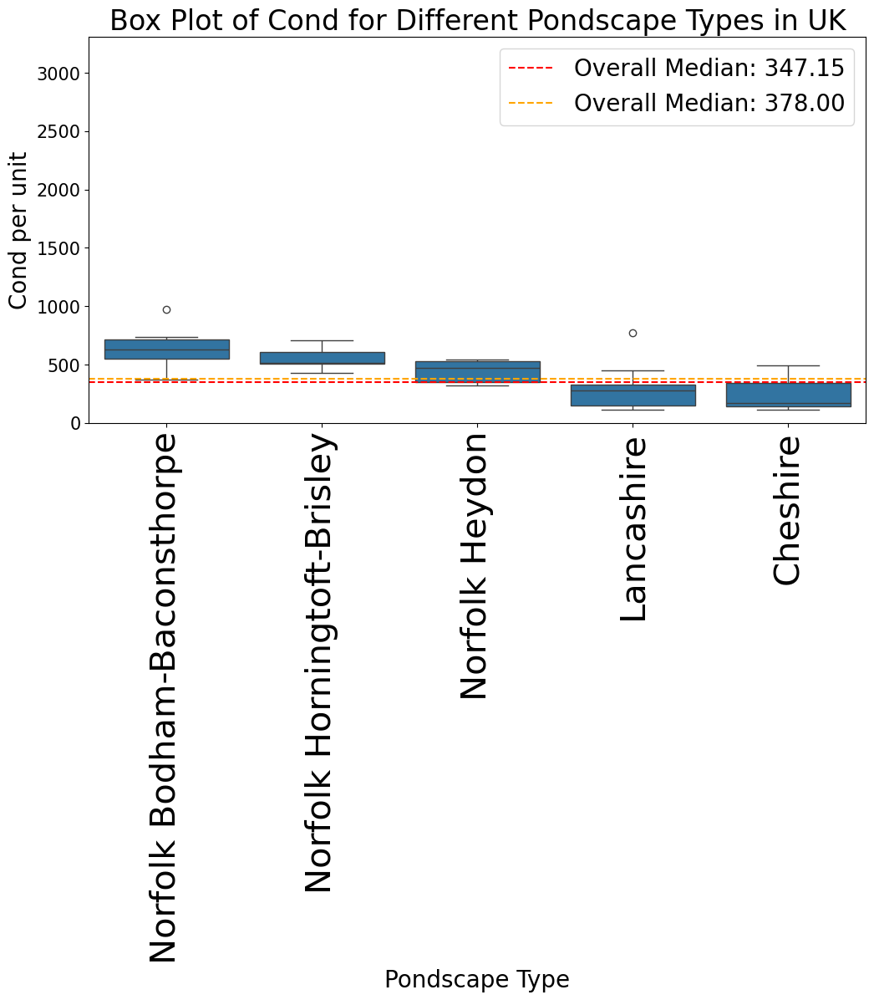

Range for Cond in Uruguay: (37.00,420.00)


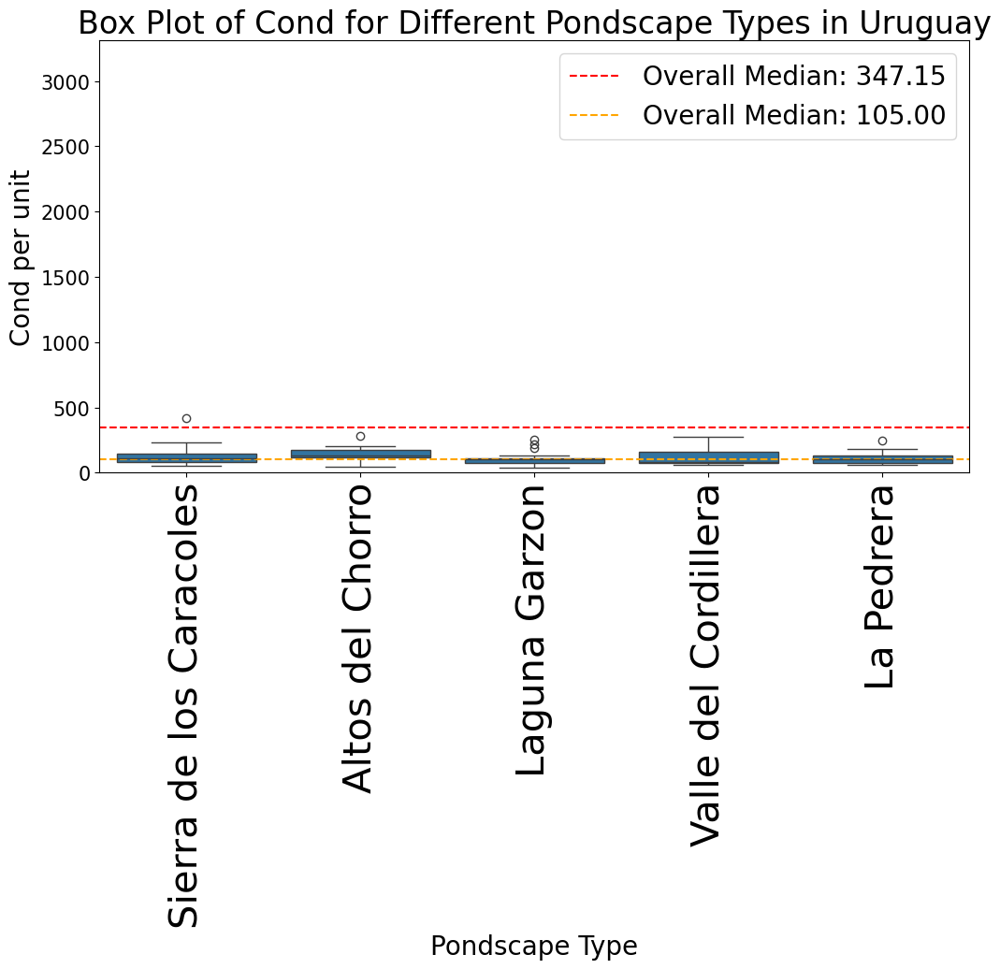

Range for Cond in Turkey: (90.94,2774.76)


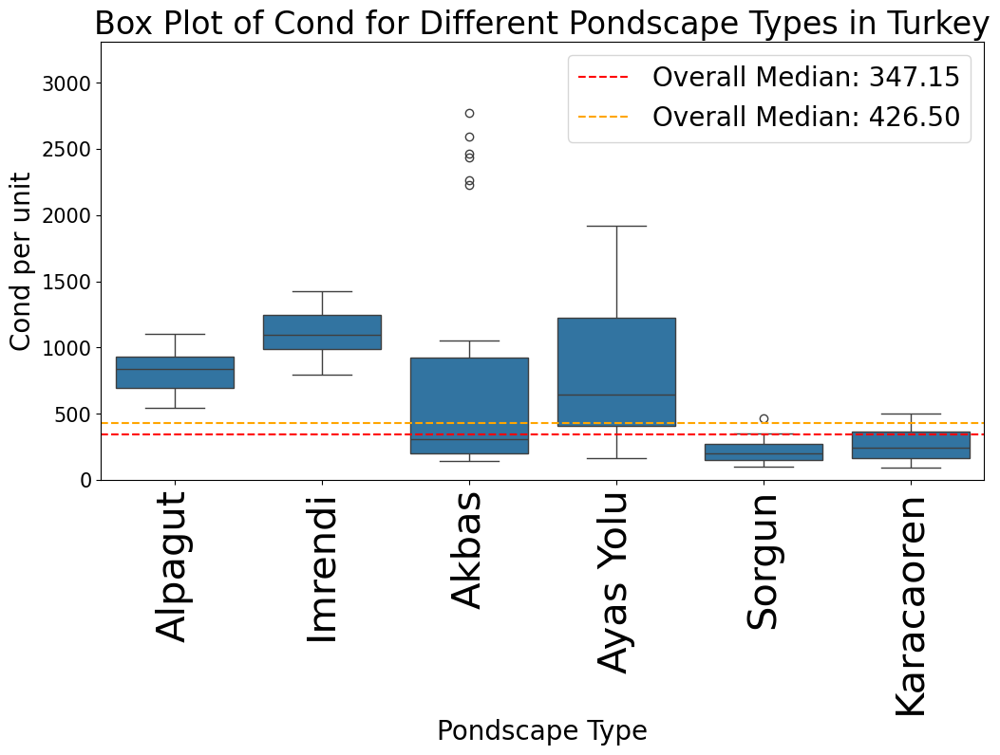

float64
TN/TP
Full range for TN/TP: (0.02,392.50)
Range for TN/TP in Belgium: (0.02,190.28)


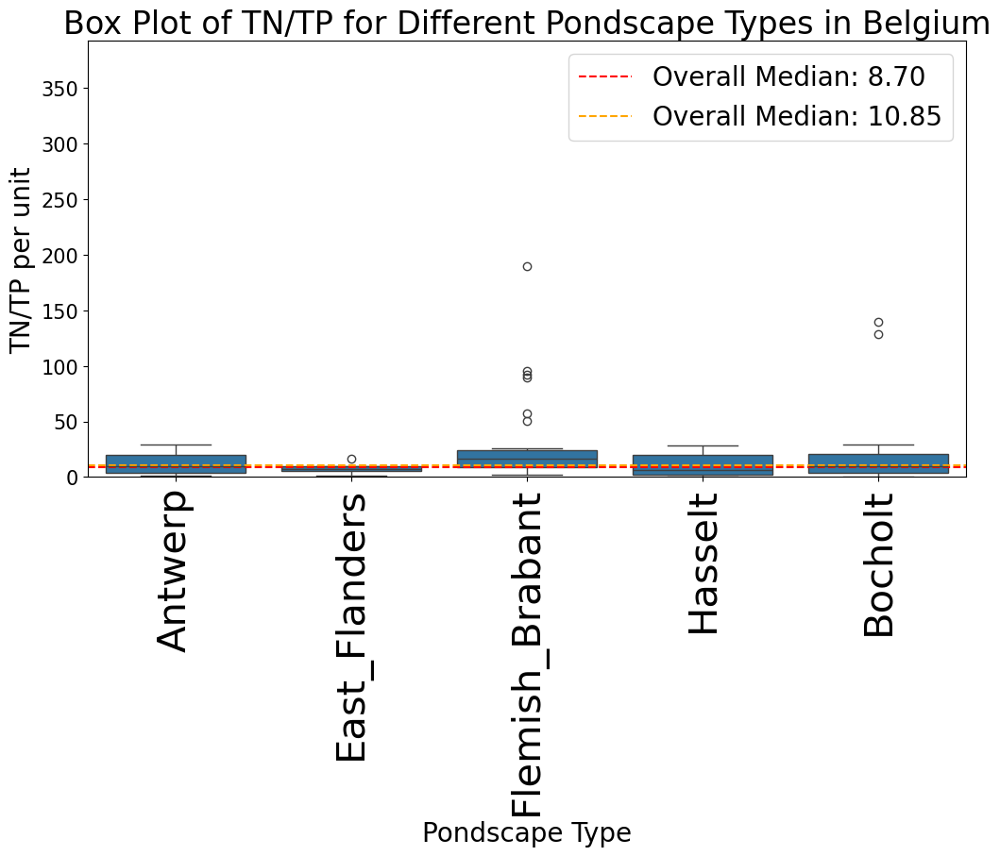

Range for TN/TP in Switzerland: (1.64,392.50)


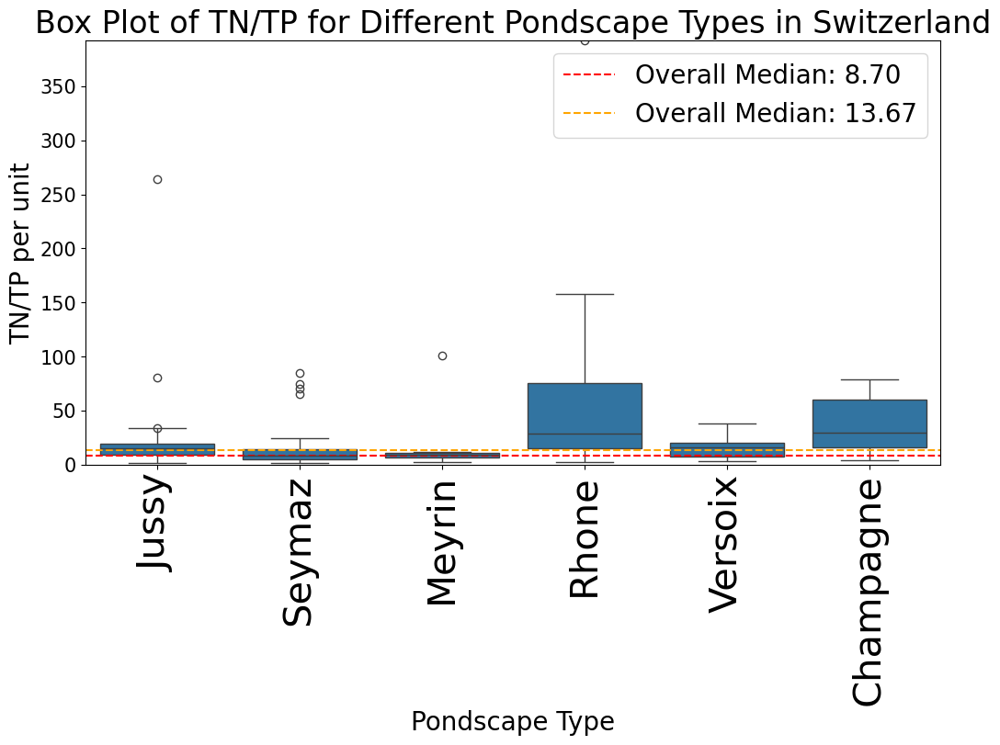

Range for TN/TP in Germany: (1.24,107.27)


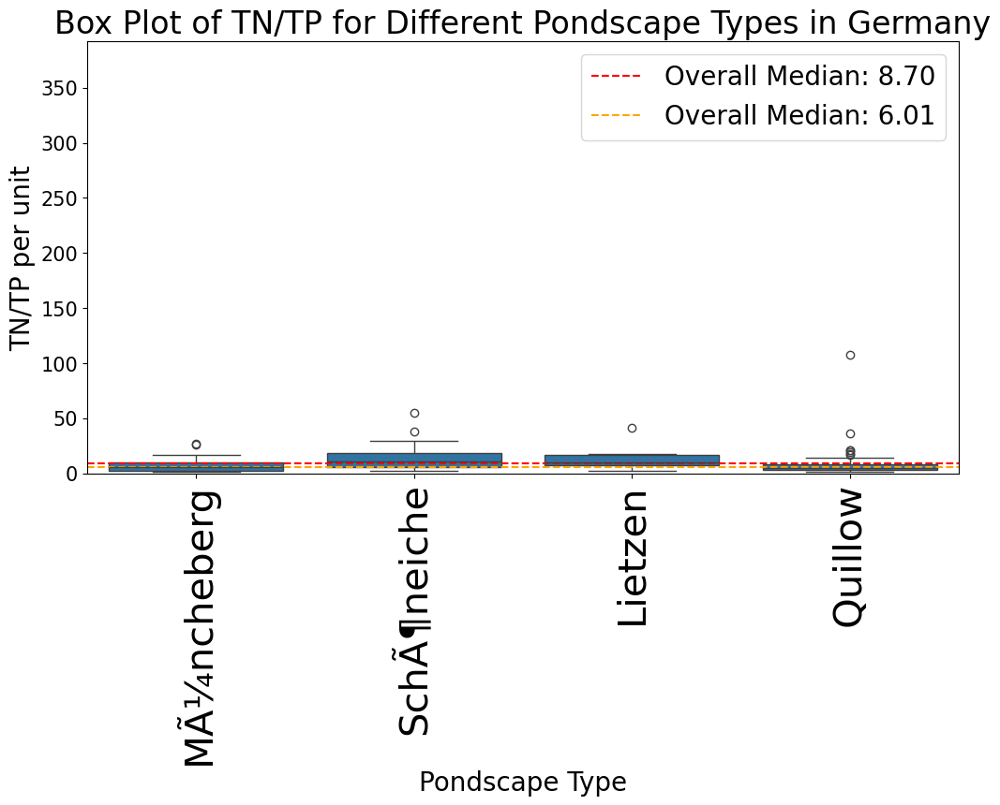

Range for TN/TP in Denmark: (0.53,53.50)


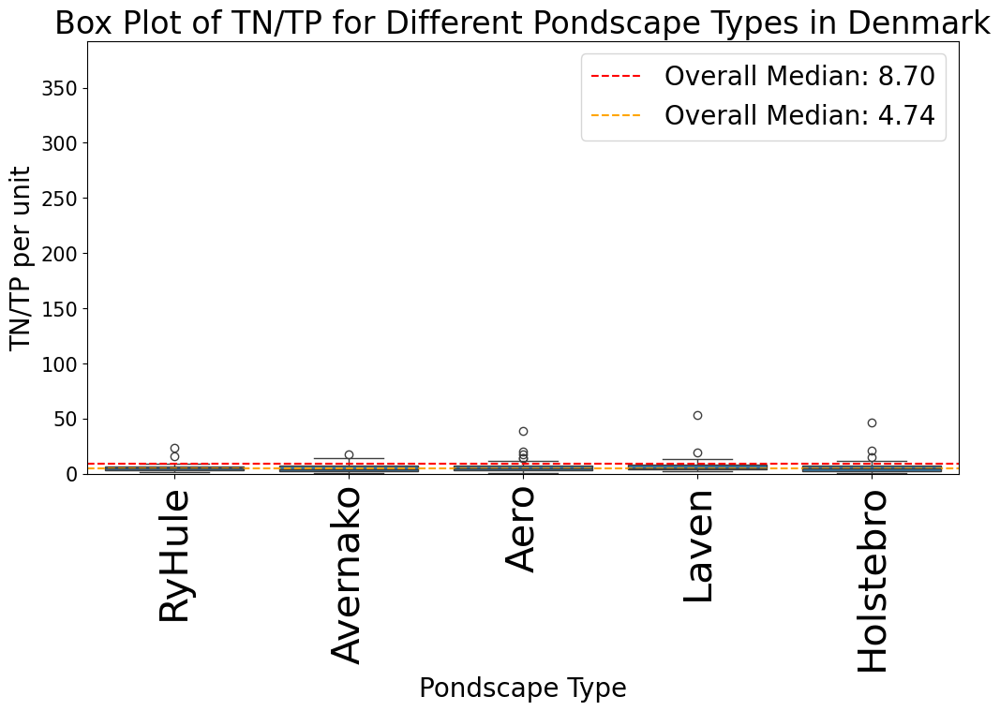

Range for TN/TP in Spain: (3.46,129.32)


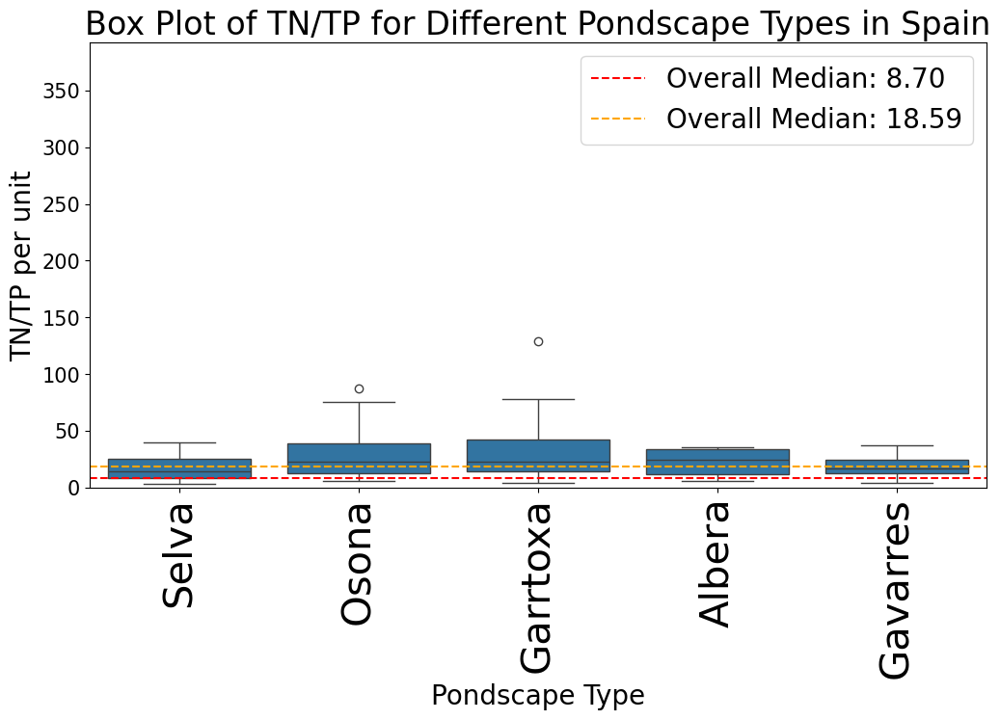

Range for TN/TP in UK: (2.35,102.86)


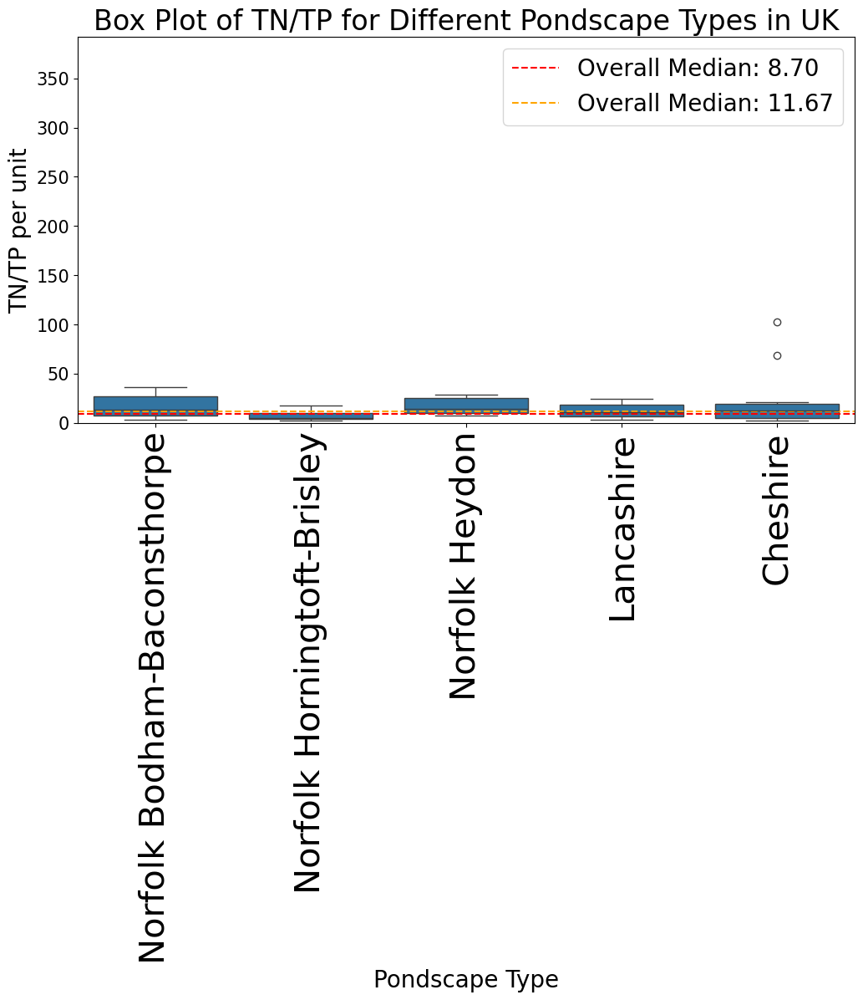

Range for TN/TP in Uruguay: (0.65,19.75)


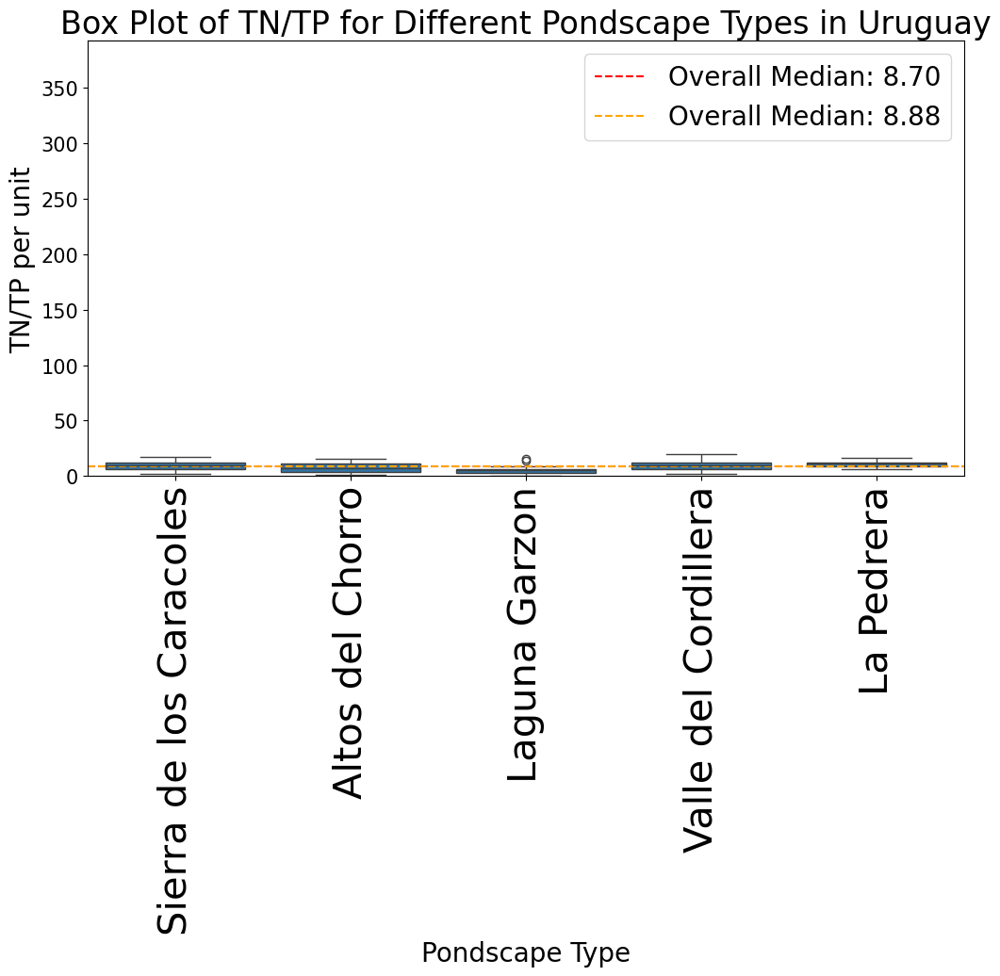

Range for TN/TP in Turkey: (0.17,168.61)


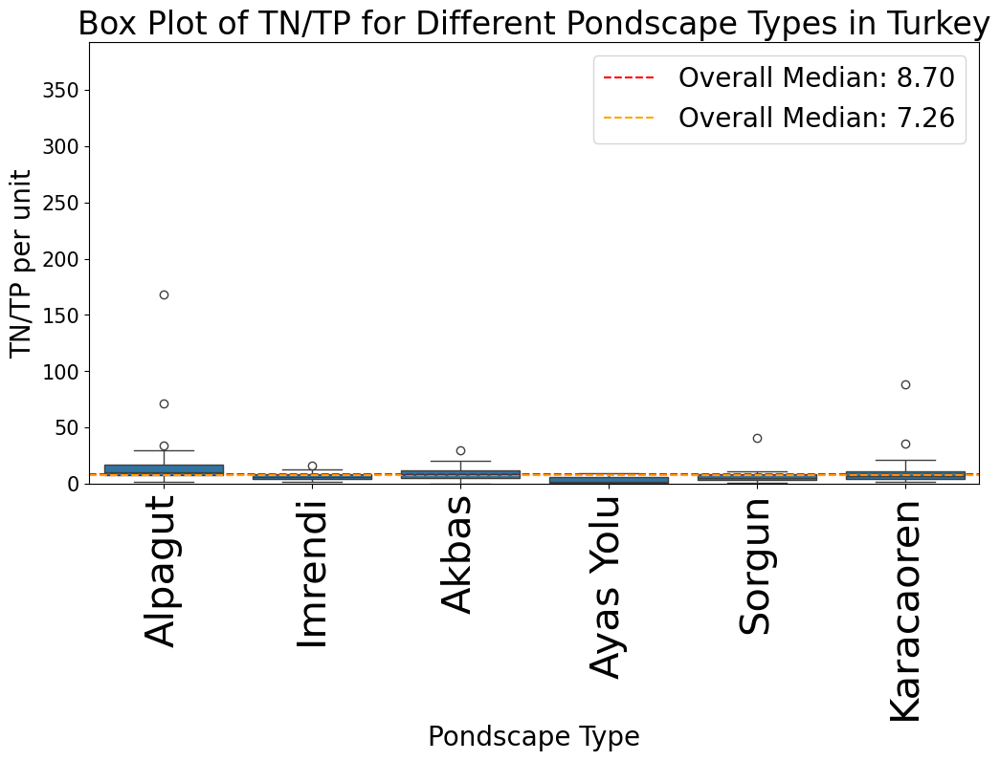

In [86]:
variables = ['TN', 'TP', 'TOC', 'DOC', 'O2_con', 'O2_sat', 'Cond','TN/TP']

for i in variables:
    dataset = joined_physiochem[joined_physiochem[i].notnull()]
    print(dataset[i].dtype)
    print(i)
    if dataset[i].dtype == 'float64':
        countries = dataset['Country'].unique()
        print(f"Full range for {i}: ({min(dataset[i]):.2f},{max(dataset[i]):.2f})")
        for country in countries:
            # Filter data for the current country
            country_data = dataset[dataset['Country'] == country]
            print(f"Range for {i} in {country}: ({min(country_data[i]):.2f},{max(country_data[i]):.2f})")

            plt.figure(figsize=(12, 6))
            # Create box plot for all 'Pondscape' types in the chosen country
            sns.boxplot(data=country_data, x='Pondscape', y=i)
            # Set title and labels
            plt.title(f'Box Plot of {i} for Different Pondscape Types in {country}')
            plt.xlabel('Pondscape Type')
            plt.ylabel(f'{i} per unit')
            # Set y-axis limits
            plt.ylim(0, max(dataset[i]))
            # Add a horizontal line for the overall median
            plt.axhline(y=dataset[i].median(), color='red', linestyle='--', label=f'Overall Median: {dataset[i].median():.2f}')
            plt.axhline(y=country_data[i].median(), color='orange', linestyle='--', label=f'Overall Median: {country_data[i].median():.2f}')

            plt.xticks(rotation=90)
            plt.legend()
            plt.show()


In [ ]:
###By landuse

In [56]:
LandUse_5m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES'],
      dtype='object')

In [ ]:
###Stacked bar chart

In [57]:
land5m_variables= ['Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other']

In [58]:
joined_physico_LandUse_5m_pre=LandUse_5m.merge(joined_physiochem_pre,on='PondCode',how='left')

In [59]:
joined_physico_LandUse_5m_pre

,PondCode,AssessmentDate,Perimeter,Woodland,Moorland,Rank_veg,Unimp_grassland,Semimp_grassland,Imp_grassland,Arable,...,Pondscape,Country,DemoSite,Strat_Survey,Resampling,Case_Urban,Case_FishPonds,Case_Restoration,NOTES_y,Case_Turkey
0,AW1_EX1,2021-10-18,5,2,20,0,20,0,0,0,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
1,AW1_EX1,2021-10-18,5,2,20,0,20,0,0,0,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
2,AW1_EX1,2021-10-18,5,2,20,0,20,0,0,0,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
3,AW1_EX1,2021-10-18,5,2,20,0,20,0,0,0,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
4,AW1_EX2,2021-10-08,5,35,15,0,50,0,0,0,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,SO5,2022-06-01,5,10,0,25,0,5,0,0,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1596,SO5,2022-06-01,5,10,0,25,0,5,0,0,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1597,SO5,2022-06-01,5,10,0,25,0,5,0,0,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1598,SO5,2022-06-01,5,10,0,25,0,5,0,0,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0


In [60]:
joined_physico_LandUse_5m = joined_physico_LandUse_5m_pre[(joined_physico_LandUse_5m_pre['Strat_Survey'] == 1) | (joined_physico_LandUse_5m_pre['Resampling'] == 1)]

joined_physico_LandUse_5m=joined_physico_LandUse_5m[joined_physico_LandUse_5m['Case_Urban']==0]
joined_physico_LandUse_5m=joined_physico_LandUse_5m[joined_physico_LandUse_5m['Case_FishPonds']==0]
joined_physico_LandUse_5m=joined_physico_LandUse_5m[joined_physico_LandUse_5m['Case_Restoration']==0]

In [61]:
joined_physico_LandUse_5m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES', 'MeasurementDate', 'pH', 'O2_con',
       'O2_sat', 'Turb', 'Sludge', 'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC',
       'TOC', 'CHLa', 'PC', 'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg',
       'Na', 'K', 'TSS', 'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3',
       'CHLa_Spectro', 'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU',
       'P.PO4', 'N.NO2', 'N.NO3', 'N.NH4',
       'Notes..different.date.O2.spls.taken', 'pondscape', 'OM',
       'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey'],
      dtype='object')

In [62]:
joined_physico_LandUse_5m.shape

(1470, 75)

In [322]:
joined_physico_LandUse_5m['TN'].dtype

dtype('float64')

In [323]:
convert_datasets(variables,joined_physico_LandUse_5m)

TOC
DOC
Cond


/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():
/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():
/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():


In [87]:
joined_physico_LandUse_5m['Woodland'].unique()

array([  2,  35,   1,  40,   0,  10,  25,  45,  60,   5,  15,  20,  30,
        90,   3,  95,  85,  70,  97,  50, 100,  75,  65,  80,   8,  55,
        99])

<Axes: xlabel='Woodland', ylabel='Count'>

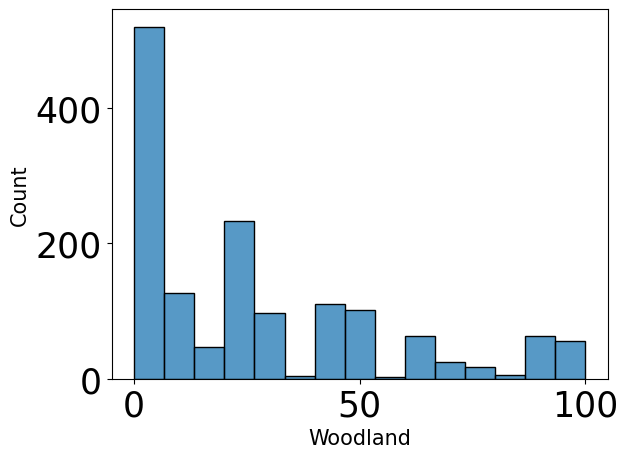

In [302]:
sns.histplot(joined_physico_LandUse_5m['Woodland'])

In [359]:
landuse_5m_va=['Woodland', 'Moorland','Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
               'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other','TN', 'TP', 'TOC', 'DOC', 'O2_con',
               'O2_sat', 'Cond','TN/TP',]

In [402]:
df_clean=joined_physico_LandUse_5m[joined_physico_LandUse_5m[landuse_5m_va].notnull()]
corr=df_clean[landuse_5m_va].corr(method='spearman')
corr

,Woodland,Moorland,Rank_veg,Unimp_grassland,Semimp_grassland,Imp_grassland,Arable,Urban,Rock,Marsh,Streams,Other,TN,TP,TOC,DOC,O2_con,O2_sat,Cond,TN/TP
Woodland,1.000000,-0.010781,-0.057959,-0.107803,-0.158088,-0.079337,-0.087203,-0.089199,-0.113301,-0.128146,0.010890,0.064289,-0.120921,-0.053211,-0.040011,0.002307,0.000522,-0.025584,0.033859,-0.012448
Moorland,-0.010781,1.000000,-0.230698,-0.072176,-0.125915,-0.094720,-0.081966,-0.055189,0.084303,-0.095430,0.048186,-0.021243,-0.198628,-0.078315,-0.017864,-0.072465,0.117984,0.099600,-0.215737,-0.048947
Rank_veg,-0.057959,-0.230698,1.000000,-0.244441,-0.255079,-0.003062,0.016592,-0.084465,0.044574,-0.179791,-0.003704,-0.031912,0.090968,0.048695,-0.034646,0.041798,-0.020958,-0.033926,0.180286,0.039944
Unimp_grassland,-0.107803,-0.072176,-0.244441,1.000000,-0.249253,-0.181314,-0.200211,-0.057783,0.150088,0.120771,-0.003801,-0.056551,-0.160700,-0.065902,0.038343,0.029335,0.015035,0.027353,0.046682,-0.024713
Semimp_grassland,-0.158088,-0.125915,-0.255079,-0.249253,1.000000,-0.126453,-0.016010,-0.073678,-0.066580,0.107814,0.017894,-0.028360,0.203711,0.151494,0.116048,0.055340,-0.144615,-0.124001,-0.007946,-0.086487
Imp_grassland,-0.079337,-0.094720,-0.003062,-0.181314,-0.126453,1.000000,0.156044,0.319590,-0.118461,0.001886,0.001042,-0.021334,-0.011946,0.052944,-0.210280,-0.188596,0.121963,0.116889,-0.097031,-0.061776
Arable,-0.087203,-0.081966,0.016592,-0.200211,-0.016010,0.156044,1.000000,0.223289,-0.146204,-0.130633,-0.030009,-0.026330,0.174838,0.128651,-0.081658,-0.121421,0.016459,0.022202,0.078593,-0.020380
Urban,-0.089199,-0.055189,-0.084465,-0.057783,-0.073678,0.319590,0.223289,1.000000,-0.069022,-0.103346,0.015579,-0.012430,-0.013707,-0.076629,0.059714,0.014411,0.083575,0.085326,0.089913,0.086969
Rock,-0.113301,0.084303,0.044574,0.150088,-0.066580,-0.118461,-0.146204,-0.069022,1.000000,0.324788,0.317462,-0.026568,-0.200040,-0.146340,-0.064941,0.013941,-0.130215,-0.081975,0.012394,0.031629
Marsh,-0.128146,-0.095430,-0.179791,0.120771,0.107814,0.001886,-0.130633,-0.103346,0.324788,1.000000,0.270424,-0.039780,-0.125361,-0.151954,-0.031875,-0.054063,-0.125968,-0.106096,-0.087791,0.066709


In [380]:
joined_physico_LandUse_100m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES', 'MeasurementDate', 'pH', 'O2_con',
       'O2_sat', 'Turb', 'Sludge', 'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC',
       'TOC', 'CHLa', 'PC', 'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg',
       'Na', 'K', 'TSS', 'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3',
       'CHLa_Spectro', 'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU',
       'P.PO4', 'N.NO2', 'N.NO3', 'N.NH4',
       'Notes..different.date.O2.spls.taken', 'pondscape', 'OM',
       'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey', 'TN/TP'],
      dtype='object')

In [373]:
corr.min()

Woodland           -0.158088
Moorland           -0.230698
Rank_veg           -0.255079
Unimp_grassland    -0.249253
Semimp_grassland   -0.255079
Imp_grassland      -0.210280
Arable             -0.200211
Urban              -0.103346
Rock               -0.200040
Marsh              -0.179791
Streams            -0.046856
Other              -0.056551
TN                 -0.200040
TP                 -0.795126
TOC                -0.210280
DOC                -0.188596
O2_con             -0.190388
O2_sat             -0.186091
Cond               -0.215737
TN/TP              -0.795126
dtype: float64

In [ ]:
###numerical variables

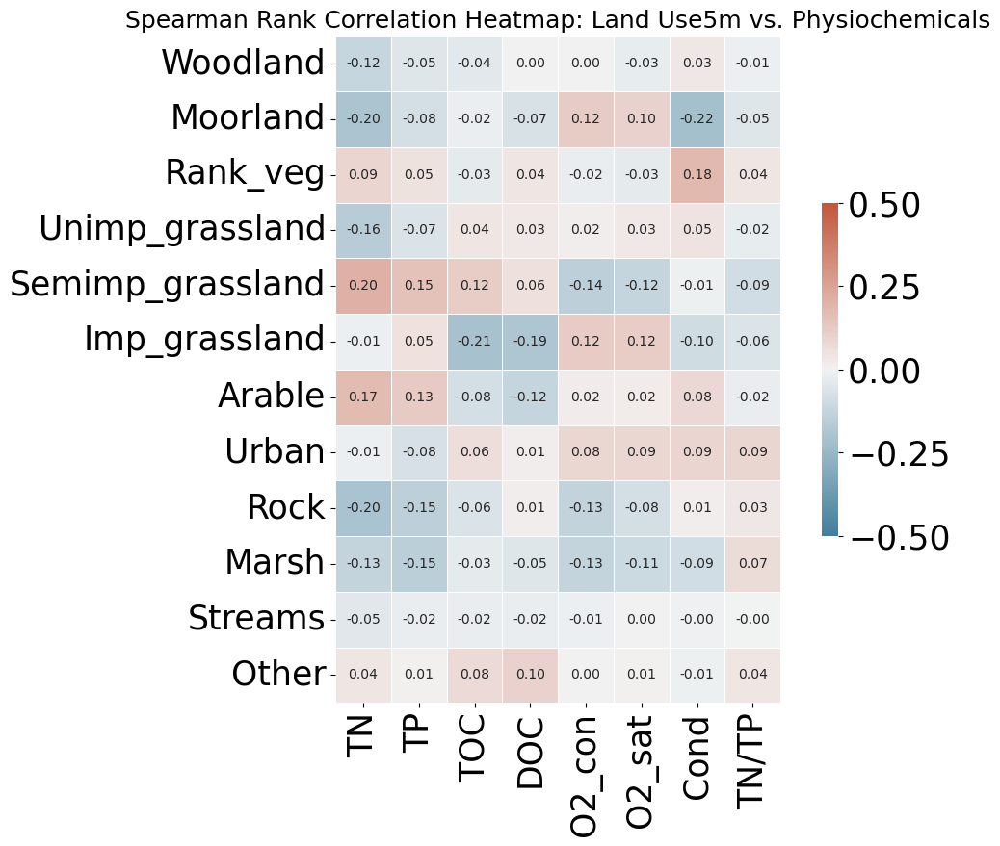

In [403]:

selected_variables_y = ['Woodland', 'Moorland', 'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland', 'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other']
selected_variables_x = ['TN', 'TP', 'TOC', 'DOC', 'O2_con', 'O2_sat', 'Cond', 'TN/TP']

corr_subset = corr.loc[selected_variables_y, selected_variables_x]

# No mask needed for a square heatmap

f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr_subset, cmap=cmap, center=0, square=True,
            linewidths=.5, cbar_kws={'shrink': .5}, vmin=-0.5, vmax=0.5,
            annot=True, fmt=".2f", annot_kws={"size": 10})

# Mark squares where absolute correlation coefficients are >= 0.3
for i in range(len(selected_variables_y)):
    for j in range(len(selected_variables_x)):
        if abs(corr_subset.iloc[i, j]) >= 0.3:
            ax.text(j + 0.5, i + 0.5, "{:.2f}".format(corr_subset.iloc[i, j]),
                    ha='center', va='center', color='red', fontsize=10)



# Set the title of the heatmap
ax.set_title('Spearman Rank Correlation Heatmap: Land Use5m vs. Physiochemicals')

plt.show()

In [383]:
convert_datasets(variables,joined_physico_LandUse_100m)

TOC
DOC
Cond


/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():
/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():
/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():


In [397]:
df_clean=joined_physico_LandUse_100m[joined_physico_LandUse_100m[landuse_5m_va].notnull()]
corr=df_clean[landuse_5m_va].corr(method='spearman')
corr

,Woodland,Moorland,Rank_veg,Unimp_grassland,Semimp_grassland,Imp_grassland,Arable,Urban,Rock,Marsh,Streams,Other,TN,TP,TOC,DOC,O2_con,O2_sat,Cond,TN/TP
Woodland,1.000000,0.066270,0.189236,0.023559,-0.180918,-0.066436,-0.456732,-0.081585,0.116943,0.234622,0.195341,-0.022971,-0.169637,-0.211492,-0.032947,-0.036910,-0.057614,-0.077081,-0.203106,0.147322
Moorland,0.066270,1.000000,-0.086321,0.020039,-0.150798,-0.069033,-0.211784,-0.096094,0.219997,0.083996,0.101309,0.172111,-0.224461,-0.100643,-0.073767,-0.105796,0.067444,0.062628,-0.176411,-0.030370
Rank_veg,0.189236,-0.086321,1.000000,-0.153798,-0.227868,0.070912,0.025203,0.025323,0.211090,0.005464,0.038835,0.066980,0.055256,0.013411,-0.151818,-0.091084,-0.069660,-0.085020,0.156162,0.042541
Unimp_grassland,0.023559,0.020039,-0.153798,1.000000,-0.262663,-0.271894,-0.400924,-0.113498,0.143461,0.174352,0.035279,0.075960,-0.157430,-0.063738,0.050093,0.020134,0.026123,0.040707,0.054785,-0.021665
Semimp_grassland,-0.180918,-0.150798,-0.227868,-0.262663,1.000000,-0.080353,0.040355,0.051247,-0.057799,0.126613,0.026312,0.015168,0.224116,0.191841,0.144126,0.114551,-0.151674,-0.130868,0.053719,-0.109918
Imp_grassland,-0.066436,-0.069033,0.070912,-0.271894,-0.080353,1.000000,-0.034117,0.245572,-0.146988,-0.009350,-0.058974,-0.001161,0.033774,0.056099,-0.180369,-0.156376,0.043141,0.038389,-0.120444,-0.038071
Arable,-0.456732,-0.211784,0.025203,-0.400924,0.040355,-0.034117,1.000000,0.085693,-0.263921,-0.237841,-0.171207,-0.020651,0.342013,0.243112,0.076670,0.120325,-0.027983,-0.029911,0.322404,-0.046726
Urban,-0.081585,-0.096094,0.025323,-0.113498,0.051247,0.245572,0.085693,1.000000,0.006739,-0.066261,-0.020890,0.014967,0.040382,0.019638,0.070247,0.028114,0.007242,0.014646,0.129740,-0.003677
Rock,0.116943,0.219997,0.211090,0.143461,-0.057799,-0.146988,-0.263921,0.006739,1.000000,0.252390,0.316388,0.109412,-0.221142,-0.149914,-0.063758,0.026209,-0.118519,-0.065647,-0.029230,0.021028
Marsh,0.234622,0.083996,0.005464,0.174352,0.126613,-0.009350,-0.237841,-0.066261,0.252390,1.000000,0.337271,0.030932,-0.126341,-0.142960,-0.022759,-0.059001,-0.152412,-0.135666,-0.128295,0.051399


In [406]:
corr_livestock_d= joined_physico_human_activity[['Grazing_int','TN', 'TP', 'TOC', 
                                                 'DOC', 'O2_con', 'O2_sat', 'Cond', 'TN/TP']].corr(method='spearman')
corr_livestock_d                                                                                         

,Grazing_int,TN,TP,TOC,DOC,O2_con,O2_sat,Cond,TN/TP
Grazing_int,1.000000,-0.083763,0.021424,0.042658,0.060120,0.041446,0.069203,-0.132213,-0.084267
TN,-0.083763,1.000000,0.568769,-0.163868,-0.232003,-0.187429,-0.187823,0.277242,0.003796
TP,0.021424,0.568769,1.000000,-0.186051,-0.194620,-0.133203,-0.115596,0.200188,-0.786750
TOC,0.042658,-0.163868,-0.186051,1.000000,0.934402,0.052023,0.022194,-0.062865,0.095978
DOC,0.060120,-0.232003,-0.194620,0.934402,1.000000,0.131919,0.093881,-0.045801,0.077933
O2_con,0.041446,-0.187429,-0.133203,0.052023,0.131919,1.000000,0.964726,-0.108939,0.056426
O2_sat,0.069203,-0.187823,-0.115596,0.022194,0.093881,0.964726,1.000000,-0.116965,0.039647
Cond,-0.132213,0.277242,0.200188,-0.062865,-0.045801,-0.108939,-0.116965,1.000000,-0.014500
TN/TP,-0.084267,0.003796,-0.786750,0.095978,0.077933,0.056426,0.039647,-0.014500,1.000000


In [ ]:
###categorical data

In [347]:
from scipy.stats import chi2_contingency

In [ ]:
cros_tab=pd.crosstab(index=df

                     

<Axes: >

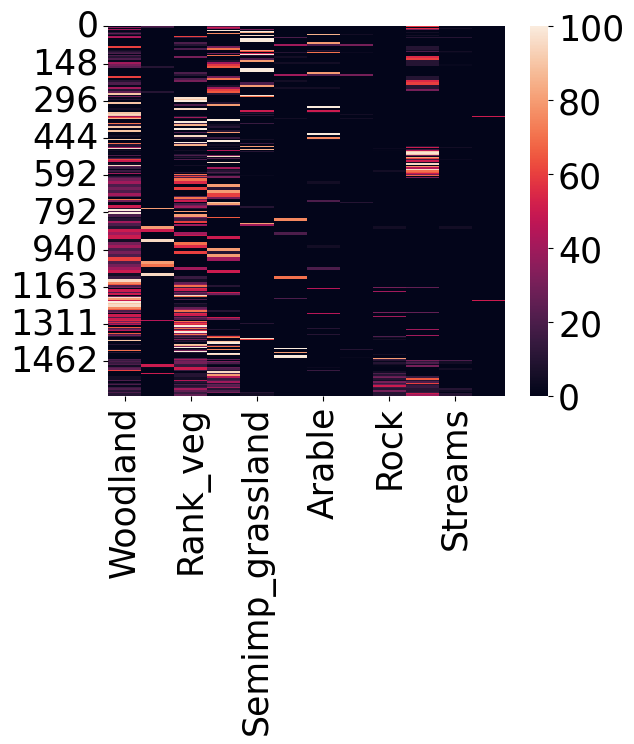

In [332]:
sns.heatmap(data=joined_physico_LandUse_5m[['Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other']],)

In [331]:
joined_physico_LandUse_5m.shape

(1470, 76)

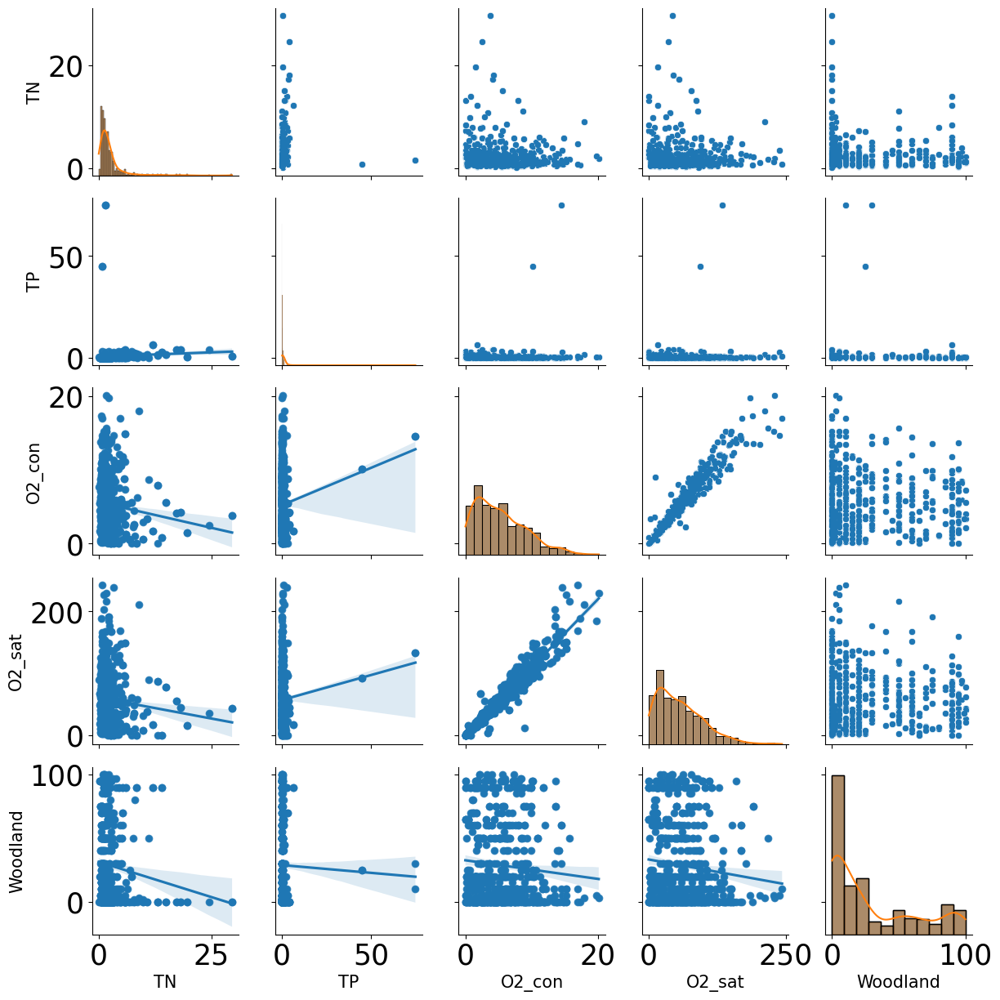

In [310]:
g = sns.pairplot(joined_physico_LandUse_5m[['TN', 'TP', 'TOC', 'DOC', 'O2_con',
                                            'O2_sat', 'Cond','Woodland']].dropna())


g.map_upper(plt.scatter, s=10,)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.regplot)


In [324]:


# Assume joined_physico_LandUse_5m is your dataframe containing the data
# Extract independent and dependent variables
independent_vars = joined_physico_LandUse_5m[['Woodland', 'Moorland', 'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland', 'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other']]
dependent_vars = joined_physico_LandUse_5m[['TN', 'TP', 'TOC', 'DOC', 'O2_con', 'O2_sat', 'Cond']]

# Standardize the data
scaler = StandardScaler()
independent_vars_scaled = scaler.fit_transform(independent_vars)
dependent_vars_scaled = scaler.fit_transform(dependent_vars)

# Perform PCA on the independent variables
pca = PCA()
pca.fit(independent_vars_scaled)

# Get the principal components
components = pca.components_

# Create a DataFrame to hold the results
pca_results = pd.DataFrame(components, columns=independent_vars.columns)

# Print the results
print("Principal Components:")
print(pca_results)

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained Variance Ratio:")
print(explained_variance_ratio)


Principal Components:
    Woodland  Moorland  Rank_veg  Unimp_grassland  Semimp_grassland  \
0   0.080759 -0.110108  0.355338        -0.321583         -0.029993   
1  -0.606383  0.014571 -0.273999         0.066737          0.245266   
2  -0.177313  0.006881  0.523148        -0.619974          0.016805   
3   0.106315  0.271718 -0.326214        -0.389922          0.694246   
4   0.409326  0.422642 -0.354528        -0.291888         -0.347051   
5   0.257506 -0.733772 -0.086840        -0.090566          0.173121   
6   0.054819 -0.165054 -0.146185        -0.021009         -0.187616   
7  -0.361024  0.186718  0.192409         0.103427          0.089011   
8   0.185177 -0.199341 -0.084368        -0.053897          0.346167   
9   0.024313 -0.090092  0.007634         0.244003          0.092604   
10  0.030377  0.091630  0.150119        -0.024407          0.088215   
11 -0.424299 -0.279969 -0.444101        -0.433758         -0.356311   

    Imp_grassland    Arable     Urban      Rock     Ma

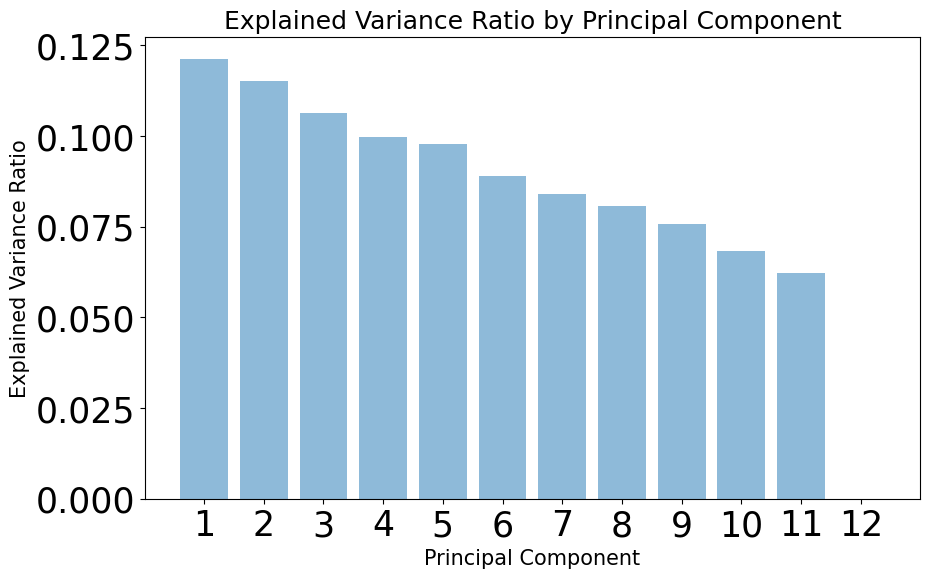

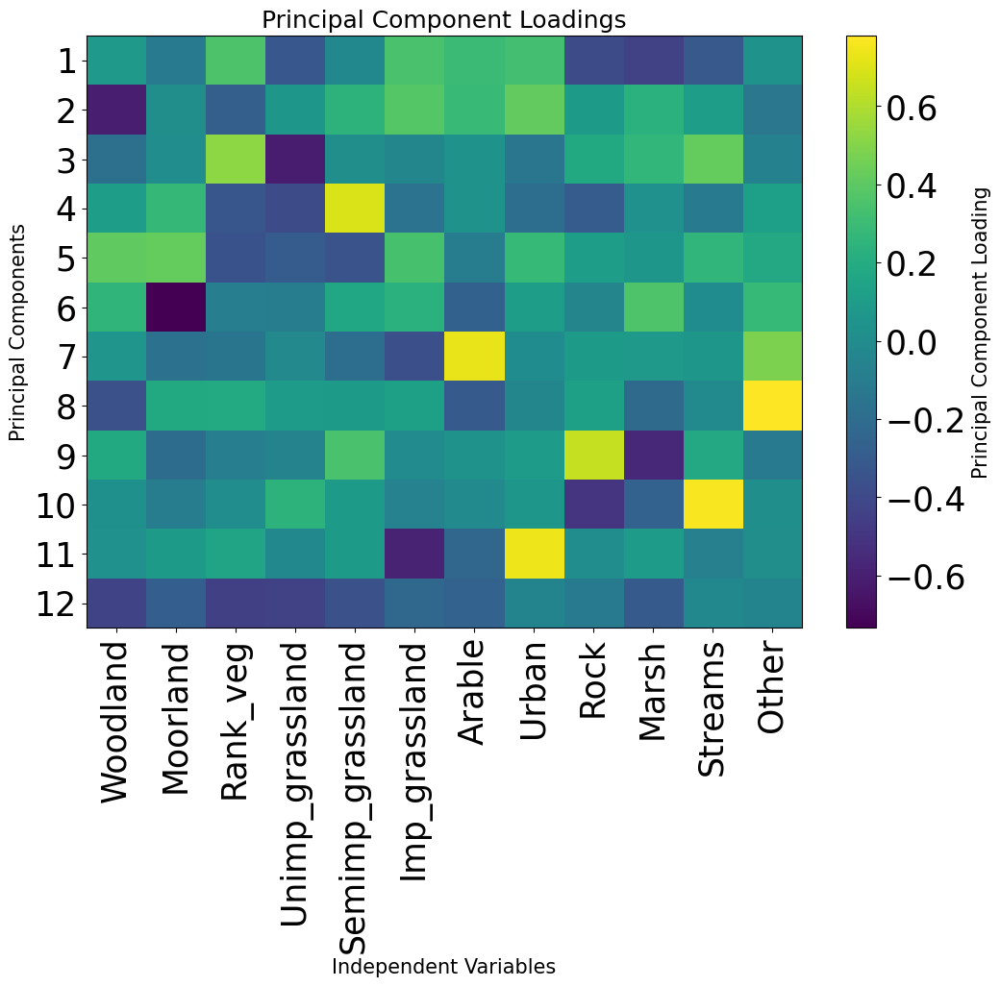

In [325]:
import matplotlib.pyplot as plt

# Plot the principal components
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, alpha=0.5, align='center')
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio by Principal Component')
plt.show()

# Plot the principal components in a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(components, cmap='viridis', aspect='auto')
plt.colorbar(label='Principal Component Loading')
plt.xticks(range(len(independent_vars.columns)), independent_vars.columns, rotation=90)
plt.yticks(range(len(pca.components_)), range(1, len(pca.components_) + 1))
plt.xlabel('Independent Variables')
plt.ylabel('Principal Components')
plt.title('Principal Component Loadings')
plt.show()


In [63]:
LandUse_100m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES'],
      dtype='object')

In [64]:
joined_physico_LandUse_100m_pre=LandUse_100m.merge(joined_physiochem_pre,on='PondCode',how='left')

In [65]:

joined_physico_LandUse_100m = joined_physico_LandUse_100m_pre[(joined_physico_LandUse_100m_pre['Strat_Survey'] == 1) | (joined_physico_LandUse_5m_pre['Resampling'] == 1)]

joined_physico_LandUse_100m=joined_physico_LandUse_100m[joined_physico_LandUse_100m['Case_Urban']==0]
joined_physico_LandUse_100m=joined_physico_LandUse_100m[joined_physico_LandUse_100m['Case_FishPonds']==0]
joined_physico_LandUse_100m=joined_physico_LandUse_100m[joined_physico_LandUse_100m['Case_Restoration']==0]

In [66]:
joined_physico_LandUse_100m['TN/TP']=joined_physico_LandUse_100m['TN']/joined_physico_LandUse_100m['TP']

In [68]:
joined_physico_LandUse_100m.columns

Index(['PondCode', 'AssessmentDate', 'Perimeter', 'Woodland', 'Moorland',
       'Rank_veg', 'Unimp_grassland', 'Semimp_grassland', 'Imp_grassland',
       'Arable', 'Urban', 'Rock', 'Marsh', 'Streams', 'Other',
       'Detail_OtherHabitatType', 'NOTES', 'MeasurementDate', 'pH', 'O2_con',
       'O2_sat', 'Turb', 'Sludge', 'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC',
       'TOC', 'CHLa', 'PC', 'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg',
       'Na', 'K', 'TSS', 'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3',
       'CHLa_Spectro', 'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU',
       'P.PO4', 'N.NO2', 'N.NO3', 'N.NH4',
       'Notes..different.date.O2.spls.taken', 'pondscape', 'OM',
       'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey', 'TN/TP'],
      dtype='object')

In [ ]:
print(variables)

### Correlation Human activity

In [217]:
joined_physico_human_activity_pre=human_activity.merge(joined_physiochem_pre,how='left',on='PondCode')

In [239]:
human_activity

,PondCode,AssessmentYear,Hydr_infrastr,Unp_road,P_road,CS.WTP.F.IP,GCF,Other_buildings,Pond_grazed,Pond_perim_grazed,...,Freq_people_vis,Vis_rubbish,IP.H.LO,PA,Managed,Dom_fauna,Fauna,A/L/P,Notes,Year
0,AW1_EX1,2021.0,0,1,0,0,0,0,0,0,...,1,0,0,1,0,0,NaN,NaN,NaN,NaN
1,AW1_EX2,2021.0,1,1,0,0,0,0,0,0,...,2,0,0,1,0,0,NaN,NaN,NaN,NaN
2,AW1_IN1,2021.0,0,1,0,0,0,0,0,50,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
3,AW1_IN2,2021.0,0,1,0,0,0,0,0,80,...,0,0,0,0,0,0,NaN,NaN,NaN,NaN
4,AW1_NA1,2021.0,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,VCL2,2022.0,0,1,0,0,0,1,10,50,...,1,0,0,0,0,1,cattle / horse,around,NaN,NaN
348,VCL3,2022.0,0,0,0,0,0,0,10,20,...,0,0,0,0,0,1,cattle,around,NaN,NaN
349,VCH1,2022.0,0,0,0,0,0,0,50,100,...,1,0,0,0,0,1,"cattle, coypu",around,NaN,NaN
350,VCH2,2022.0,0,0,0,0,0,0,50,100,...,1,0,0,0,0,1,"cattle, coypu",around,NaN,NaN


In [238]:
joined_physiochem_pre

,PondCode,MeasurementDate,pH,O2_con,O2_sat,Turb,Sludge,Snel,Cond,T,...,Pondscape,Country,DemoSite,Strat_Survey,Resampling,Case_Urban,Case_FishPonds,Case_Restoration,NOTES_y,Case_Turkey
0,AW1_EX1,2021-05-10,5.84,7.53,80.90,0.7,6.67,NaN,104.8,17.90,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
1,AW1_EX2,2021-05-20,6.26,7.98,80.10,2.79,1.67,26.00,18.67,17.60,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
2,AW1_IN1,2021-05-31,5.92,3.86,40.42,8.07,0,9.67,57.7,17.40,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
3,AW1_IN2,2021-05-20,6.28,0.84,7.70,19.68,3.67,12.00,298,11.60,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
4,AW1_NA1,2021-05-31,6.45,9.19,105.60,1.42,1,27.33,45.4,22.50,...,Antwerp,Belgium,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1190,SO5,2022-06-08,7.44,8.44,127.04,222.4,NaN,NaN,106.46,28.31,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1191,SO5,2022-08-15,6.71,0.59,7.77,722.43,NaN,NaN,266.01,21.14,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1192,SO5,2022-08-22,6.80,1.35,17.66,726.9,NaN,NaN,466.84,21.74,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0
1193,SO5,2022-09-26,7.95,13.37,147.27,NaN,NaN,NaN,309.81,13.30,...,Sorgun,Turkey,0.0,1.0,1.0,0.0,0.0,0.0,NaN,0.0


In [218]:
joined_physico_human_activity_pre.columns

Index(['PondCode', 'AssessmentYear', 'Hydr_infrastr', 'Unp_road', 'P_road',
       'CS.WTP.F.IP', 'GCF', 'Other_buildings', 'Pond_grazed',
       'Pond_perim_grazed', 'Grazing_int', 'Freq_people_vis', 'Vis_rubbish',
       'IP.H.LO', 'PA', 'Managed', 'Dom_fauna', 'Fauna', 'A/L/P', 'Notes',
       'Year', 'MeasurementDate', 'pH', 'O2_con', 'O2_sat', 'Turb', 'Sludge',
       'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC', 'TOC', 'CHLa', 'PC',
       'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg', 'Na', 'K', 'TSS',
       'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3', 'CHLa_Spectro',
       'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU', 'P.PO4', 'N.NO2',
       'N.NO3', 'N.NH4', 'Notes..different.date.O2.spls.taken', 'pondscape',
       'OM', 'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey'],
      dtype=

In [237]:
joined_physico_human_activity_pre.shape

(1630, 79)

In [219]:

joined_physico_human_activity = joined_physico_human_activity_pre[(joined_physico_human_activity_pre['Strat_Survey'] == 1) | (joined_physico_human_activity_pre['Resampling'] == 1)]

joined_physico_human_activity=joined_physico_human_activity[joined_physico_human_activity['Case_Urban']==0]
joined_physico_human_activity=joined_physico_human_activity[joined_physico_human_activity['Case_FishPonds']==0]
joined_physico_human_activity=joined_physico_human_activity[joined_physico_human_activity['Case_Restoration']==0]

In [220]:
joined_physico_human_activity.columns

Index(['PondCode', 'AssessmentYear', 'Hydr_infrastr', 'Unp_road', 'P_road',
       'CS.WTP.F.IP', 'GCF', 'Other_buildings', 'Pond_grazed',
       'Pond_perim_grazed', 'Grazing_int', 'Freq_people_vis', 'Vis_rubbish',
       'IP.H.LO', 'PA', 'Managed', 'Dom_fauna', 'Fauna', 'A/L/P', 'Notes',
       'Year', 'MeasurementDate', 'pH', 'O2_con', 'O2_sat', 'Turb', 'Sludge',
       'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC', 'TOC', 'CHLa', 'PC',
       'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg', 'Na', 'K', 'TSS',
       'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3', 'CHLa_Spectro',
       'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU', 'P.PO4', 'N.NO2',
       'N.NO3', 'N.NH4', 'Notes..different.date.O2.spls.taken', 'pondscape',
       'OM', 'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey'],
      dtype=

In [221]:
convert_datasets(variables,joined_physico_human_activity)

TOC
DOC
Cond


/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():
/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():
/var/folders/qq/n8l4bgxs53j_s3twq5jzc7g00000gn/T/ipykernel_29125/2806857466.py:6: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if '<4' in dataset[i].unique():


In [222]:
joined_physico_human_activity.columns

Index(['PondCode', 'AssessmentYear', 'Hydr_infrastr', 'Unp_road', 'P_road',
       'CS.WTP.F.IP', 'GCF', 'Other_buildings', 'Pond_grazed',
       'Pond_perim_grazed', 'Grazing_int', 'Freq_people_vis', 'Vis_rubbish',
       'IP.H.LO', 'PA', 'Managed', 'Dom_fauna', 'Fauna', 'A/L/P', 'Notes',
       'Year', 'MeasurementDate', 'pH', 'O2_con', 'O2_sat', 'Turb', 'Sludge',
       'Snel', 'Cond', 'T', 'TN', 'TP', 'DOC', 'TOC', 'CHLa', 'PC',
       'Sulphates', 'Chlorides', 'Alkalinity', 'Ca', 'Mg', 'Na', 'K', 'TSS',
       'NOTES_x', 'Nitrates', 'PO4', 'NH4', 'NO2', 'NO3', 'CHLa_Spectro',
       'NO23', 'Fe', 'Secchi_Depth', 'CHLa_RFU', 'PC_RFU', 'P.PO4', 'N.NO2',
       'N.NO3', 'N.NH4', 'Notes..different.date.O2.spls.taken', 'pondscape',
       'OM', 'chl_a_cold.extraction', 'SRP', 'Pond_ID', 'Local_Name', 'X', 'Y',
       'Pondscape', 'Country', 'DemoSite', 'Strat_Survey', 'Resampling',
       'Case_Urban', 'Case_FishPonds', 'Case_Restoration', 'NOTES_y',
       'Case_Turkey', 'TN/TP'],
   

In [88]:
hu_variables=['Hydr_infrastr', 'Unp_road', 'P_road',
       'CS.WTP.F.IP', 'GCF', 'Other_buildings', 'Pond_grazed',
       'Pond_perim_grazed', 'Grazing_int', 'Freq_people_vis', 'Vis_rubbish',
       'IP.H.LO', 'PA', 'Managed', 'Dom_fauna', 'Fauna', 'A/L/P']

In [176]:
joined_physico_human_activity['Dom_fauna']=joined_physico_human_activity['Dom_fauna'].astype('category')

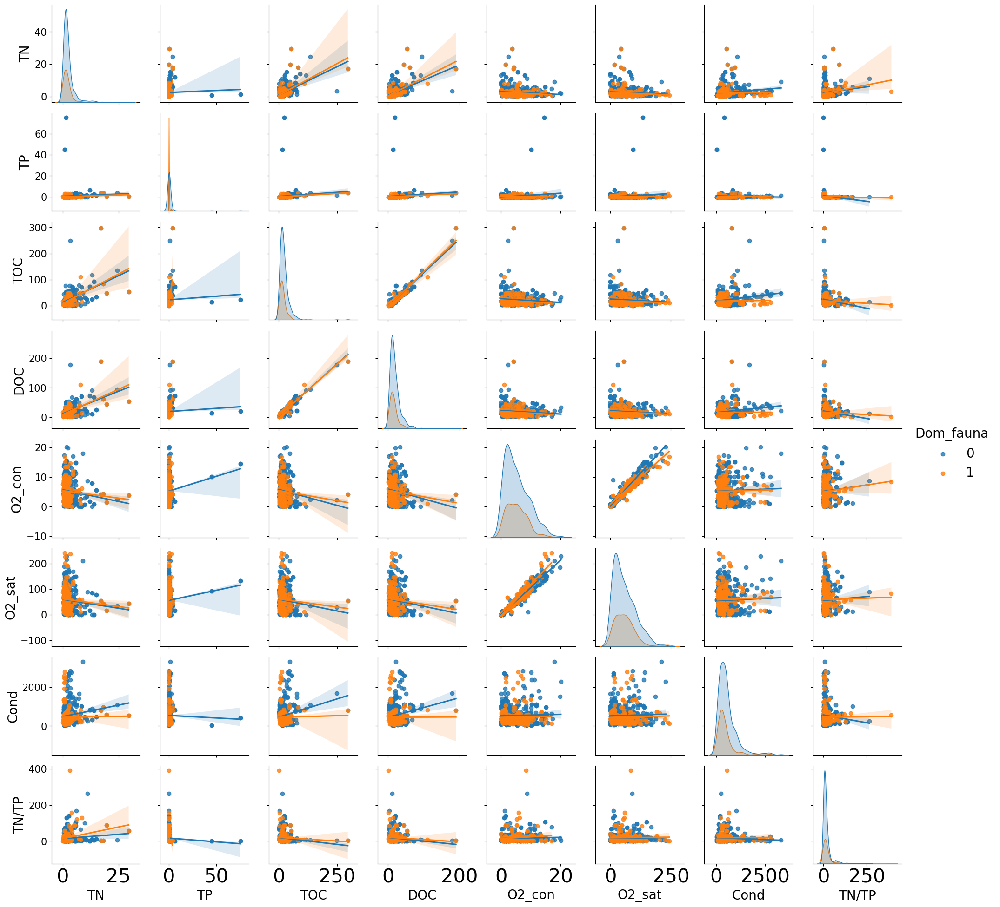

In [182]:
sns.pairplot(joined_physico_human_activity[['TN', 'TP', 'TOC', 'DOC', 'O2_con',
                                            'O2_sat', 'Cond','TN/TP','Dom_fauna']].dropna(),hue='Dom_fauna', kind='reg')



In [ ]:
def corrfunc(x, y, **kws):
    # Calculate the Pearson correlation coefficient between x and y
    r, p = stats.pearsonr(x, y)
    
    # Get the current Axes instance
    ax = plt.gca()
    
    # Get the number of existing annotations
    n_annotations = len(ax.texts)
    
    # Set the initial y-coordinate for the annotation
    y_pos = 0.9 - 0.1 * n_annotations
    
    # Define the annotation text for correlation coefficient (r)
    r_annotation_text = "{}: r = {:.2f}".format(kws['label'], r)
    
    # Define the annotation text for p-value (p)
    p_annotation_text = "p = {:.3f}".format(p)
    
    # Add the annotation for correlation coefficient (r) to the plot
    ax.annotate(r_annotation_text, xy=(0.5, y_pos), xycoords='axes fraction', ha='center')
    
    # Add the annotation for p-value (p) to the plot
    ax.annotate(p_annotation_text, xy=(0.5, y_pos - 0.1), xycoords='axes fraction', ha='center')

In [291]:
joined_physico_human_activity['GCF']=joined_physico_human_activity['GCF'].astype('category')

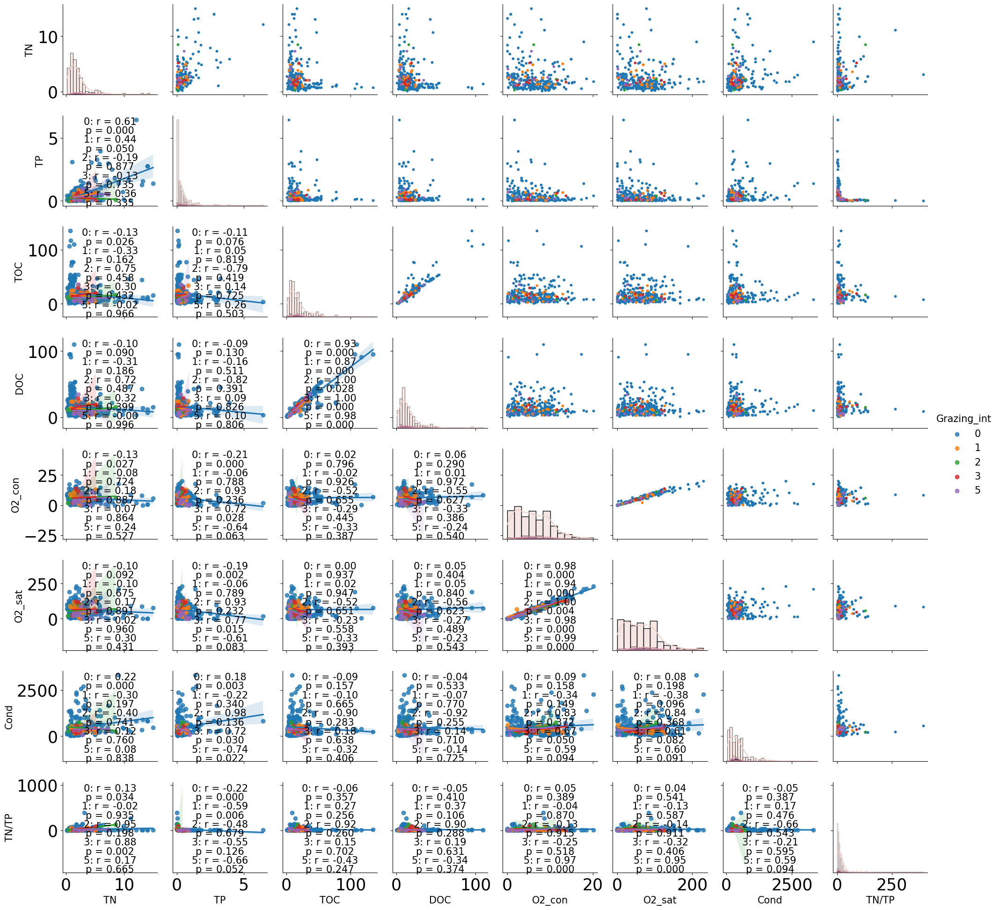

In [299]:
bi_va= 'Grazing_int'
df_clean = joined_physico_human_activity.dropna(subset=['TN', 'TP', 'TOC', 'DOC', 'O2_con',
                                                        'O2_sat', 'Cond', 'TN/TP', bi_va])

g = sns.PairGrid(data = df_clean, vars = ['TN', 'TP', 'TOC', 'DOC', 'O2_con',
                                                     'O2_sat', 'Cond', 'TN/TP'], hue=bi_va)
g.map_upper(plt.scatter, s=10,)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.regplot)
g.map_lower(corrfunc)
g.add_legend()

ValueError: x and y must have length at least 2.

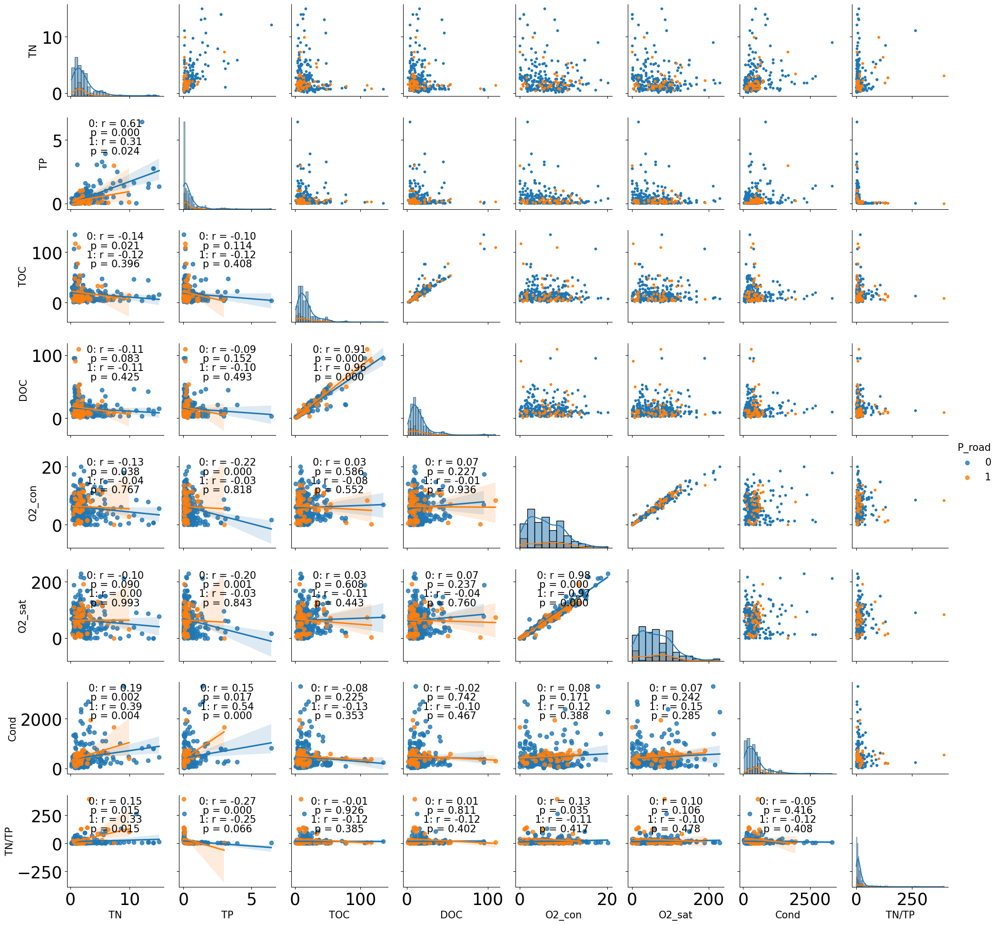

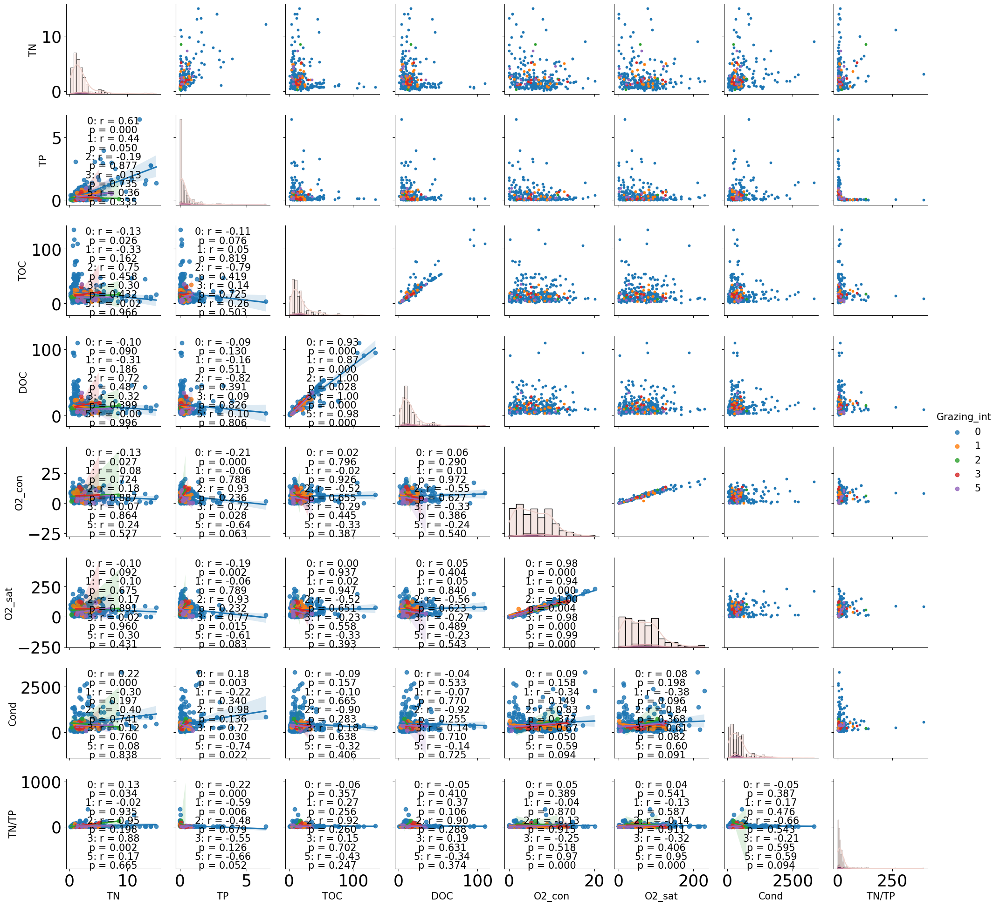

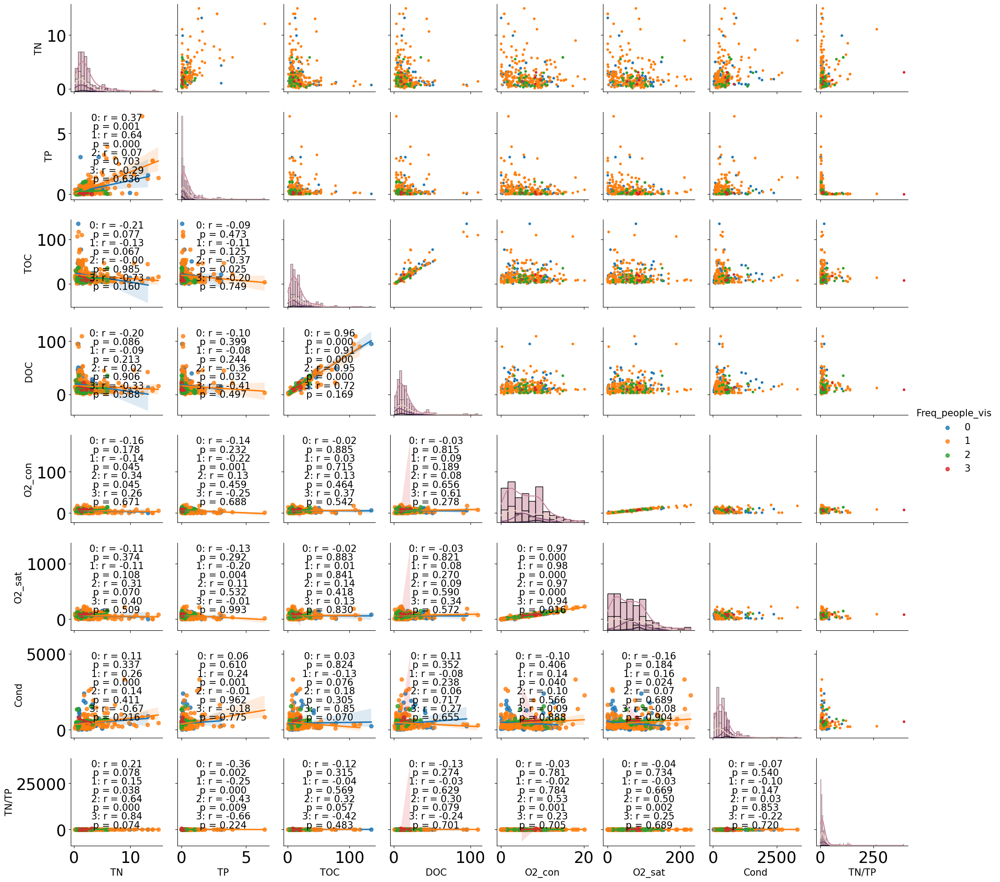

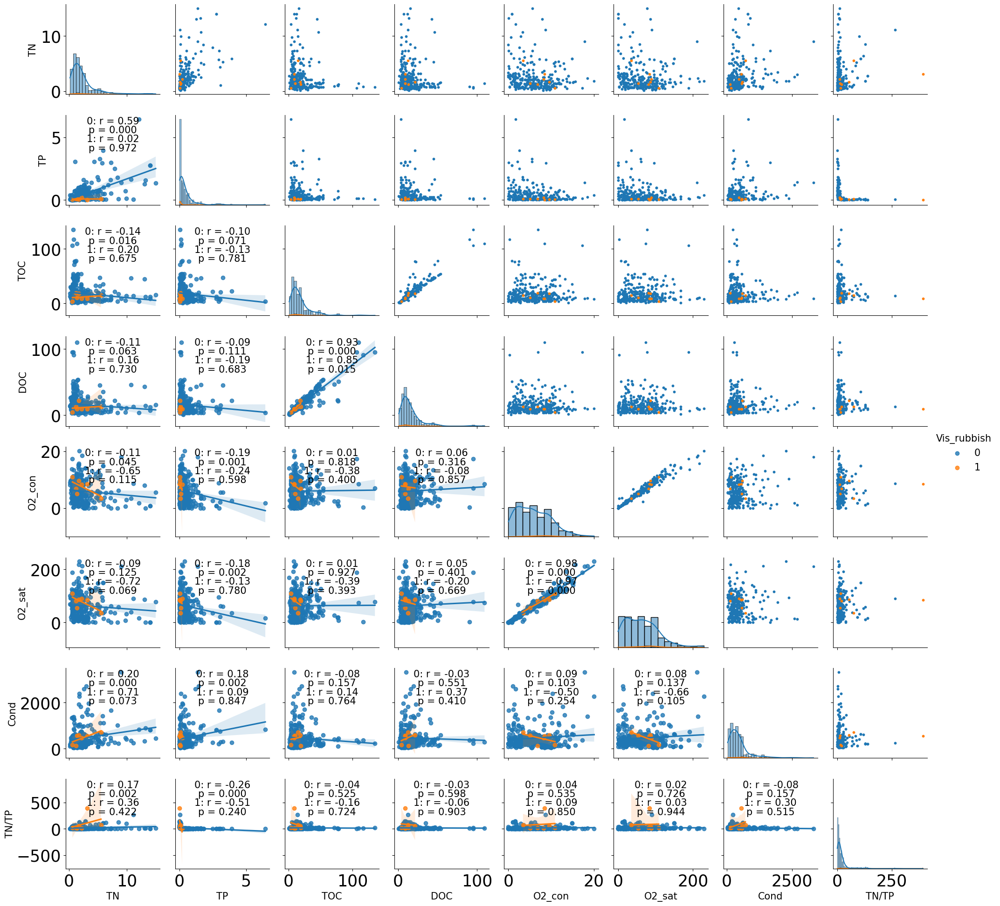

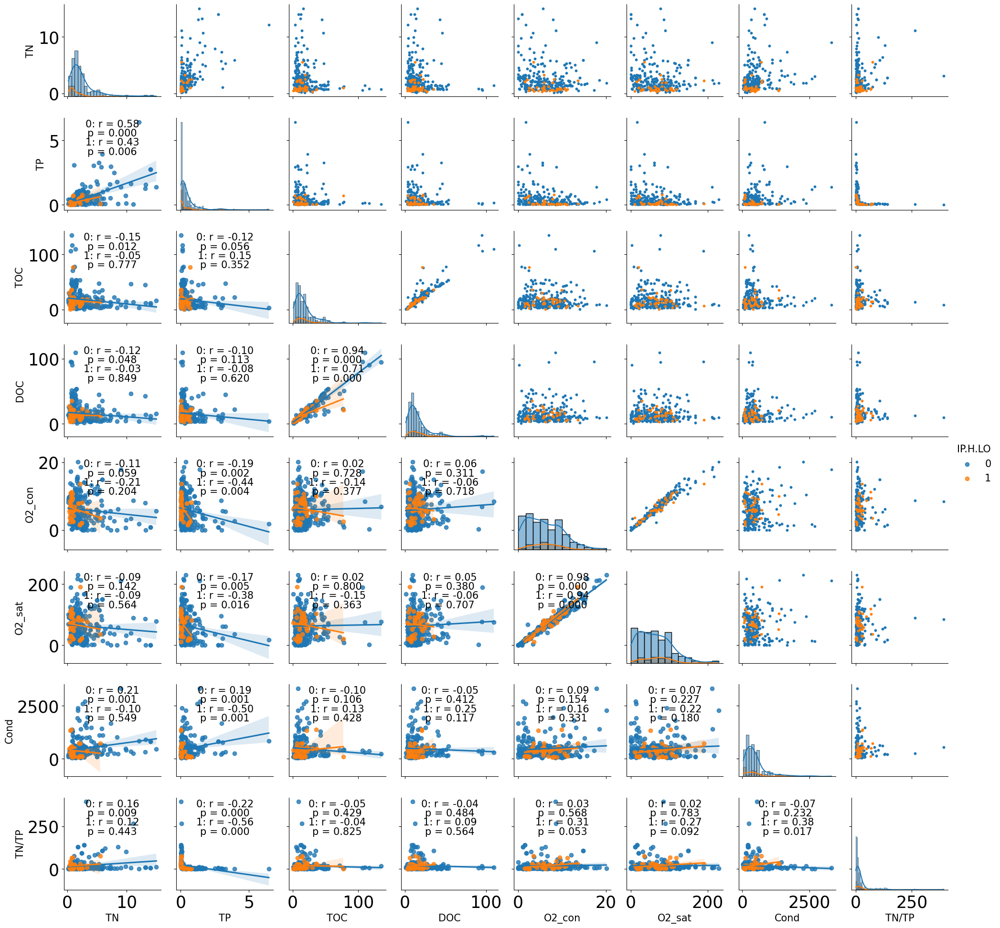

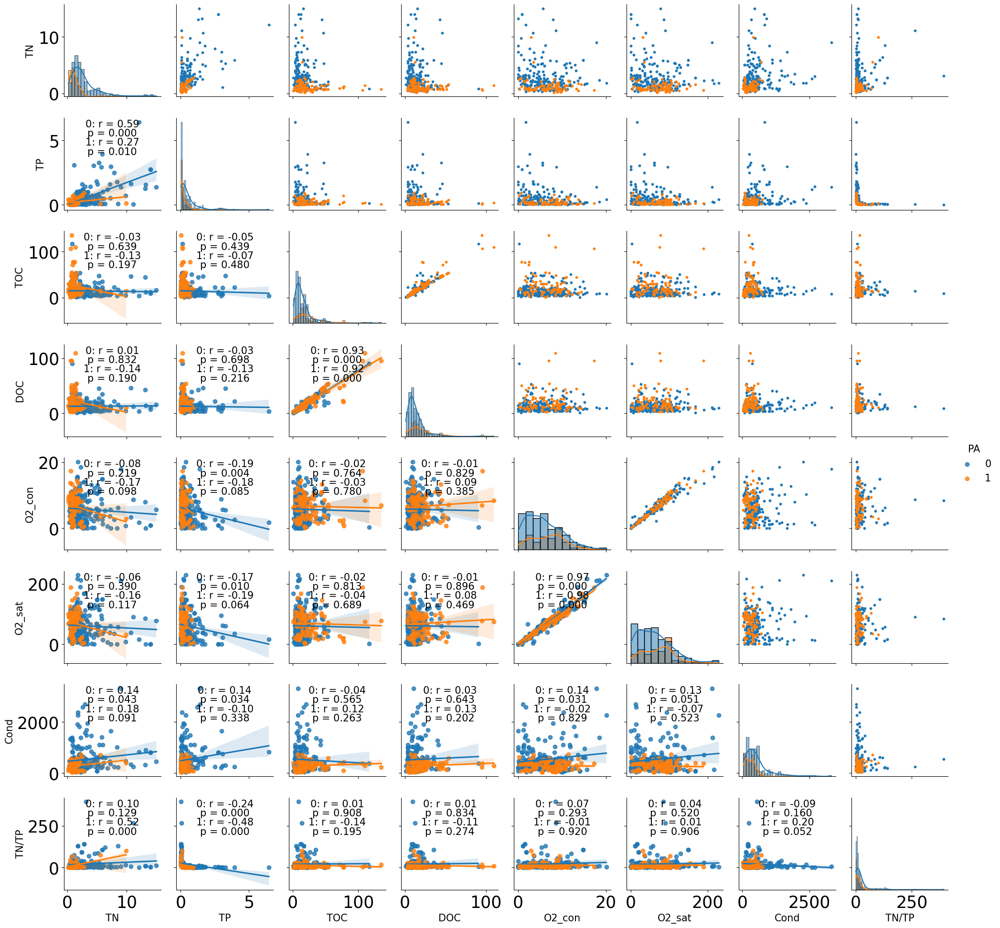

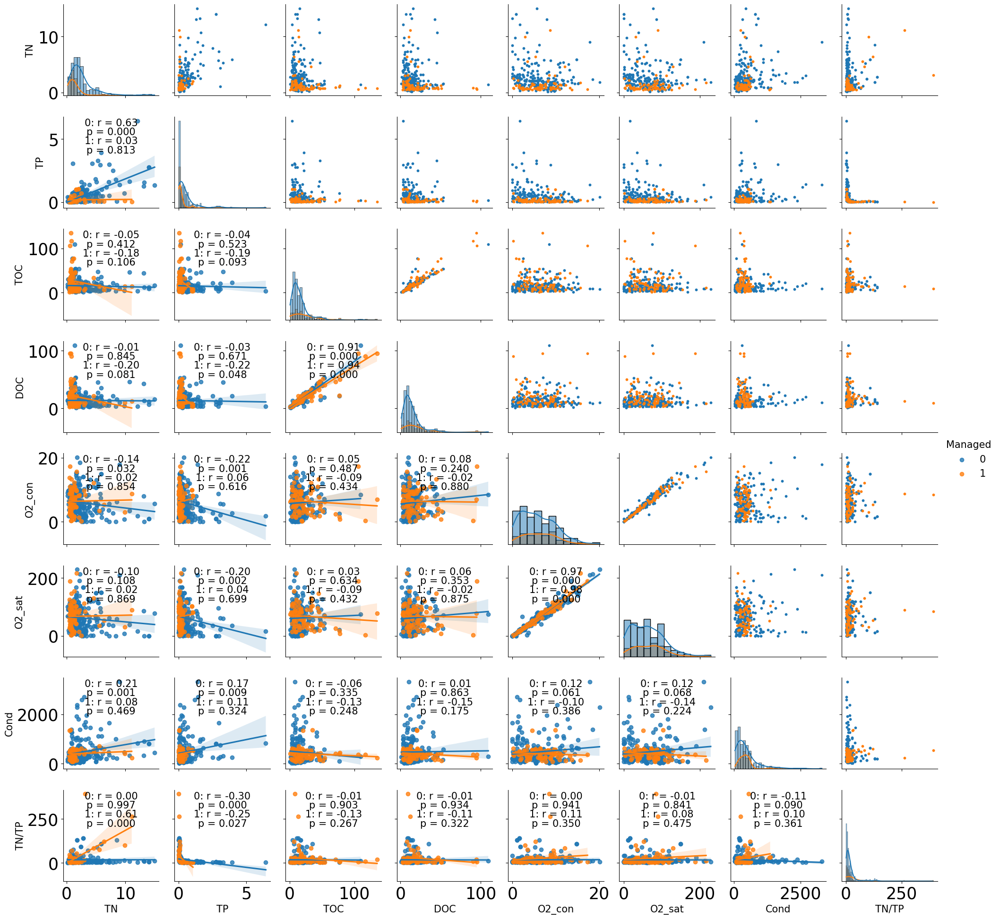

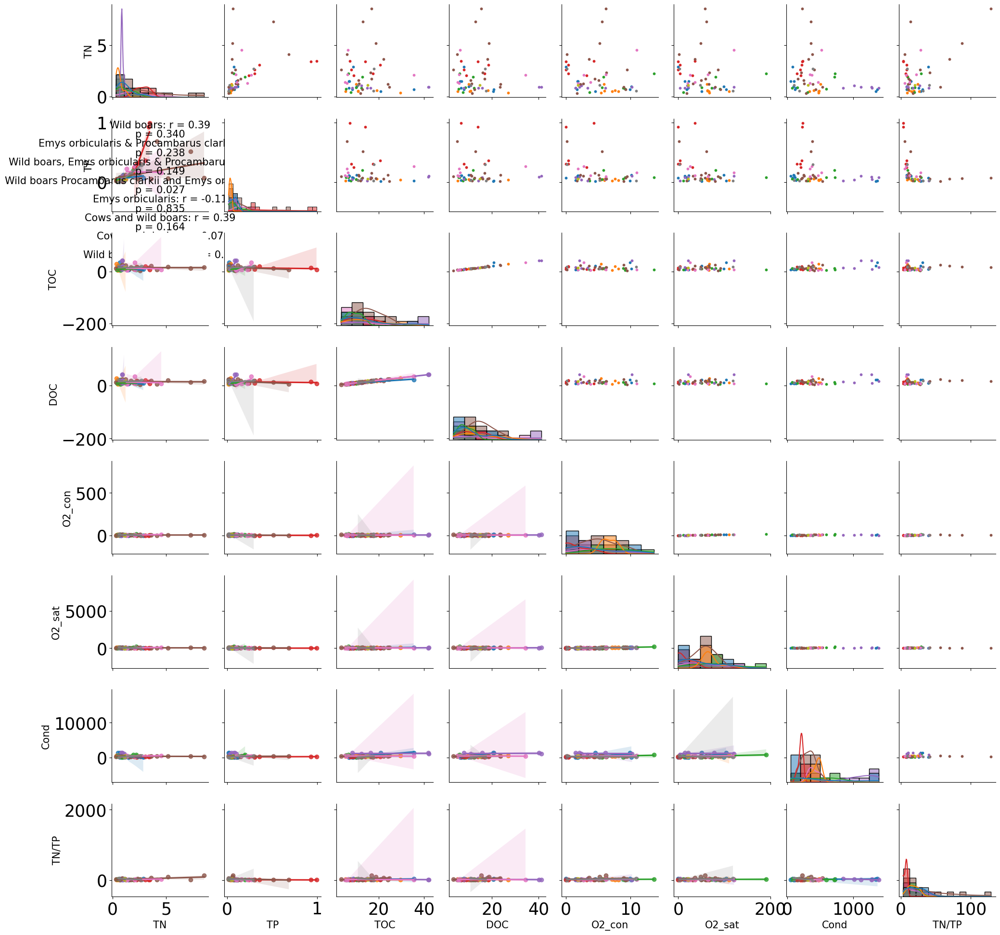

In [301]:
categorical_va=[#'Hydr_infrastr', 'Unp_road', 'CS.WTP.F.IP', 'GCF', 'Other_buildings',
    'P_road', 'Grazing_int', 'Freq_people_vis', 'Vis_rubbish',
       'IP.H.LO', 'PA', 'Managed', 'Fauna', 'A/L/P']
for i in categorical_va:
    df_clean = joined_physico_human_activity.dropna(subset=['TN', 'TP', 'TOC', 'DOC', 'O2_con',
                                                        'O2_sat', 'Cond', 'TN/TP', i])
    g = sns.PairGrid(data = df_clean, vars = ['TN', 'TP', 'TOC', 'DOC', 'O2_con',
                                                     'O2_sat', 'Cond', 'TN/TP'], hue=i)
    g.map_upper(plt.scatter, s=10,)
    g.map_diag(sns.histplot, kde=True)
    g.map_lower(sns.regplot)
    g.map_lower(corrfunc)
    g.add_legend()

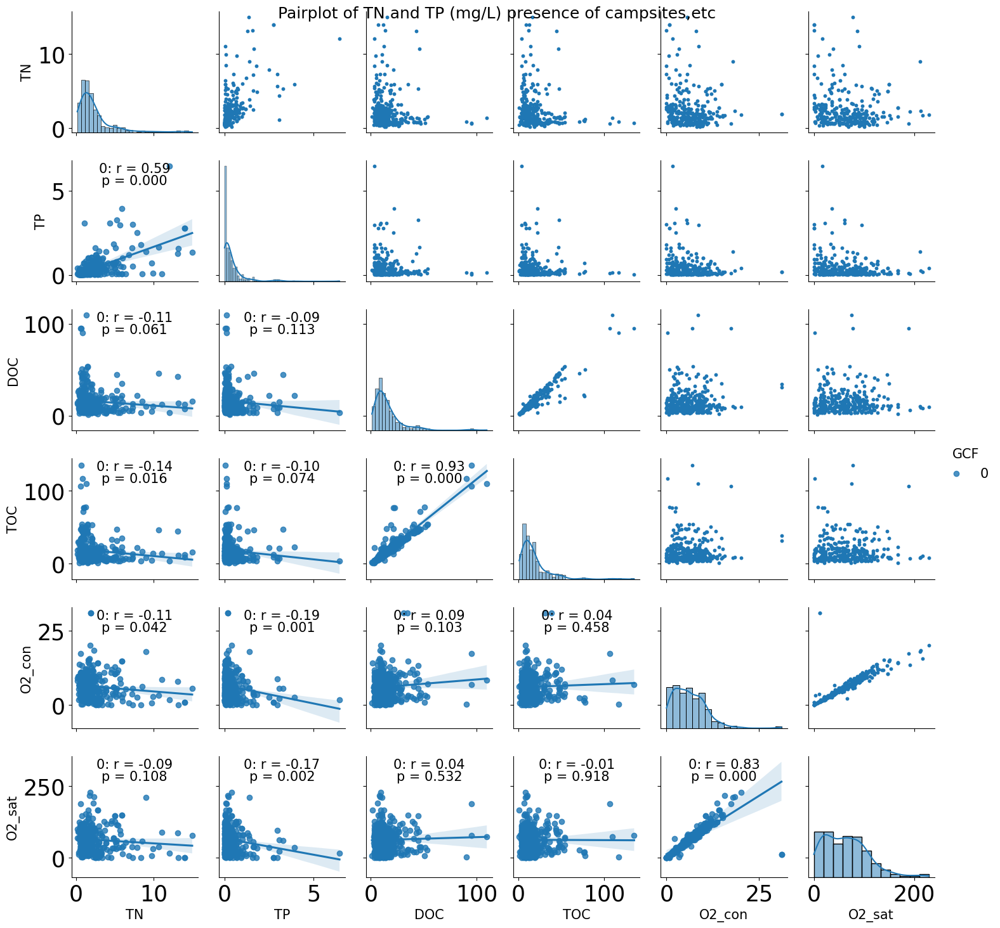

In [287]:
###Zoom in
df_clean = joined_physico_human_activity.dropna(subset=['TN', 'TP','O2_con','DOC','TOC',
                                                        'O2_sat',  bi_va])


g = sns.PairGrid(data = df_clean, vars = ['TN', 'TP','DOC','TOC','O2_con','O2_sat'], hue=bi_va)
g.map_upper(plt.scatter, s=10,)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.regplot)
g.map_lower(corrfunc)
g.add_legend()
plt.suptitle('Pairplot of TN and TP (mg/L) presence of campsites,etc')
plt.show()